<a href="https://www.kaggle.com/code/minervasdatalab/rag-based-geospatial-reasoning-for-site-discovery?scriptVersionId=247900660" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [6]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/elevation/SRTM_Elevation_Amazon.tif
/kaggle/input/srtmdem/SA_srtm_mosaic_30arcsec_reg_hgt.tif
/kaggle/input/amazon-basin-rivers/amzrivnet_v.shx
/kaggle/input/amazon-basin-rivers/amzrivnet_v.prj
/kaggle/input/amazon-basin-rivers/amzrivnet_v.sbn
/kaggle/input/amazon-basin-rivers/amzrivnet_v.dbf
/kaggle/input/amazon-basin-rivers/amzrivnet_v.sbx
/kaggle/input/amazon-basin-rivers/amzrivnet_v.shp
/kaggle/input/bioclims/bio04.tif
/kaggle/input/bioclims/bio19.tif
/kaggle/input/bioclims/bio07.tif
/kaggle/input/bioclims/bio18.tif
/kaggle/input/bioclims/bio03.tif
/kaggle/input/bioclims/bio05.tif
/kaggle/input/bioclims/bio02.tif
/kaggle/input/bioclims/bio15.tif
/kaggle/input/amazonianearth/ade.png
/kaggle/input/amazonpeerj/amazon_peerj.jpg
/kaggle/input/floodplains/SA_Updated.tif
/kaggle/input/finalrasterinputs/final_environmental_stack.tif
/kaggle/input/acrelz/RIB_A01_2014_laz_2.laz
/kaggle/input/amazontrees/treerich1.tif
/kaggle/input/different-archaeological-types/filtered_points.

# Problem Statement: Identifying Potential Archaeological Sites in the Amazon Region Using Remote Sensing, Geospatial Data and OpenAI 

### Overview:
The Amazon basin is home to rich, yet hidden, archaeological features, such as geoglyphs and other ancient settlements. However, these sites are often difficult to discover and preserve due to the dense forest cover, remote location, and lack of reliable surveying methods. This problem utilizes remote sensing data, environmental variables, machine learning clustering techniques, and advanced AI models to identify areas in the Amazon most likely to contain unknown archaeological sites based on the environmental patterns of known sites.

Additionally, Open AI GPT 4 model has been used to verify the results and develop a RAG model (Retrieval-Augmented Generation) to assist in literature synthesis. This model combines the strengths of retrieval-based search and generative AI to synthesize existing archaeological research and compare it with findings from the analysis.The RAG model can retrieve relevant literature (research papers, reports, surveys) from databases or repositories, then generate summaries and insights from those documents. This allows for context-aware recommendations and verification of identified potential sites based on previous archaeological findings. The RAG model was also used for verifying the geospatial findings.

Additionally, I also used Open AI's GPT4-Omni new flagship multimodal language model which can understand any combination of text, image and audio input and respond with outputs in any of those forms. Through this model, I drew spatially-releavnt inferences from a variety of satellite and geospatial datasets. 

#### Archaeological Data Sources

The Amazon basin is the home to several different archeological types. These include everything from ceremonial mounds to geoglyphs. The geoglyphs constitute real estate and are monumental earthen constructions related to an important period in the history of Brazil's occupation of the West Amazon by a group that built hundreds of enclosures surrounded by ditches and low walls in geometric shapes.

The geolocational data for geoglyphs was obtained from peer reviewed literature: https://hal.science/hal-02567741/document and https://www.pnas.org/doi/epdf/10.1073/pnas.1614577114 and https://jqjacobs.net/archaeology/geoglyph.html . The other arcaheological object types were ontained from- (a) PeerJ: https://peerj.com/articles/15137/ (b) https://jqjacobs.net/archaeology/geoglyph.html

In [45]:
import pandas as pd

In [46]:
points=pd.read_csv('/kaggle/input/different-archaeological-types/filtered_points.csv')

In [47]:
points.head()

,Id,type,POINT_X,POINT_Y
0,0,large platform mounds,-64.357915,-15.000864
1,1,large platform mounds,-64.774797,-14.983732
2,2,large platform mounds,-64.286531,-15.294966
3,3,large platform mounds,-64.343638,-15.172186
4,4,large platform mounds,-64.797639,-15.166475


In [ ]:
points.tail()

#### Study site- Amazon basin

In [10]:
import os
import requests

# Define the base URL and filenames
base_url = "https://raw.githubusercontent.com/gamamo/AmazonBasinLimits/master/"
filenames = [
    "amazon_sensulatissimo_gmm_v1.shp",
    "amazon_sensulatissimo_gmm_v1.shx",
    "amazon_sensulatissimo_gmm_v1.dbf",
    "amazon_sensulatissimo_gmm_v1.prj"
]

# Create a directory to store the shapefile components
os.makedirs("amazon_basin_shapefile", exist_ok=True)

# Download each file
for filename in filenames:
    url = base_url + filename
    response = requests.get(url)
    if response.status_code == 200:
        with open(os.path.join("amazon_basin_shapefile", filename), "wb") as f:
            f.write(response.content)
        print(f"Downloaded {filename}")
    else:
        print(f"Failed to download {filename}")


Downloaded amazon_sensulatissimo_gmm_v1.shp
Downloaded amazon_sensulatissimo_gmm_v1.shx
Downloaded amazon_sensulatissimo_gmm_v1.dbf
Downloaded amazon_sensulatissimo_gmm_v1.prj


In [11]:
import geopandas as gpd

# Define the path to the .shp file
shapefile_path = "amazon_basin_shapefile/amazon_sensulatissimo_gmm_v1.shp"

# Read the shapefile
gdf = gpd.read_file(shapefile_path)

# Display the first few rows
gdf.head()


,Id,area,geometry
0,0,0.46,"POLYGON ((-64.37961 -20.20885, -64.38048 -20.2..."
1,0,0.53,"POLYGON ((-64.38048 -20.20210, -64.38372 -20.2..."
2,0,0.01,"POLYGON ((-77.90818 0.20184, -77.90818 0.20762..."
3,0,0.78,"POLYGON ((-77.80988 0.31769, -77.80823 0.32050..."
4,0,0.29,"POLYGON ((-77.77430 0.40472, -77.77399 0.40869..."


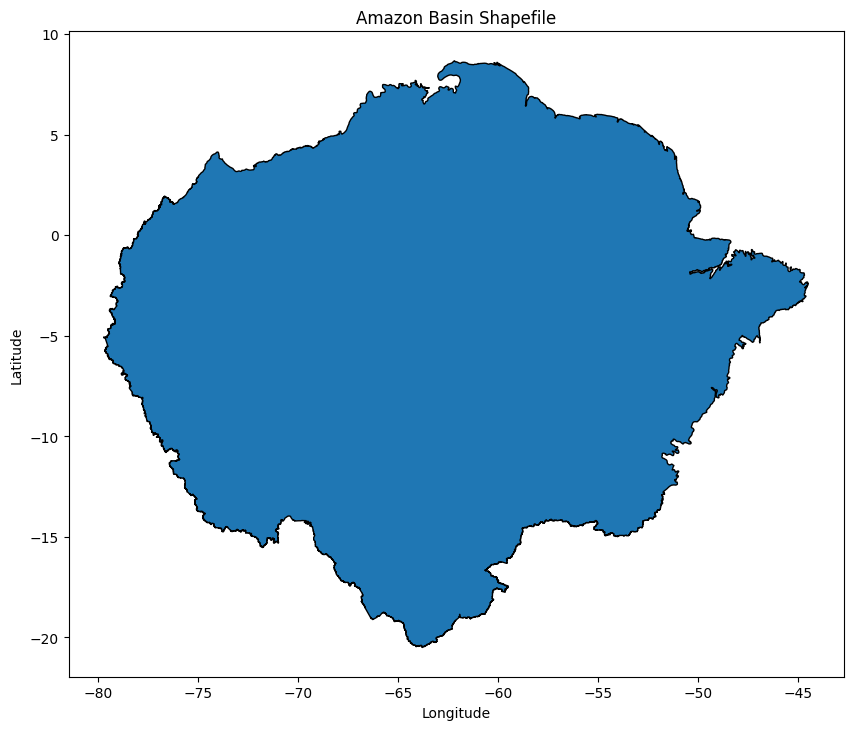

In [12]:
import matplotlib.pyplot as plt

# Plot the GeoDataFrame
gdf.plot(figsize=(10, 10), edgecolor='black')
plt.title("Amazon Basin Shapefile")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [48]:
import geopandas as gpd
from shapely.geometry import Point

# Convert to geometry column
points['geometry'] = points.apply(lambda row: Point(row['POINT_X'], row['POINT_Y']), axis=1)

# Create GeoDataFrame with appropriate CRS
points_gdf = gpd.GeoDataFrame(points, geometry='geometry', crs='EPSG:4326')  # or match gdf.crs


In [49]:
points_gdf.head()

,Id,type,POINT_X,POINT_Y,geometry
0,0,large platform mounds,-64.357915,-15.000864,POINT (-64.35792 -15.00086)
1,1,large platform mounds,-64.774797,-14.983732,POINT (-64.77480 -14.98373)
2,2,large platform mounds,-64.286531,-15.294966,POINT (-64.28653 -15.29497)
3,3,large platform mounds,-64.343638,-15.172186,POINT (-64.34364 -15.17219)
4,4,large platform mounds,-64.797639,-15.166475,POINT (-64.79764 -15.16648)


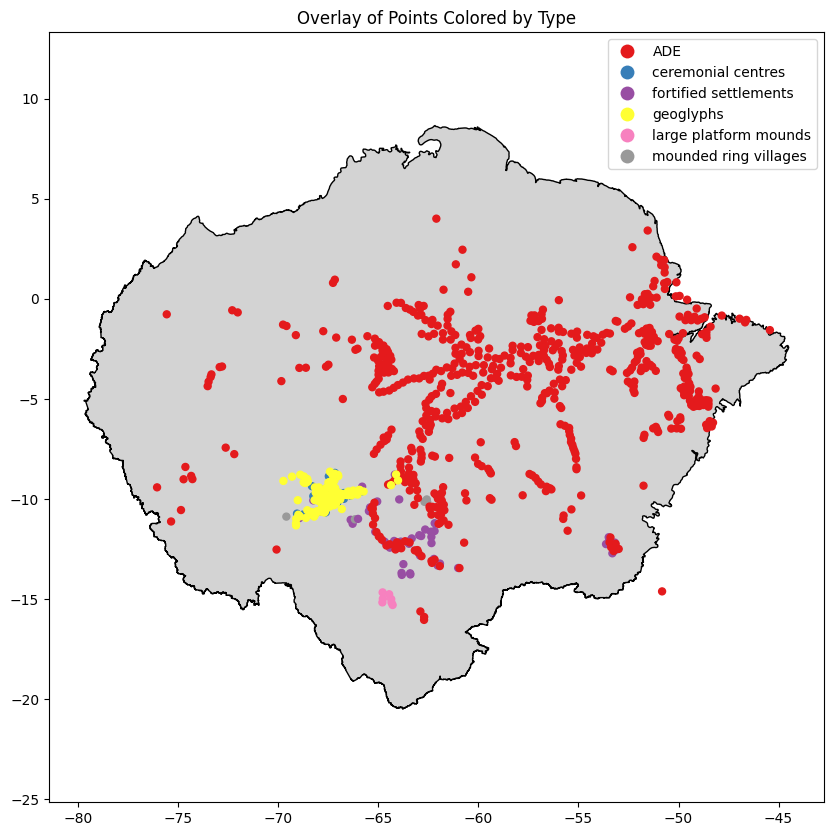

In [10]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))

# Plot base map (e.g. polygons or rasters)
gdf.plot(ax=ax, color='lightgrey', edgecolor='black')

# Overlay points, colored by 'type'
points_gdf.plot(ax=ax, column='type', legend=True, cmap='Set1', markersize=25)

# Final touches
ax.set_title("Overlay of Points Colored by Type")
plt.axis('equal')
plt.show()


#### Geospatial Data Sources

These can be found on Github- https://github.com/Jojo666/openai-to-z-challenge/tree/main/datasources 


**Rivers**: LBA-ECO CD-06 Amazon River Basin Land and Stream Drainage Direction Maps (https://daac.ornl.gov/LBA/guides/CD06_CAMREX.html)

**Brazil nut habitat suitability model**: Species distribution model (/kaggle/input/brazilnut-sdm/mergedBrazilNut_sdm.tif) was modelled using a combination of topographic and bioclimatic variables to identify the most suitable habitats for the brazil nut tree. Presence of the Brazil nut tree is associated with the presence of pre-Colimbian archaeological sites. The actual Brazil nut SDM modelling can be found here- https://github.com/Jojo666/openai-to-z-challenge/blob/main/draft_scripts/brazilNut_sdm2.ipynb
Species geolocation data can be obtained via GBIF

**Bioclimatic variables**- Bioclimatic variables (provided by WorldClim) are derived from the monthly temperature and rainfall values in order to generate more biologically meaningful variables. These are often used in species distribution modeling and related ecological modeling techniques. The bioclimatic variables represent annual trends (e.g., mean annual temperature, annual precipitation) seasonality (e.g., annual range in temperature and precipitation) and extreme or limiting environmental factors (e.g., temperature of the coldest and warmest month, and precipitation of the wet and dry quarters). A quarter is a period of three months (1/4 of the year).

**Soil variables**- Soil attrributes including texture, pH, clay content and soil organic carbon were extracted via Google Earth Engine (GEE) along bioclimatic variables via- https://github.com/Jojo666/openai-to-z-challenge/blob/main/draft_scripts/exportgeedata.py 

**Tree species richness**- Higher tree species richness is associated with the presence of previous civilizations. The data for these were obtained from- https://www.nature.com/articles/s42003-023-05514-6 .  Research also found a significant relationship between 35 domesticated tree species—including Brazil nut, Pará rubber tree, murumuru, and cacao—and the probability of earthworks (https://www.science.org/content/article/laser-mapping-reveals-hidden-structures-in-amazon-hints-thousands-more). 

**Floodplains**- The GFPLAIN250m includes raster data of Earth's floodplains identified using a geomorphic approach. They are associated with the presence of ancient human habitation (https://figshare.com/articles/dataset/GFPLAIN250m/6665165/1). 


# **Create a RAG Model For Supporting Geospatial Reasoning**

**Basic Literature Querying- RAG**

The literature used in this RAG can be found here- https://github.com/Jojo666/openai-to-z-challenge/tree/main/literature

In [53]:
!git clone https://github.com/Jojo666/openai-to-z-challenge.git
pdf_dir = "openai-to-z-challenge/literature"

Cloning into 'openai-to-z-challenge'...
remote: Enumerating objects: 241, done.
remote: Counting objects: 100% (50/50), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 241 (delta 30), reused 0 (delta 0), pack-reused 191 (from 1)
Receiving objects: 100% (241/241), 166.77 MiB | 34.04 MiB/s, done.
Resolving deltas: 100% (122/122), done.


In [54]:

!pip install -U pymupdf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.1/24.1 MB 65.2 MB/s eta 0:00:00:00:0100:01


In [13]:
import fitz  # This now works because pymupdf exposes itself as 'fitz'
import os

def extract_text_from_pdfs(pdf_folder):
    docs = []
    for file in os.listdir(pdf_folder):
        if file.endswith(".pdf"):
            path = os.path.join(pdf_folder, file)
            with fitz.open(path) as doc:
                text = "\n".join(page.get_text() for page in doc)
                docs.append({"filename": file, "text": text})
    return docs


In [56]:
!pip install -U langchain faiss-cpu openai langchain-openai langchain_community langchain_core

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 14.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 31.3/31.3 MB 52.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.0/755.0 kB 32.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.4/70.4 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 70.3 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.9/438.9 kB 22.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.7/367.7 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.2/45.2 kB 2.4 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 25.0
    Uninstalling packaging-25.0:
      Successfully uninstalled packaging-25.0
  Attempting uninstall: openai
    Found existing installation: openai 1.70.0
    Uninstalling openai-1

In [57]:
documents = extract_text_from_pdfs(pdf_dir)

Split text into chunks for embedding

In [58]:
from langchain.text_splitter import RecursiveCharacterTextSplitter

splitter = RecursiveCharacterTextSplitter(chunk_size=500, chunk_overlap=50)
texts = []
metas = []

for doc in documents:
    chunks = splitter.split_text(doc["text"])
    texts.extend(chunks)
    metas.extend([{"source": doc["filename"]}] * len(chunks))

Embed and index chunks (use FAISS or ChromaDB)

In [59]:
!pip install --upgrade openai

In [60]:
import openai

In [61]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("OpenAI")

In [62]:
import os
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Access OpenAI key from Kaggle Secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")  # "OpenAI" should be the secret label

# Create OpenAI client
client = OpenAI(api_key=openai_key)

In [63]:
!pip install faiss-cpu

In [65]:
from langchain_openai import OpenAIEmbeddings
from langchain_community.vectorstores import FAISS

# Replace with your actual key
# Initialize OpenAIEmbeddings using the key retrieved from Kaggle Secrets
embedding_model = OpenAIEmbeddings(openai_api_key=openai_key)

vectorstore = FAISS.from_texts(texts, embedding_model, metadatas=metas)

In [66]:
from langchain_openai import ChatOpenAI
from langchain.chains import RetrievalQA


In [67]:
# Initialize ChatOpenAI using the key retrieved from Kaggle Secrets
llm = ChatOpenAI(model_name="gpt-4", openai_api_key=openai_key)

In [26]:
retriever = vectorstore.as_retriever(search_kwargs={"k": 5})
qa_chain = RetrievalQA.from_chain_type(llm=llm, retriever=retriever)

response1 = qa_chain.run("Summarize findings about Amazonian archeological sites.")
print(response1)

/tmp/ipykernel_35/725683449.py:4: LangChainDeprecationWarning: The method `Chain.run` was deprecated in langchain 0.1.0 and will be removed in 1.0. Use :meth:`~invoke` instead.
  response1 = qa_chain.run("Summarize findings about Amazonian archeological sites.")


The archaeological studies across the Amazon region have revealed several significant findings. Researchers have used recent compilations and satellite-aided remote sensing to locate numerous archaeological sites including 510 ADEs, 1,100 earthworks, and 422 other sites. The majority of the earthworks are clearly visible in satellite imagery. In the southern, southwestern, central, and northern Amazonia regions, numerous hitherto unreported earthworks were located. A fortified village was discovered in southern Amazonia, along with defensive and ceremonial sites in the southwest. In the Guiana Shield area, researchers found crowned mountains and megalithic structures. The Central Amazonia floodplains revealed riverine sites. Research in the Peruvian Amazon shows that around the end of the fifteenth century, the average Amazonian indigenous person lived within a flourishing regional system of Mound Villages, rather than in isolated, autonomous villages, which challenges conventional dep

In [27]:
response2 = qa_chain.run("Summarize findings about Amazonian geoglyphs.")
print(response2)

The Amazonian geoglyphs are a significant archaeological discovery in western Amazonia. These large-scale ditched geometric earthworks were built and used sporadically as ceremonial and public gathering sites between 2000 and 650 years ago, but some may have been constructed as early as 3500–3000 years ago. Researchers believe the geoglyphs were built by a complex network of local groups. Even after the construction of these geoglyphs ceased around AD 950, the region continued to be occupied by a thriving system of Mound Villages, challenging the belief that this part of the Amazon was sparsely populated. In fact, this discovery questions the concept of Amazonian rainforests as pristine, uninhabited wilderness, instead suggesting significant human impacts and settlement in the region.


In [70]:
response2b = qa_chain.run("Is there any connection between Amazonian archaeological sites and brazil nuts")
print(response2b)

/tmp/ipykernel_35/2223986006.py:1: LangChainDeprecationWarning: The method `Chain.run` was deprecated in langchain 0.1.0 and will be removed in 1.0. Use :meth:`~invoke` instead.
  response2b = qa_chain.run("Is there any connection between Amazonian archaeological sites and brazil nuts")


Yes, there is a connection between Amazonian archaeological sites and Brazil nuts. The study discussed above hypothesizes that the chances of encountering Brazil nuts are higher near terra preta or Amazonian Dark Earth soils (ADE) and geoglyphs, which are often found at archaeological sites. The concentrations of Brazil-nut trees are most noticeable around old human settlements near the Amazon and Madeira rivers. Therefore, pre-Columbian human land-use activities may have influenced the present-day occurrence of Brazil nuts.


**Enrich the RAG Model For Visual Imagery**

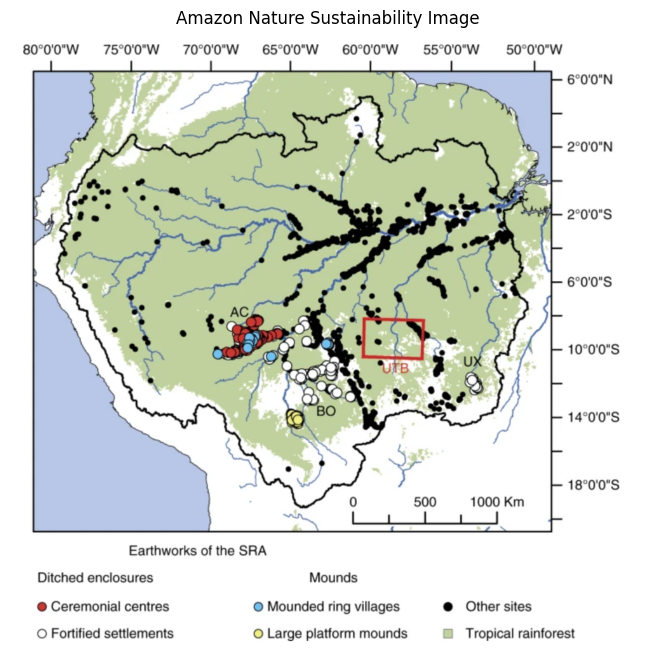

In [29]:
import matplotlib.pyplot as plt
from PIL import Image

# Load the image
image_path = "/kaggle/input/amazon-naturesust/amazon_natSust.png"
img = Image.open(image_path)

# Display the image
plt.figure(figsize=(10, 8))
plt.imshow(img)
plt.axis('off')  # Hide axis
plt.title("Amazon Nature Sustainability Image")
plt.show()


In [39]:
retrieved_text = qa_chain.run("Summarize findings about Amazonian archeological sites.")


In [40]:
image_paths = {
    "earthworks_map": "/kaggle/input/amazon-naturesust/amazon_natSust.png",
    "geoglyph_example": "/kaggle/input/geoglyphlook/geogEg.jpg",
    "main_river_network": "/kaggle/input/main-amazon-rivers-image/mainRivs.jpg"
}


In [41]:
import base64
import os

images_base64 = {}

for label, path in image_paths.items():
    with open(path, "rb") as img_file:
        encoded = base64.b64encode(img_file.read()).decode("utf-8")
        images_base64[label] = encoded


In [42]:
from openai import OpenAI

client = OpenAI(api_key=openai_key)

response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": [
                {
                    "type": "text",
                    "text": f"""
You are analyzing archaeological patterns in Amazonia using textual summaries and satellite-derived images.

### Textual Findings:
{retrieved_text}

### Task:
- Explain how the provided images visually support the discovery or spatial distribution of archaeological features.
- Highlight how earthworks, rivers, or site clustering are visible.
- Focus on geospatial patterns, not vegetation or bamboo.

Avoid discussing plant types or forest cover unless clearly shown in the images.
"""
                },
                {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{images_base64['earthworks_map']}"}},
                {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{images_base64['geoglyph_example']}"}},
                {"type": "image_url", "image_url": {"url": f"data:image/jpeg;base64,{images_base64['main_river_network']}"}}
            ]
        }
    ],
    temperature=0.4
)

print(response.choices[0].message.content)


The provided images visually support the discovery and spatial distribution of archaeological features in Amazonia through several key aspects:

1. **Spatial Distribution of Sites**:
   - The first map highlights the distribution of various archaeological features across Amazonia, including ceremonial centers, fortified settlements, mounded ring villages, and large platform mounds. The clustering of sites, especially in southern and southwestern Amazonia, supports the textual findings of a flourishing regional system of mound villages.

2. **Earthworks Visibility**:
   - The second image shows a satellite view of a geoglyph near the Rio Abuna, clearly outlining the earthwork's shape and size. This visual evidence supports the presence of unreported earthworks in the region, emphasizing the complexity and scale of these structures.

3. **Rivers and Site Clustering**:
   - The third map provides a broader geographical context, showing major rivers across the Amazon Basin. The proximity o

**A more dynamic literature retrieval**

In [71]:
from langchain_openai import OpenAIEmbeddings
from langchain.vectorstores import FAISS
from langchain.chains import RetrievalQA
from langchain_openai.chat_models import ChatOpenAI

In [72]:
def convert_to_documents(papers):
    docs = []
    for paper in papers:
        content = paper.get("abstract", "No abstract available")
        metadata = {
            "title": paper["title"],
            "year": paper.get("year"),
            "url": paper.get("url") or paper.get("openAccessPdf", {}).get("url"),
            "authors": [a["name"] for a in paper.get("authors", [])]
        }
        if content:
            docs.append({"content": content, "metadata": metadata})
    return docs


In [73]:
from langchain.schema import Document

def to_langchain_docs(docs):
    return [
        Document(page_content=d["content"], metadata=d["metadata"])
        for d in docs
    ]

In [74]:
import requests

def search_semantic_scholar(query, limit=10):
    url = "https://api.semanticscholar.org/graph/v1/paper/search"
    params = {
        "query": query,
        "limit": limit,
        "fields": "title,authors,year,abstract"
    }

    try:
        response = requests.get(url, params=params, timeout=10)
        print("Response status:", response.status_code)

        if response.status_code == 200:
            data = response.json()
            return data
        else:
            print(f"Error: Received status code {response.status_code}")
            print("Response text:", response.text)
            return None

    except requests.exceptions.Timeout:
        print("Error: Request timed out.")
    except requests.exceptions.ConnectionError:
        print("Error: Connection error occurred.")
    except requests.exceptions.HTTPError as http_err:
        print(f"HTTP error occurred: {http_err}")
    except requests.exceptions.RequestException as e:
        print(f"An error occurred: {e}")

    return None

In [75]:
def create_vector_store(documents):
    embeddings = OpenAIEmbeddings()
    vectorstore = FAISS.from_documents(documents, embedding=embeddings)
    return vectorstore

In [ ]:
#query = "Amazon LiDAR archaeology Sentinel"

In [76]:
import requests
import os
from time import sleep
from kaggle_secrets import UserSecretsClient
from langchain_core.documents import Document
from langchain_openai import OpenAIEmbeddings, ChatOpenAI
from langchain.vectorstores import FAISS
from langchain.chains import RetrievalQA

# ===== Configuration =====
MAX_RESULTS = 20  # Maximum papers to fetch
SEMANTIC_SCHOLAR_DELAY = 3  # Seconds between API calls
RETRY_DELAY = 10  # Seconds to wait if rate limited
MAX_ATTEMPTS = 2  # Maximum retry attempts

# ===== Helper Functions =====
def search_semantic_scholar(query, limit=10):
    """Search Semantic Scholar with rate limit handling"""
    url = f"https://api.semanticscholar.org/graph/v1/paper/search?query={query}&limit={limit}&fields=title,abstract,authors,year,url"
    try:
        sleep(SEMANTIC_SCHOLAR_DELAY)
        response = requests.get(url)
        if response.status_code == 429:
            print(f"Rate limited. Waiting {RETRY_DELAY} seconds...")
            sleep(RETRY_DELAY)
            return None
        response.raise_for_status()
        return response.json()
    except requests.exceptions.RequestException as e:
        print(f"API Error: {str(e)}")
        return None

def create_documents(papers):
    """Convert API results to LangChain Documents with safe metadata handling"""
    documents = []
    for paper in papers:
        # Safely extract all fields with defaults
        metadata = {
            'title': paper.get('title', 'Untitled'),
            'authors': ', '.join([a.get('name', 'Unknown') for a in paper.get('authors', [])]),
            'year': str(paper.get('year', 'Unknown year')),
            'url': paper.get('url', 'No URL available')
        }
        
        documents.append(Document(
            page_content=f"Title: {metadata['title']}\nAbstract: {paper.get('abstract', 'No abstract available')}",
            metadata=metadata
        ))
    return documents

def display_results(answer, sources):
    """Format and display the QA results"""
    print("\n=== ANSWER ===")
    print(answer)
    
    if sources:
        print("\n=== SOURCES ===")
        for i, doc in enumerate(sources, 1):
            meta = doc.metadata
            print(f"{i}. {meta['title']} ({meta['year']})")
            print(f"   Authors: {meta['authors']}")
            print(f"   URL: {meta['url']}\n")

# ===== Main Pipeline =====
def run_pipeline(query):
    """Execute the full RAG pipeline"""
    # Load API keys
    user_secrets = UserSecretsClient()
    os.environ["OPENAI_API_KEY"] = user_secrets.get_secret("OpenAI")
    
    if not os.environ["OPENAI_API_KEY"]:
        print("Error: OpenAI API key not found in Kaggle Secrets")
        return
    
    # Try multiple times if rate limited
    results = None
    for attempt in range(MAX_ATTEMPTS):
        results = search_semantic_scholar(query, limit=MAX_RESULTS)
        if results:
            break
        sleep(RETRY_DELAY)
    
    if not results:
        print("Failed to get results after multiple attempts. Please try again later.")
        return
    
    if not results.get('data'):
        print("No papers found for this query")
        return
    
    # Process papers
    papers = results['data'][:MAX_RESULTS]
    documents = create_documents(papers)
    
    # Create vector store
    embeddings = OpenAIEmbeddings()
    vectorstore = FAISS.from_documents(documents, embeddings)
    
    # Create QA chain
    qa_chain = RetrievalQA.from_chain_type(
        llm=ChatOpenAI(model="gpt-4", temperature=0.3),
        retriever=vectorstore.as_retriever(search_kwargs={"k": min(3, len(documents))}),
        return_source_documents=True
    )
    
    # Get answer
    response = qa_chain.invoke({"query": query})
    display_results(response['result'], response['source_documents'])

# ===== Execution =====
if __name__ == "__main__":
    query2 = "Amazon elevation archaeology geoglyphs brazil nuts"
    run_pipeline(query2)


=== ANSWER ===
The research papers discuss the discovery and study of pre-Colonial geoglyphs in the Amazon, which are geometric structures outlined by trenches or walls. These geoglyphs were discovered using LiDAR data, which is a method that uses light detection and ranging to measure variable distances to the Earth. This method can be time-consuming and inaccurate due to the need to constantly adjust the contrasts of the elevation image or the parameter of the hillshading function. However, a new method was presented to enhance the anomaly of the terrain without using focal operations to normalize the elevation of each pixel in relation to its neighbors. This method allows for a faster visual assessment of relief anomaly and the presence of geoglyphs in large LiDAR datasets. 

In addition, the societies that built these geoglyphs harvested and consumed both wild and domesticated palm fruits, Brazil nuts, and other identified species in the first millennium of the Common Era. This in

**Reported Findings**


**Summary of Archaeological Type Discovery Framework:**

I developed a hybrid geospatial framework combining unsupervised clustering, supervised classification, and LLM-guided reasoning to explore likely regions of undiscovered geoglyphs in the Amazon. First, we compiled a multi-band environmental raster stack (BIOCLIM, soil, Brazil nut suitability, etc.) 

TBC


# **Read and process the geospatial raster data**

The geospatial rasters listed above all had different extents and resolutions. They were processed and stacked together into a final predictor raster stack (final_environmental_stack.tif) in this script: https://www.kaggle.com/code/minervasdatalab/bandprocess

In [43]:
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 68.8 MB/s eta 0:00:00:00:0100:01


In [ ]:

#import rasterio

# Path to the .tif file in Kaggle input
#raster_path = '/kaggle/input/predictors-nodem/processed_environmental_stack.tif'

# Open the .tif file using rasterio
#with rasterio.open(raster_path) as src:
    # Read the raster data (you can specify which band to read if you have multiple bands)
   # data = src.read(1)  # Read the first band (if it's a multi-band raster, adjust accordingly)
    
    # Get metadata about the raster (CRS, transform, etc.)
   # meta = src.meta

# Print the shape and metadata to confirm it's read properly
#print("Data shape:", data.shape)
#print("Metadata:", meta)

# Optionally, visualize the raster data (if it's a 2D array)
#import matplotlib.pyplot as plt

#plt.figure(figsize=(10, 7))
#plt.imshow(data, cmap='viridis')  # Adjust the colormap as needed
#plt.colorbar()
#plt.title("Visualized Raster Data")
#plt.axis("off")
#plt.show()


In [44]:
import numpy as np
import rasterio
from rasterio.mask import mask
from rasterio.warp import reproject, Resampling
import matplotlib.pyplot as plt



Successfully created final stack with:
- Original 14 environmental bands
- Elevation (range: -47.0m to 6255.4m)
- Slope (range: 0.0° to 90.0°)
- Floodplains (values: [0. 1.])


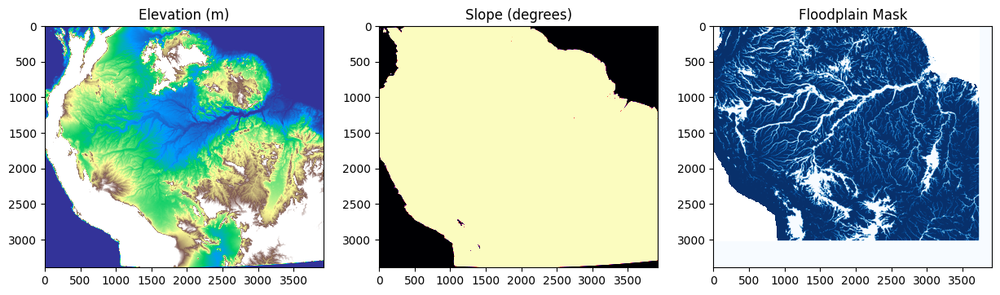

In [45]:
import rasterio
import numpy as np
from rasterio.warp import reproject, Resampling
from scipy.ndimage import sobel
import warnings
from rasterio.windows import from_bounds

# Suppress runtime warnings
warnings.filterwarnings("ignore", category=RuntimeWarning)

# 1. Load existing stack
with rasterio.open('/kaggle/input/predictors-nodem/processed_environmental_stack.tif') as src:
    stack = src.read()
    profile = src.profile.copy()  # Create a copy to modify
    band_names = list(src.descriptions)
    transform = src.transform
    pixel_size = transform[0]  # Assumes square pixels
    height, width = src.shape
    stack_bounds = src.bounds  # Get bounds for floodplain clipping

# 2. Process elevation data
with rasterio.open('/kaggle/input/elevation/SRTM_Elevation_Amazon.tif') as elev_src:
    elevation = np.empty((height, width), dtype=np.float32)
    reproject(
        source=elev_src.read(1),
        destination=elevation,
        src_transform=elev_src.transform,
        src_crs=elev_src.crs,
        dst_transform=transform,
        dst_crs=profile['crs'],
        resampling=Resampling.bilinear
    )
    
    # Compute slope
    dx = sobel(elevation, axis=1) / (8 * pixel_size)
    dy = sobel(elevation, axis=0) / (8 * pixel_size)
    slope = np.degrees(np.arctan(np.sqrt(dx**2 + dy**2)))

# 3. Process floodplain data (new addition)
with rasterio.open('/kaggle/input/floodplains/SA_Updated.tif') as flood_src:
    # Create window for reading just our area of interest
    window = from_bounds(*stack_bounds, transform=flood_src.transform)
    
    # Read and reproject floodplain data
    floodplains = np.empty((height, width), dtype=np.float32)
    reproject(
        source=flood_src.read(1, window=window, boundless=True),
        destination=floodplains,
        src_transform=flood_src.transform,
        src_crs=flood_src.crs,
        dst_transform=transform,
        dst_crs=profile['crs'],
        resampling=Resampling.mode  # Best for categorical data
    )
    floodplains = np.where(floodplains == flood_src.nodata, np.nan, floodplains)

# 4. Combine all bands
enhanced_stack = np.concatenate([
    stack,  # Original bands
    elevation[np.newaxis, ...],  # Elevation
    slope[np.newaxis, ...],  # Slope
    floodplains[np.newaxis, ...]  # Floodplains
], axis=0)

# 5. Update metadata
profile.update({
    'count': enhanced_stack.shape[0],
    'dtype': 'float32',
    'nodata': -9999  # Standardize nodata value
})
new_band_names = band_names + ['elevation', 'slope_degrees', 'floodplain_mask']

# 6. Save final stack
with rasterio.open('/kaggle/working/final_environmental_stack.tif', 'w', **profile) as dst:
    dst.write(enhanced_stack)
    for i, name in enumerate(new_band_names, 1):
        dst.set_band_description(i, name)

# Verification
print("\nSuccessfully created final stack with:")
print(f"- Original {len(band_names)} environmental bands")
print(f"- Elevation (range: {elevation.min():.1f}m to {elevation.max():.1f}m)")
print(f"- Slope (range: {slope.min():.1f}° to {slope.max():.1f}°)")
print(f"- Floodplains (values: {np.unique(floodplains[~np.isnan(floodplains)])})")

# Visual check
plt.figure(figsize=(15,5))
plt.subplot(131)
plt.imshow(elevation, cmap='terrain', vmin=0, vmax=500)
plt.title('Elevation (m)')
plt.subplot(132)
plt.imshow(slope, cmap='magma', vmin=0, vmax=30)
plt.title('Slope (degrees)')
plt.subplot(133)
plt.imshow(floodplains, cmap='Blues')
plt.title('Floodplain Mask')
plt.show()

In [46]:
import rasterio

# Open the final stack
with rasterio.open('/kaggle/working/final_environmental_stack.tif') as src:
    # Get all band descriptions
    band_names = src.descriptions
    
    # Print with band numbers
    print("Band # | Band Name")
    print("-------|----------")
    for i, name in enumerate(band_names, 1):
        print(f"{i:6} | {name}")

Band # | Band Name
-------|----------
     1 | bio04_temperature_seasonality
     2 | bio19_precipitation_coldest_quarter
     3 | bio07_temperature_annual_range
     4 | bio18_precipitation_warmest_quarter
     5 | bio03_isothermality
     6 | bio05_max_temp_warmest_month
     7 | bio02_mean_diurnal_range
     8 | bio15_precipitation_seasonality
     9 | soil_clay_content
    10 | soil_ph
    11 | soil_organic_carbon
    12 | soil_texture
    13 | brazilnut_sdm
    14 | tree_species_richness
    15 | elevation
    16 | slope_degrees
    17 | floodplain_mask


In [47]:
from scipy.ndimage import distance_transform_edt

with rasterio.open('/kaggle/working/final_environmental_stack.tif') as src:
    floodplain = src.read(src.descriptions.index('floodplain_mask')+1)
    dist_to_floodplain = distance_transform_edt(~(floodplain == 1)) * src.res[0]  # In meters

In [ ]:
#import os
#import zipfile
#import rasterio
#from osgeo import gdal

# 1. Save the final stack (with all bands)
#with rasterio.open('/kaggle/working/final_environmental_stack.tif', 'w', **profile) as dst:
   # dst.write(enhanced_stack)
   # for i, name in enumerate(new_band_names, 1):
   #     dst.set_band_description(i, name)

# 2. Create compressed version
#!gdal_translate -co "COMPRESS=LZW" -co "TILED=YES" \
#  /kaggle/working/final_environmental_stack.tif \
#  /kaggle/working/final_stack_compressed.tif

# 3. Package both versions
#output_files = [
#    '/kaggle/working/final_environmental_stack.tif',
#    '/kaggle/working/final_stack_compressed.tif'
#]

# 4. Create zip archive
#zip_path = '/kaggle/working/archaeology_stack.zip'
#with zipfile.ZipFile(zip_path, 'w') as zipf:
   # for f in output_files:
   #     if os.path.exists(f):
   #         arcname = os.path.basename(f)
   #         zipf.write(f, arcname=arcname)
   #         print(f"Added {arcname} ({os.path.getsize(f)/1024/1024:.1f} MB)")
   #     else:
   #         print(f"Warning: {f} not found")

# 5. Generate download link
#from IPython.display import FileLink
#print("\nDownload your stack:")
#FileLink(zip_path)

# 6. Verification
#print("\nFinal stack contains these bands:")
#for i, name in enumerate(new_band_names, 1):
##    print(f"{i}. {name}")

#print("\nTo use in future notebooks:")
#print(f"Path: '/kaggle/input/YOUR_DATASET_NAME/{os.path.basename(output_files[0])}'")

**Let's examine our raster data and the archeological types**

In [15]:
import rasterio
import matplotlib.pyplot as plt
import geopandas as gpd

# Define band names (in order)
band_names = [
    "bio04_temperature_seasonality",
    "soil_clay_content",
    "brazilnut_sdm",
    "tree_species_richness",
    "elevation",
    "floodplain_mask"
]

# Open the raster
raster_path = "/kaggle/working/final_environmental_stack.tif"
src = rasterio.open(raster_path)


In [16]:
# Reproject points to raster CRS
points_gdf = points_gdf.to_crs(src.crs)


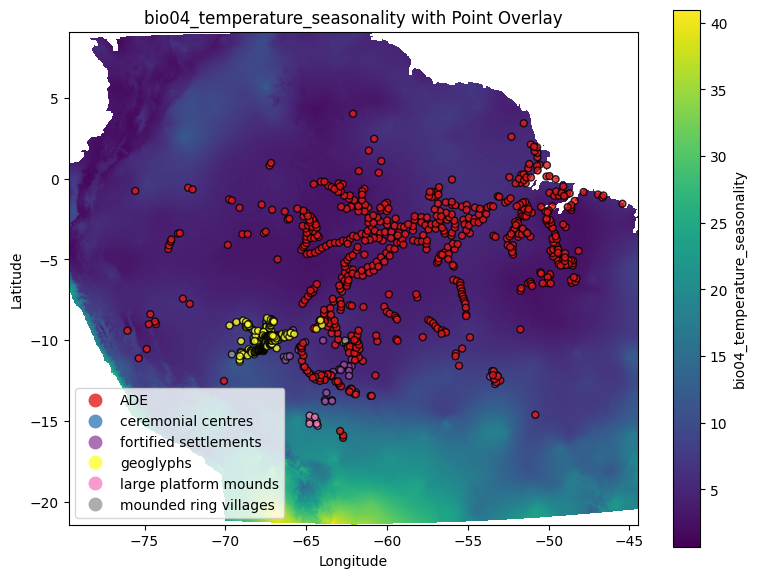

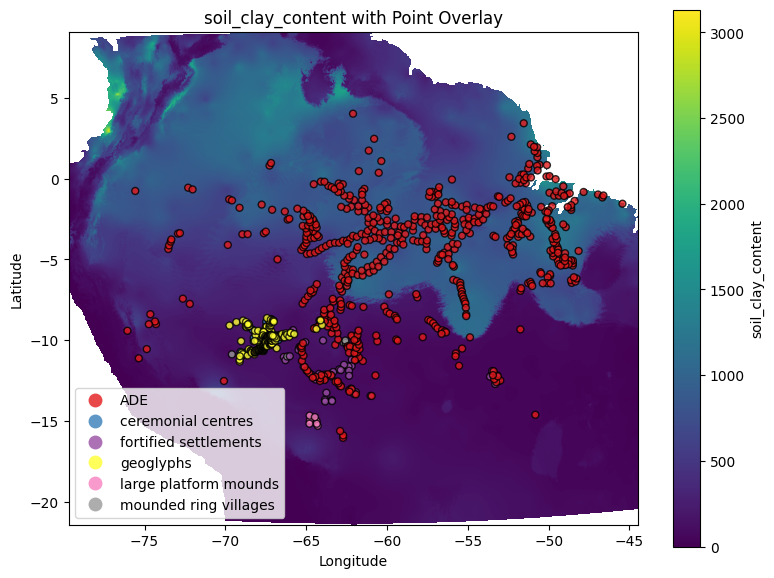

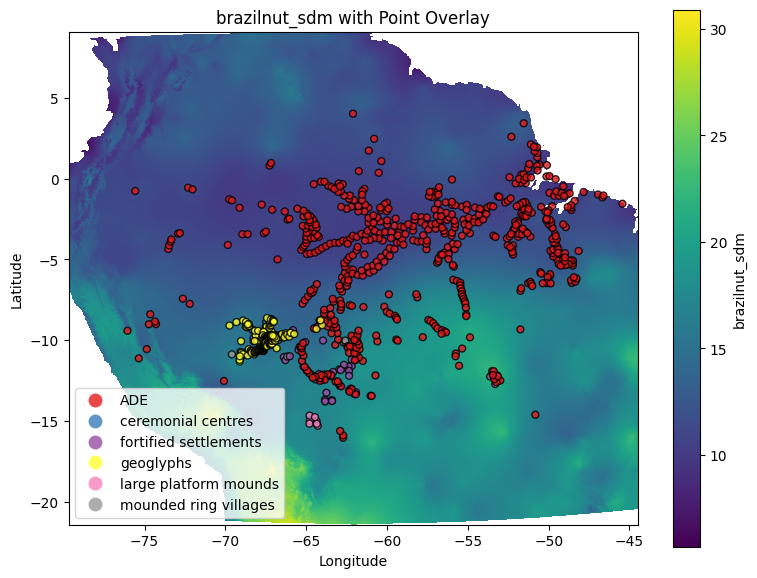

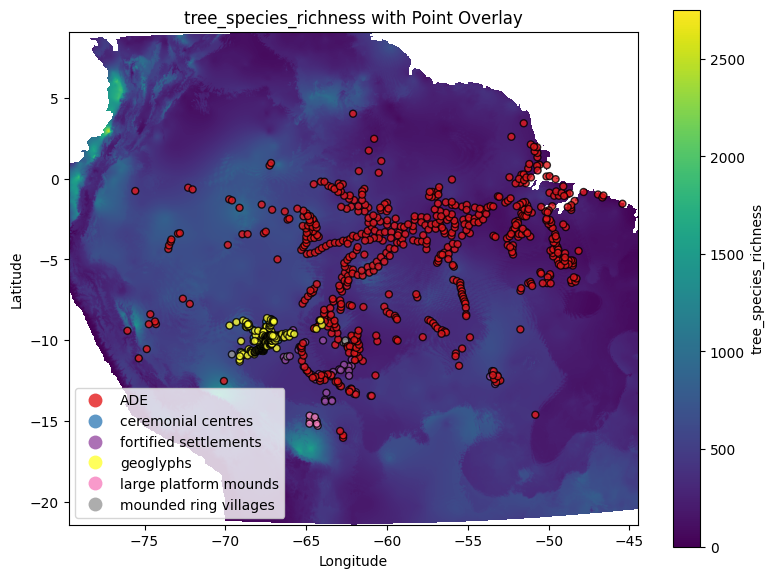

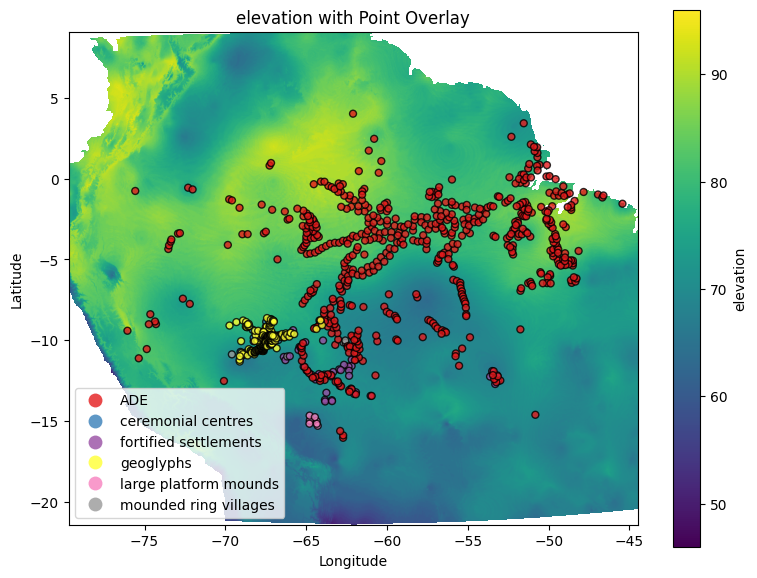

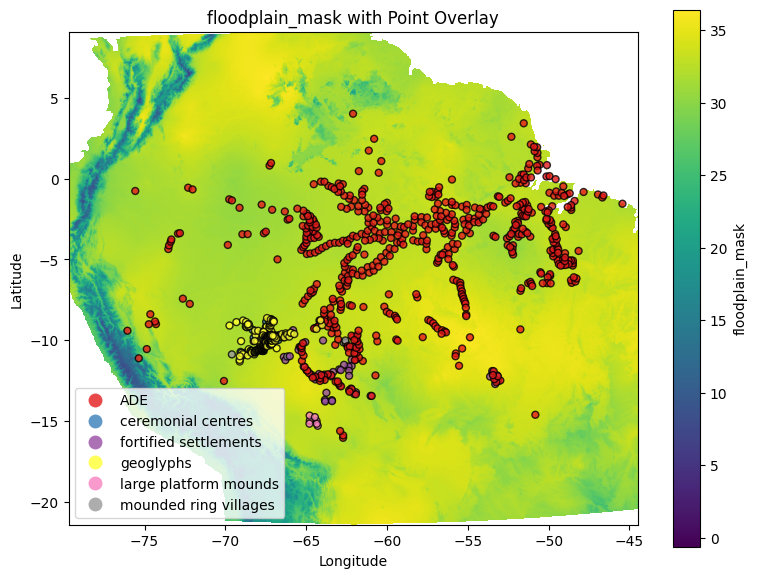

In [17]:
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Define band names in correct order
band_names = [
    "bio04_temperature_seasonality",
    "soil_clay_content",
    "brazilnut_sdm",
    "tree_species_richness",
    "elevation",
    "floodplain_mask"
]

# Load raster
raster_path = "/kaggle/working/final_environmental_stack.tif"
src = rasterio.open(raster_path)

# Reproject points to match raster CRS
points_gdf = points_gdf.to_crs(src.crs)

# Visualization loop for matching band count and names
for i in range(1, min(src.count, len(band_names)) + 1):
    band = src.read(i)
    band_name = band_names[i - 1]
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Show raster band with georeferenced extent
    raster_plot = ax.imshow(
        band,
        cmap='viridis',
        norm=Normalize(vmin=np.nanmin(band), vmax=np.nanmax(band)),
        extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
    )
    
    # Overlay points, colored by type
    points_gdf.plot(
        ax=ax,
        column='type',
        cmap='Set1',
        markersize=25,
        legend=True,
        alpha=0.8,
        edgecolor='black'
    )
    
    ax.set_title(f"{band_name} with Point Overlay")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_aspect('equal')
    plt.colorbar(raster_plot, ax=ax, label=band_name)
    plt.tight_layout()
    plt.show()


In [18]:
import geopandas as gpd

# Path to shapefile (.shp is the main file, others are sidecars)
river_path = "/kaggle/input/amazon-basin-rivers/amzrivnet_v.shp"
rivers_gdf = gpd.read_file(river_path)

# Inspect and confirm it's loaded
print(rivers_gdf.crs)
rivers_gdf.head()


EPSG:4008


,LENGTH,AMZRIVNET_,AMZRIVNET1,geometry
0,0.219754,1,191,"LINESTRING (-60.12193 5.24393, -60.11828 5.238..."
1,0.248080,2,203,"LINESTRING (-59.86641 5.24724, -59.87381 5.236..."
2,0.035331,3,203,"LINESTRING (-60.00000 5.08645, -59.97512 5.081..."
3,0.277628,4,191,"LINESTRING (-60.20430 5.25423, -60.19722 5.246..."
4,0.076595,5,203,"LINESTRING (-59.96942 5.07308, -59.96992 5.064..."


In [19]:
# Reproject rivers to match the raster's CRS
rivers_gdf = rivers_gdf.to_crs(src.crs)


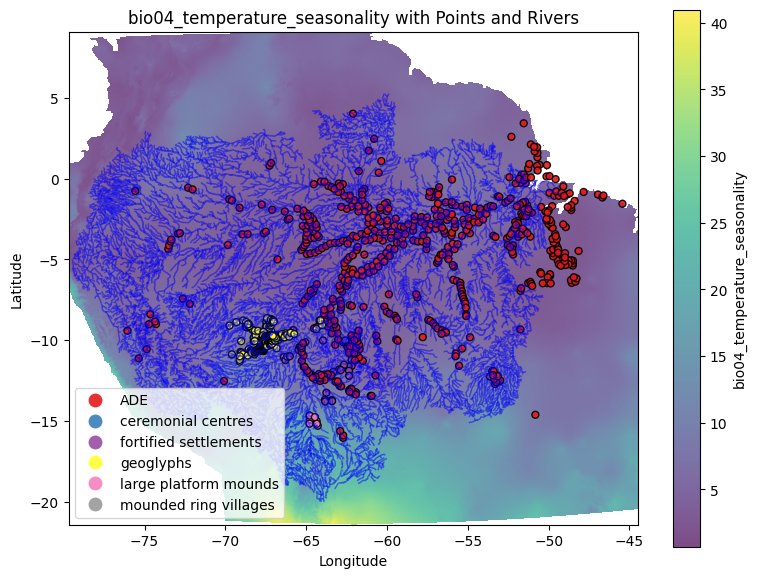

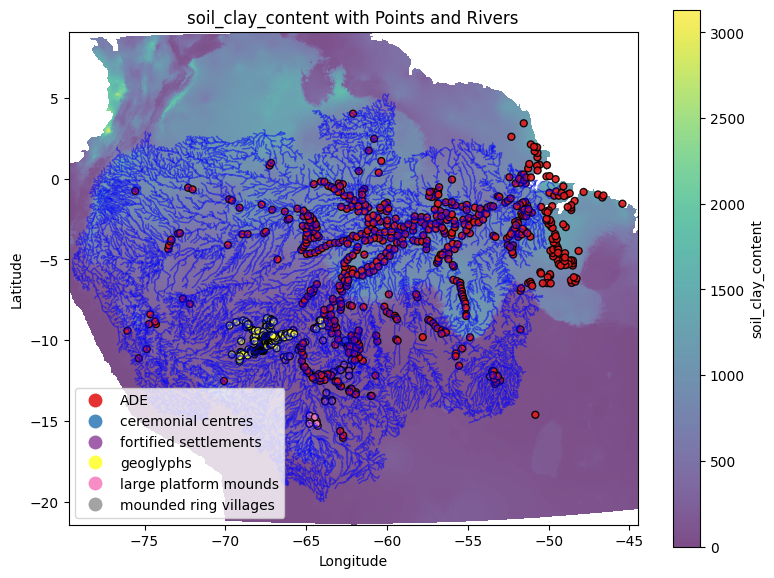

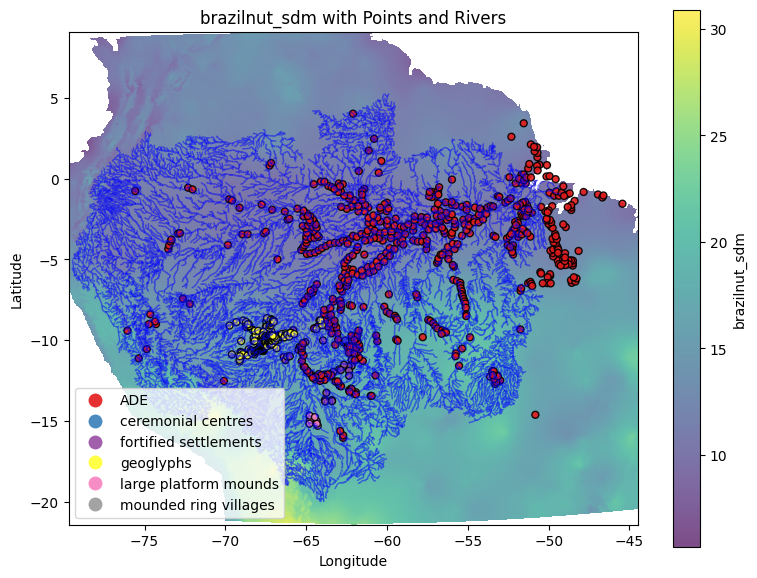

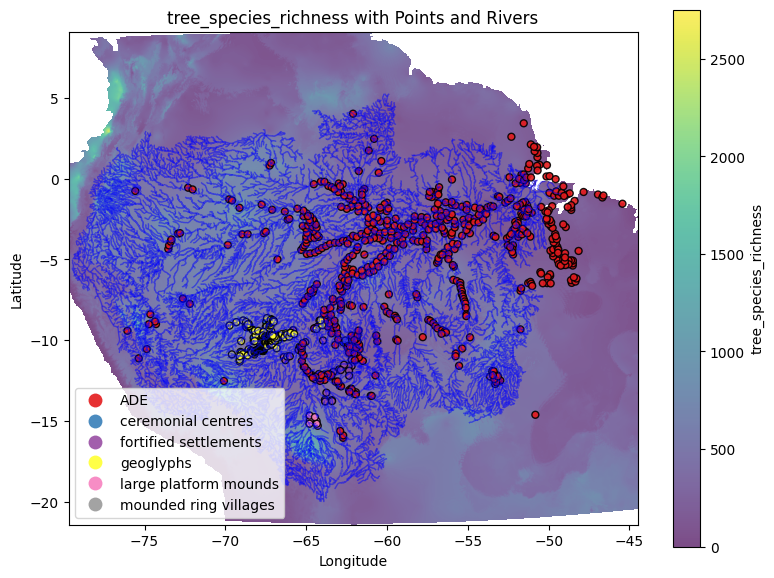

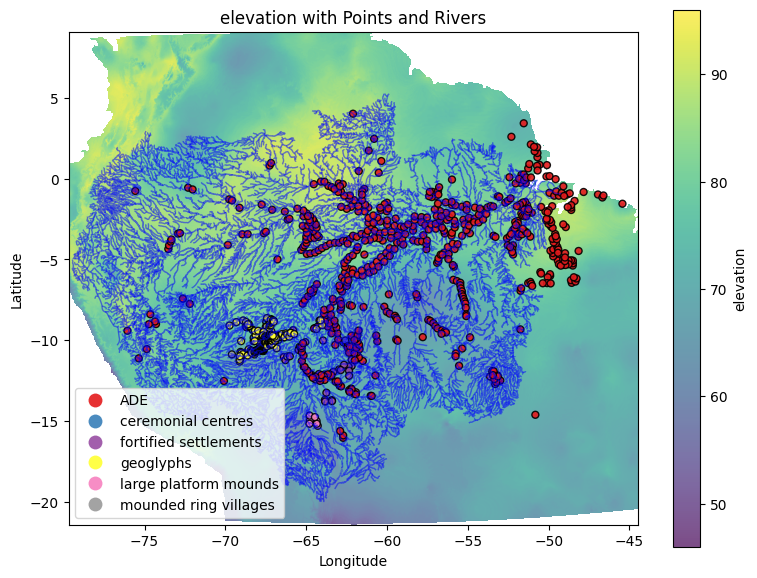

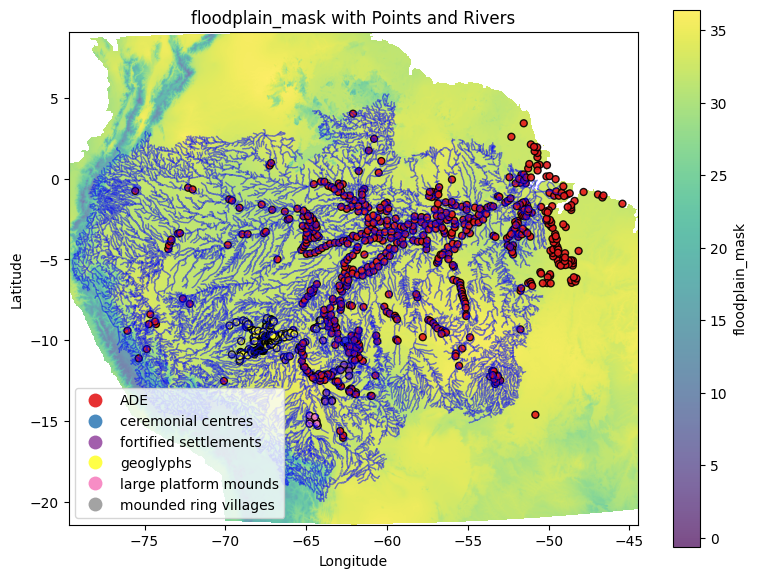

In [20]:
for i in range(1, min(src.count, len(band_names)) + 1):
    band = src.read(i)
    band_name = band_names[i - 1]
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Plot raster band with 70% opacity
    raster_plot = ax.imshow(
        band,
        cmap='viridis',
        norm=Normalize(vmin=np.nanmin(band), vmax=np.nanmax(band)),
        extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
        alpha=0.7  # 30% transparent
    )
    
    # Overlay rivers with 50% opacity
    rivers_gdf.plot(
        ax=ax,
        color='blue',
        linewidth=1,
        alpha=0.5,  # 50% transparent
        label='Rivers'
    )
    
    # Overlay points (on top)
    points_gdf.plot(
        ax=ax,
        column='type',
        cmap='Set1',
        markersize=25,
        legend=True,
        alpha=0.9,
        edgecolor='black'
    )
    
    ax.set_title(f"{band_name} with Points and Rivers")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_aspect('equal')
    plt.colorbar(raster_plot, ax=ax, label=band_name)
    plt.tight_layout()
    plt.show()


**Convert to base64**

In [21]:
import base64
from io import BytesIO

# Store base64 images
base64_images = []

for i in range(1, min(src.count, len(band_names)) + 1):
    band = src.read(i)
    band_name = band_names[i - 1]
    
    fig, ax = plt.subplots(figsize=(8, 6))
    
    raster_plot = ax.imshow(
        band,
        cmap='viridis',
        norm=Normalize(vmin=np.nanmin(band), vmax=np.nanmax(band)),
        extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
        alpha=0.7
    )
    
    rivers_gdf.plot(
        ax=ax,
        color='blue',
        linewidth=1,
        alpha=0.5,
        label='Rivers'
    )
    
    points_gdf.plot(
        ax=ax,
        column='type',
        cmap='Set1',
        markersize=25,
        legend=True,
        alpha=0.9,
        edgecolor='black'
    )
    
    ax.set_title(f"{band_name} with Points and Rivers")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_aspect('equal')
    plt.colorbar(raster_plot, ax=ax, label=band_name)
    plt.tight_layout()

    # Save to BytesIO
    buffer = BytesIO()
    plt.savefig(buffer, format="png", bbox_inches='tight')
    buffer.seek(0)

    # Convert to base64
    image_base64 = base64.b64encode(buffer.read()).decode("utf-8")
    base64_images.append((band_name, image_base64))
    
    plt.close()


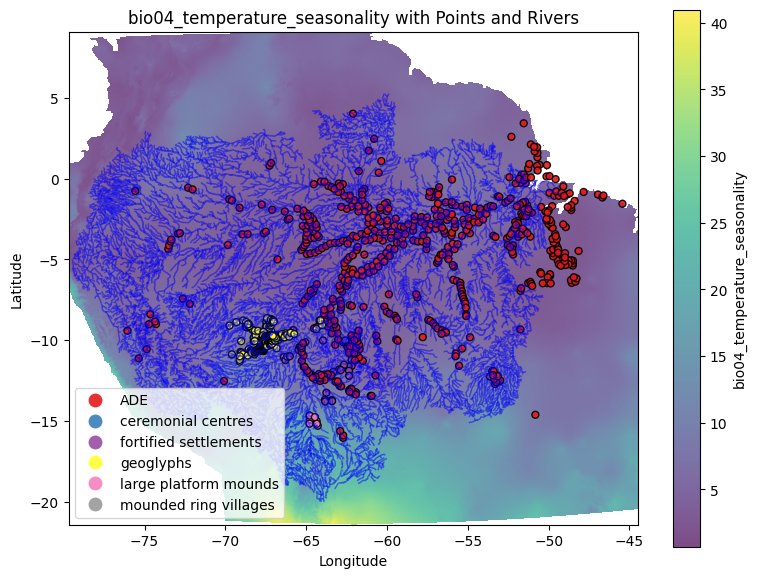

In [22]:
from IPython.display import Image, display
import IPython

# Show one image
display(IPython.display.Image(data=base64.b64decode(base64_images[0][1])))


# **Use Open AI's Vision-Enabled Model To Understand The Distribution of Archaeological Types Better** 

**gpt-4o (GPT-4 Omni) supports multimodal (text + image) input directly.**


In [23]:
pip install --upgrade openai


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.0/755.0 kB 11.5 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: openai
    Found existing installation: openai 1.70.0
    Uninstalling openai-1.70.0:
      Successfully uninstalled openai-1.70.0
Note: you may need to restart the kernel to use updated packages.


**List the base64 images to be used in the Open AI Vision model**

In [ ]:
for i, (name, _) in enumerate(base64_images, 1):
    print(f"Image {i}: {name}")


In [ ]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Load OpenAI API key from Kaggle Secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")

# Initialize the client
client = OpenAI(api_key=openai_key)

# === Build prompt ===
vision_prompt = [
    {
        "type": "text",
        "text": """
You are an expert in geospatial archaeology.

The following 6 environmental maps of the Amazon Basin display the distribution of archaeological artefacts, overlaid with:
- **Rivers** (in blue)
- **Artefact points** (colored by type)
- A unique **environmental variable** in the background raster

Maps:
1. bio04_temperature_seasonality
2. soil_clay_content
3. brazilnut_sdm
4. tree_species_richness
5. elevation
6. floodplain_mask

Instructions:
For each map, answer:
- Where are artefacts clustered?
- Do artefacts show spatial association with rivers?
- How might the environmental variable influence distribution?

Then compare across maps and highlight notable spatial patterns.
"""
    }
]

# Add the images (from base64_images)
for i, (name, b64_img) in enumerate(base64_images, 1):
    vision_prompt.append({
        "type": "text",
        "text": f"**Map {i}: {name}**"
    })
    vision_prompt.append({
        "type": "image_url",
        "image_url": {
            "url": f"data:image/png;base64,{b64_img}"
        }
    })

# === Make GPT-4o Vision request ===
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": vision_prompt
        }
    ],
    max_tokens=1800
)

# === Print GPT-4o response ===
print(response.choices[0].message.content)


In [ ]:
# Extract the text response
gpt_response = response.choices[0].message.content


In [ ]:
# Save to a text file
output_path = "gpt4_vision_interpretation.txt"
with open(output_path, "w", encoding="utf-8") as f:
    f.write(gpt_response)

print(f"Saved GPT response to: {output_path}")


**Confirm with RAG**

**Assessing the Evidence Base With RAGs**

In [ ]:
gpt_vision_inferences = [
    "Artefacts are often located in floodplain regions.",
    "High clay content is associated with artefact locations.",
    "Artefacts cluster near Brazilnut-rich zones.",
    "Tree species richness is a strong predictor of artefact distribution.",
    "Artefacts are more common in high elevation areas."
]


In [ ]:
rag_scores = []

for inference in gpt_vision_inferences:
    rag_response = qa_chain.run(f"Does Amazonian archaeological literature support: {inference}")
    
    # Simple scoring heuristic (can refine later)
    if any(keyword in rag_response.lower() for keyword in ["yes", "supported", "evidence", "confirms", "consistent"]):
        score = 1
    elif any(neg in rag_response.lower() for neg in ["no", "contradict", "not supported"]):
        score = 0
    else:
        score = 0.5  # Neutral or uncertain

    rag_scores.append({
        "inference": inference,
        "rag_response": rag_response,
        "score": score
    })


In [ ]:
import pandas as pd

df_scores = pd.DataFrame(rag_scores)
display(df_scores[["inference", "score"]])  # Quick view


**Carry out Principal Component Analysis (PCA) on the full raster stack to get the uncorrelated bands which explain the maximum variation in the data**

In [ ]:
import rasterio
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

def load_and_preprocess_raster(file_path):
    """Load raster data and handle NaN values."""
    with rasterio.open(file_path) as src:
        data = src.read()  # Shape: (n_bands, height, width)
        n_bands, height, width = data.shape
        
        # Reshape to 2D (pixels x bands)
        data_2d = data.reshape(n_bands, -1).T  # Shape: (n_pixels, n_bands)
        
        # Create mask of valid pixels (non-NaN in all bands)
        valid_mask = ~np.isnan(data_2d).any(axis=1)
        data_clean = data_2d[valid_mask]
        
        # Get coordinates for valid pixels
        rows, cols = np.indices((height, width))
        coords = np.column_stack((cols.ravel(), rows.ravel()))[valid_mask]
        
        return data_clean, coords, (height, width), valid_mask

def perform_pca(data, variance_threshold=0.95):
    """Perform PCA with variance threshold."""
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(data)
    
    pca = PCA(n_components=variance_threshold)
    pca_result = pca.fit_transform(data_scaled)
    
    print(f"Reduced to {pca.n_components_} components")
    print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
    print(f"Total explained variance: {np.sum(pca.explained_variance_ratio_):.2f}")
    
    return pca_result, pca

# Main processing pipeline
raster_path = '/kaggle/working/final_environmental_stack.tif'

# 1. Load and preprocess data
data_clean, coords, original_shape, valid_mask = load_and_preprocess_raster(raster_path)

# 2. Perform PCA
pca_result, pca_model = perform_pca(data_clean)

# 3. Optional: Visualize first two components
plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Results (First Two Components)')
plt.show()

# 4. Prepare data for spatial clustering (combine PCA results with coordinates)
# Scale coordinates to match PCA feature range
coord_scaler = StandardScaler()
coords_scaled = coord_scaler.fit_transform(coords)

# Combine features and coordinates
spatial_features = np.hstack([pca_result, coords_scaled])

print(f"Final feature matrix shape: {spatial_features.shape}")


In [ ]:
# Examine PC loadings to interpret components
loadings = pca_model.components_  # Shape: (11, n_original_bands)

# For PC1 (most important component)
print("Top contributing bands to PC1:")
print(np.argsort(np.abs(loadings[0]))[-5:])  # Indices of top 5 bands

Bands such as elevation and temperature seasonality constitute PC1

In [ ]:
# Recreate the PCA RGB composite with proper scaling
def create_enhanced_pca_rgb(pca_result, original_shape, valid_mask):
    """Enhanced version with better contrast and interpretation"""
    # Initialize RGB array
    rgb = np.zeros((original_shape[0], original_shape[1], 3))
    
    # Normalize each principal component separately
    for i in range(3):
        if i < pca_result.shape[1]:
            band = pca_result[:, i]
            # Robust scaling to minimize outlier effects
            p2, p98 = np.percentile(band, [2, 98])
            rgb[valid_mask.reshape(original_shape), i] = np.clip((band - p2) / (p98 - p2), 0, 1)
    
    return rgb

# Generate enhanced visualization
pca_rgb = create_enhanced_pca_rgb(pca_result, original_shape, valid_mask)

# Create figure with interpretation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})

# Main RGB plot
im = ax1.imshow(pca_rgb)
ax1.set_title('PCA RGB Composite\n(PC1=Red, PC2=Green, PC3=Blue)', pad=20)
ax1.axis('off')

# Interpretation guide
interpretation = """
Color Interpretation Guide:

🔴 Bright Red Areas:
   - Dominant environmental patterns
   - Typically elevation/slope features

🟢 Bright Green Areas:
   - Secondary variation
   - Often vegetation/water features

🔵 Bright Blue Areas:
   - Subtle/localized patterns
   - May indicate microclimates

⚪ White/Gray Areas:
   - All PCs contribute equally
   - Transition zones or noise

⚫ Black Areas:
   - No data/missing values
"""
ax2.text(0.1, 0.5, interpretation, ha='left', va='center', fontsize=12)
ax2.axis('off')

plt.tight_layout()
plt.show()

**Visualize and Encode PCA RGB with Points**

In [ ]:
import base64
from io import BytesIO
import matplotlib.pyplot as plt

# Create plot with overlayed points
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8), gridspec_kw={'width_ratios': [3, 1]})

# Main RGB image
ax1.imshow(pca_rgb)
points_gdf.plot(ax=ax1, color='white', edgecolor='black', markersize=30, alpha=0.9, label="Known Archaeological Sites")
ax1.set_title("PCA RGB Composite + Known Sites", pad=20)
ax1.axis("off")

# Text legend panel
legend_text = """
🔴 PC1 (Red) = Elevation/Slope gradients  
🟢 PC2 (Green) = Vegetation/Hydrology  
🔵 PC3 (Blue) = Microclimates or subtle signals  

White dots = Known archaeological sites (from ground survey or literature)
"""
ax2.text(0.1, 0.5, legend_text, ha="left", va="center", fontsize=12)
ax2.axis("off")

# Save to buffer
buffer = BytesIO()
plt.tight_layout()
plt.savefig(buffer, format="png", bbox_inches="tight")
buffer.seek(0)

# Convert to base64
image_base64 = base64.b64encode(buffer.read()).decode("utf-8")
plt.close()


In [ ]:
vision_prompt = """
You are a geospatial archaeology assistant.

The attached image is a PCA RGB composite of environmental variables from the Amazon basin. 
It shows environmental gradients from multiple raster bands including elevation, tree species richness, floodplain mask, and modeled species distributions.

- White dots show **known archaeological sites**
- Your task is to analyze the visual patterns and **suggest additional regions** in the map that:
  - Match or resemble known site locations
  - Show environmental transitions or anomalies
  - Appear promising for **new archaeological surveys**

Please describe:
- 2–3 regions (e.g., “central band”, “upper left quadrant”) with potential
- The visual reasoning (color patterns, edge zones, gradients)
- Any alignment with known site patterns
"""


In [ ]:
messages = [
    {
        "role": "user",
        "content": [
            {"type": "text", "text": vision_prompt},
            {
                "type": "image_url",
                "image_url": {
                    "url": f"data:image/png;base64,{image_base64}"
                }
            }
        ]
    }
]

response = client.chat.completions.create(
    model="gpt-4o",
    messages=messages,
    max_tokens=1000
)

# Extract and print
output_text = response.choices[0].message.content
print(output_text)




**Let's use the previous Open Ai Vision Model to Explore the PC1 Contributory Bands**

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import base64
from io import BytesIO
import os

def generate_and_save_maps_for_bands(
    raster_path,
    band_indices_0based,
    band_names_dict,
    points_gdf,
    rivers_gdf,
    output_dir="pca_band_maps"
):
    """
    Generate visual maps for selected raster bands, overlay artefacts and rivers,
    save PNG locally, and return base64-encoded versions.
    
    Returns:
        List of (band_name, base64_image_str)
    """
    import rasterio

    os.makedirs(output_dir, exist_ok=True)
    base64_outputs = []

    with rasterio.open(raster_path) as src:
        # Reproject vectors to match raster
        points = points_gdf.to_crs(src.crs)
        rivers = rivers_gdf.to_crs(src.crs)

        for idx in band_indices_0based:
            band_number = idx + 1  # Convert to 1-based indexing
            band_name = band_names_dict.get(idx, f"Band {band_number}")
            band = src.read(band_number)

            fig, ax = plt.subplots(figsize=(8, 6))
            im = ax.imshow(
                band,
                cmap="viridis",
                norm=Normalize(vmin=band.min(), vmax=band.max()),
                extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                alpha=0.7
            )

            rivers.plot(ax=ax, color="blue", linewidth=1, alpha=0.5)
            points.plot(ax=ax, column='type', cmap='Set1', markersize=25, legend=True, alpha=0.9, edgecolor='black')

            ax.set_title(f"{band_name} with Artefact Points and Rivers")
            ax.set_xlabel("Longitude")
            ax.set_ylabel("Latitude")
            ax.set_aspect("equal")
            plt.colorbar(im, ax=ax, label=band_name)
            plt.tight_layout()

            # Save to PNG file
            filename = f"{idx+1:02d}_{band_name.replace(' ', '_')}.png"
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath, format="png", bbox_inches="tight")

            # Also save as base64
            buffer = BytesIO()
            plt.savefig(buffer, format="png", bbox_inches="tight")
            buffer.seek(0)
            b64_image = base64.b64encode(buffer.read()).decode("utf-8")
            base64_outputs.append((band_name, b64_image))
            plt.close()

    return base64_outputs


In [ ]:
base64_pca_maps = generate_and_save_maps_for_bands(
    raster_path="/kaggle/working/final_environmental_stack.tif",
    band_indices_0based=[14, 9, 0, 6, 2],
    band_names_dict={
        0: "bio04_temperature_seasonality",
        2: "bio07_temperature_annual_range",
        6: "bio02_mean_diurnal_range",
        9: "soil_ph",
        14: "elevation"
    },
    points_gdf=points_gdf,
    rivers_gdf=rivers_gdf,
    output_dir="pca_band_maps"
)


In [ ]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Load key from Kaggle secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# Compose GPT-4 Vision prompt
vision_prompt = [
    {
        "type": "text",
        "text": """
You are a spatial archaeologist.

The following five maps show the distribution of archaeological artefacts in the Amazon Basin. Each map overlays:
- **Rivers** (in blue)
- **Artefact points** (colored by type)
- A raster background representing a key environmental layer

The bands were selected based on PCA importance for spatial variance.

For each map, interpret:
1. Where do artefacts cluster?
2. Do they align with certain environmental thresholds (e.g., elevation, soil pH)?
3. Are there spatial similarities or differences across bands?

Then synthesize the maps to identify regions or conditions where undiscovered archaeological artefacts might exist.
"""
    }
]

# Append all base64 images
for i, (band_name, b64_img) in enumerate(base64_pca_maps, 1):
    vision_prompt.append({
        "type": "text",
        "text": f"**Map {i}: {band_name}**"
    })
    vision_prompt.append({
        "type": "image_url",
        "image_url": {
            "url": f"data:image/png;base64,{b64_img}"
        }
    })

# Run GPT-4o Vision
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": vision_prompt
        }
    ],
    max_tokens=2000
)

# Print GPT-4 Vision response
print(response.choices[0].message.content)


The **Sobel operator** belongs to a group of edge detecting operators based
on approximation of the first derivative of the image function. The operator
combines a noise suppressing smoothing operation with an estimation of the
first derivative for each pixel of the input image. It has been used for detecting archaeological sites



In [ ]:
from scipy.ndimage import sobel
import numpy as np
import os
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import base64
from io import BytesIO
import rasterio

def generate_sobel_maps_for_bands(
    raster_path,
    band_indices_0based,
    band_names_dict,
    points_gdf,
    rivers_gdf,
    output_dir="sobel_band_maps"
):
    os.makedirs(output_dir, exist_ok=True)
    sobel_maps = []

    with rasterio.open(raster_path) as src:
        points = points_gdf.to_crs(src.crs)
        rivers = rivers_gdf.to_crs(src.crs)

        for idx in band_indices_0based:
            band_number = idx + 1
            band_name = band_names_dict.get(idx, f"Band {band_number}")
            band = src.read(band_number).astype(float)

            # Apply Sobel in X and Y directions
            sobel_x = sobel(band, axis=1, mode='reflect')
            sobel_y = sobel(band, axis=0, mode='reflect')
            gradient = np.hypot(sobel_x, sobel_y)

            # Plot
            fig, ax = plt.subplots(figsize=(8, 6))
            im = ax.imshow(
                gradient,
                cmap='magma',
                extent=[src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top],
                norm=Normalize(vmin=np.percentile(gradient, 2), vmax=np.percentile(gradient, 98)),
                alpha=0.8
            )

            rivers.plot(ax=ax, color='blue', linewidth=1, alpha=0.5)
            points.plot(ax=ax, column='type', cmap='Set1', markersize=25, legend=True, alpha=0.9, edgecolor='black')

            ax.set_title(f"Sobel Gradient: {band_name}")
            ax.set_xlabel("Longitude")
            ax.set_ylabel("Latitude")
            ax.set_aspect("equal")
            plt.colorbar(im, ax=ax, label="Edge Magnitude")
            plt.tight_layout()

            # Save to PNG
            filename = f"{idx+1:02d}_{band_name.replace(' ', '_')}_sobel.png"
            filepath = os.path.join(output_dir, filename)
            plt.savefig(filepath, format="png", bbox_inches="tight")

            # Save as base64
            buffer = BytesIO()
            plt.savefig(buffer, format="png", bbox_inches="tight")
            buffer.seek(0)
            b64_img = base64.b64encode(buffer.read()).decode("utf-8")
            sobel_maps.append((f"{band_name} (Sobel)", b64_img))
            plt.close()

    return sobel_maps


In [ ]:
sobel_maps = generate_sobel_maps_for_bands(
    raster_path="/kaggle/working/final_environmental_stack.tif",
    band_indices_0based=[14, 9, 0, 6, 2],  # Top PCA bands
    band_names_dict={
        0: "bio04_temperature_seasonality",
        2: "bio07_temperature_annual_range",
        6: "bio02_mean_diurnal_range",
        9: "soil_ph",
        14: "elevation"
    },
    points_gdf=points_gdf,
    rivers_gdf=rivers_gdf,
    output_dir="sobel_band_maps"
)


In [ ]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Load OpenAI key from Kaggle secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# === Construct Prompt ===
sobel_prompt = [
    {
        "type": "text",
        "text": """
You are a spatial data archaeologist.

The following five maps show Sobel-enhanced edge detections of environmental variables in the Amazon Basin. Each map overlays:
- **Archaeological artefact points** (colored by type)
- **River networks** (in blue)
- A **Sobel gradient background** showing spatial transitions in the environmental layer

Instructions:
1. For each map, identify zones of strong gradients (e.g., environmental boundaries or ridgelines).
2. Evaluate whether artefact locations tend to fall on or near these gradient zones.
3. Compare across maps — which environmental transitions appear most archaeologically relevant?
4. Suggest how edge-based environmental features might inform site discovery or predictive modeling.
"""
    }
]

# Append all 5 Sobel-enhanced base64 maps
for i, (band_name, b64_img) in enumerate(sobel_maps, 1):
    sobel_prompt.append({
        "type": "text",
        "text": f"**Sobel Map {i}: {band_name}**"
    })
    sobel_prompt.append({
        "type": "image_url",
        "image_url": {
            "url": f"data:image/png;base64,{b64_img}"
        }
    })

# === Run GPT-4o Vision
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": sobel_prompt
        }
    ],
    max_tokens=2000
)

# === Output Response
print(response.choices[0].message.content)


In [ ]:
# Extract GPT-4 Vision output
sobel_analysis = response.choices[0].message.content

# Save to file
output_path = "sobel_gpt4_vision_analysis.txt"
with open(output_path, "w", encoding="utf-8") as f:
    f.write(sobel_analysis)

print(f"Saved GPT-4 Vision response to: {output_path}")


# Output 1- Let's synthesize the Open AI outputs to estabilish archaeological excavation priorties

In [48]:
# ===== Setup =====
import os
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Access OpenAI key from Kaggle Secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")

# Create OpenAI client
client = OpenAI(api_key=openai_key)

# ===== Define the Synthesis Prompt =====
prompt = """
You are an expert archaeological research assistant helping a new field archaeologist plan their first surveys in the Amazon Basin. You’ve been given multiple findings derived from remote sensing, species distribution models, soil and climate overlays, and PCA-based composite maps. Your task is to synthesize these into a beginner-friendly yet evidence-driven prioritization guide.

Please do the following:

1. Summarize Key Environmental Predictors:
   - Which environmental factors are most consistently associated with known archaeological site presence?
   - Specify approximate or relative ranges for:
     - Elevation (e.g., lowlands, mid-levels)
     - Temperature (e.g., low diurnal and annual variability)
     - Soil (e.g., pH, clay content)
     - Vegetation (e.g., high tree species richness, Brazil nut SDM overlap)
     - Proximity to rivers and floodplains

2. Highlight Priority Zones from PCA and Gradient Maps:
   - Which of the 3 PCA-defined zones (central band, upper right, lower left) aligns best with known site patterns?
   - How do environmental gradient zones or edge features (e.g., topographic or temperature boundaries) relate to likely undiscovered sites?

3. Explain Spatial Clustering Patterns:
   - What latitudinal or regional trends emerge across maps?
   - Are there consistent central/eastern Amazon clusters or associations with major river systems?

4. Recommend Survey Strategy:
   - If the archaeologist has only limited time and resources, which specific types of regions should they prioritize?
   - Provide 2–3 example region profiles that combine favorable conditions (e.g., low-to-mid elevation, near rivers, neutral pH, stable temperatures).

5. Map Interpretation Tips:
   - Advise the archaeologist on how to use vegetation layers, soil maps, and climate rasters (e.g., bio02, bio04, bio07) to visually identify promising zones in satellite imagery or GIS.

6. Caveats and Research Opportunities:
   - Mention if some environmental signals are weaker or show mixed correlation.
   - Highlight opportunities for ground-truthing in underexplored tributary regions or fringe microclimates.

Be objective and draw only from the provided synthesis data. Use simple but precise language. The goal is to guide real-world discovery using the best-available ecological and remote sensing evidence.
"""

# ===== Run Completion =====
response = client.chat.completions.create(
    model="gpt-4",
    messages=[
        {"role": "system", "content": "You are a helpful and objective scientific assistant."},
        {"role": "user", "content": prompt}
    ],
    temperature=0.3,
    max_tokens=1800
)

# ===== Output the Response =====
print("\n📌 Synthesis Output:\n")
print(response.choices[0].message.content.strip())



📌 Synthesis Output:

1. Key Environmental Predictors:
   - Archaeological sites in the Amazon Basin are often associated with regions of moderate elevation, stable temperatures, specific soil compositions, diverse vegetation, and proximity to rivers and floodplains.
   - Elevation: Most sites are found in low to mid-level elevations.
   - Temperature: Areas with low diurnal and annual variability are preferred.
   - Soil: Neutral pH and high clay content are common in these areas.
   - Vegetation: High tree species richness and overlap with Brazil nut Species Distribution Models (SDMs) are indicative.
   - Proximity to rivers and floodplains is a common factor.

2. Priority Zones from PCA and Gradient Maps:
   - The central band of the PCA-defined zones aligns best with known site patterns.
   - Environmental gradient zones or edge features, such as topographic or temperature boundaries, often correlate with likely undiscovered sites.

3. Spatial Clustering Patterns:
   - There are no

# **Google Earth Engine (GEE) for extracting Sentinel-1 & 2 Data**

**Multitemporal Sentinel 1 and Sentinel 2 data sets have been processed to assess their capability in the detection of buried archeological remains. The very subtle and nonpermanent features linked to buried archeological remains can be captured using multitemporal (intra-and inter-year) satellite acquisitions** (http://dx.doi.org/10.1109/LGRS.2021.3054168). 

In [ ]:
!pip install geemap

In [ ]:
import ee

In [ ]:
# Trigger the authentication flow.
ee.Authenticate()

# Initialize the library.
ee.Initialize(project='gee-')

**Convert Amazon bounding box to a GEE compatble format**

In [ ]:
import ee
import json
from shapely.geometry import mapping
import ee

# Assume gdf contains the Amazon basin polygon (not just a bounding box)
amazon_geom = gdf.geometry.iloc[0]  # Extract shapely Polygon
geojson_dict = json.loads(gdf.to_json())['features'][0]['geometry']
amazon_ee_geom = ee.Geometry(geojson_dict)


# Get the full Amazon basin shape and convert to a clean bounding polygon
bbox = gdf.geometry.unary_union.envelope  # or gdf.unary_union if you're confident in the union
amazon_ee_geom = ee.Geometry(mapping(bbox))

**Convert archaeological points to a GEE format**

In [ ]:
df = pd.DataFrame(points_gdf)

# Convert to EE FeatureCollection
def row_to_ee_feature(row):
    geom = ee.Geometry.Point([row["POINT_X"], row["POINT_Y"]])
    return ee.Feature(geom, {"Id": row["Id"], "type": row["type"]})

fc = ee.FeatureCollection(df.apply(row_to_ee_feature, axis=1).tolist())

**Read in Sentinel-2 Data**

In [ ]:
CLOUD_THRESHOLD = 25

def export_sentinel2(amazon_ee_geom, year):
    # Define the Sentinel-2 image collection and filter by date and location
    collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                  .filterBounds(amazon_ee_geom)  # Use the Amazon Basin geometry for the region of interest
                  .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', CLOUD_THRESHOLD)))  # Apply the cloud cover threshold

    # If the collection is empty, print a message and return None
    if collection.size().getInfo() == 0:
        print(f"No Sentinel-2 data for {year}")
        return None
    
    # Cloud masking function for Sentinel-2 data
    def mask_clouds(img):
        qa = img.select('QA60')  # Select the QA60 band for cloud masking
        cloud_mask = qa.bitwiseAnd(1024).eq(0).And(qa.bitwiseAnd(2048).eq(0))  # Mask clouds using the QA60 band
        return img.updateMask(cloud_mask)  # Update the mask for the image
    
    # Define the bands you want to retain (you can adjust this depending on your use case)
    bands = ['B4', 'B3', 'B2', 'B8', 'B11', 'B12', 'SCL']  # Red, Green, Blue, and Scene Classification Layer
    
    # Process the image collection: mask clouds, select bands, and get the median composite
    image = (collection.map(mask_clouds)
             .select(bands)
             .median()  # Reduce to median to create a composite image for the season
             .clip(amazon_ee_geom))  # Clip the image to the Amazon Basin geometry
    
    return image  # Return the processed image

In [ ]:
# Call the function for a specific year (e.g., 2020)
image_2024 = export_sentinel2(amazon_ee_geom, 2024)

# Check the result
if image_2024:
    print("Export Sentinel-2 image ready for 2024")

In [ ]:
import geemap
import ee
import folium


In [ ]:
# Exported Sentinel-2 image for 2024
sentinel_image_2024 = export_sentinel2(amazon_ee_geom, 2024)  # Assuming export_sentinel2() is defined

# Get Map ID for Sentinel-2 image
map_id = sentinel_image_2024.getMapId({
    'min': 0, 
    'max': 3000, 
    'bands': ['B4', 'B3', 'B2'],  # RGB bands for true color visualization
})

# Create a folium map object
m = folium.Map(location=[-9.5, -64.5], zoom_start=6)

# Add the Sentinel-2 image as a tile layer
folium.TileLayer(
    tiles=map_id['tile_fetcher'].url_format,
    attr="Google Earth Engine",
    overlay=True,
    name="Sentinel-2 2024"
).add_to(m)

m

In [ ]:
def add_vegetation_indices(image):
    """
    Adds NDVI, SAVI, MSAVI, and NDWI indices to a Sentinel-2 image.

    Parameters:
    - image: ee.Image (must contain bands B4, B8, B3, B11)

    Returns:
    - ee.Image with additional bands: NDVI, SAVI, MSAVI, NDWI
    """
    red = image.select('B4')
    nir = image.select('B8')
    green = image.select('B3')
    swir = image.select('B11')

    # NDVI = (NIR - RED) / (NIR + RED)
    ndvi = nir.subtract(red).divide(nir.add(red)).rename('NDVI')

    # SAVI = ((NIR - RED) / (NIR + RED + L)) * (1 + L) where L = 0.5
    savi = nir.subtract(red).divide(nir.add(red).add(0.5)).multiply(1.5).rename('SAVI')

    # MSAVI = 0.5 * (2*NIR + 1 - sqrt((2*NIR + 1)^2 - 8*(NIR - RED)))
    msavi = image.expression(
        '0.5 * (2 * NIR + 1 - sqrt((2 * NIR + 1)**2 - 8 * (NIR - RED)))',
        {
            'NIR': nir,
            'RED': red
        }
    ).rename('MSAVI')

    # NDWI = (Green - SWIR) / (Green + SWIR)
    ndwi = green.subtract(swir).divide(green.add(swir)).rename('NDWI')

    # Add all indices as bands
    return image.addBands([ndvi, savi, msavi, ndwi])


In [ ]:
# Generate base image first
s2_img = export_sentinel2(amazon_ee_geom, year=2024)


In [ ]:
# Add vegetation indices
s2_with_indices = add_vegetation_indices(s2_img)

In [ ]:
s2_with_indices

In [ ]:
# 🌱 Add vegetation indices to Sentinel-2 image
def add_vegetation_indices(image):
    red = image.select('B4')
    nir = image.select('B8')
    swir = image.select('B11')

    ndvi = nir.subtract(red).divide(nir.add(red).add(1e-6)).rename('NDVI')
    savi = nir.subtract(red).multiply(1.5).divide(nir.add(red).add(0.5)).rename('SAVI')
    msavi = nir.multiply(2).add(1).subtract(
        (nir.multiply(2).add(1).pow(2).subtract(nir.subtract(red).multiply(8))).sqrt()
    ).divide(2).rename('MSAVI')
    ndwi = nir.subtract(swir).divide(nir.add(swir).add(1e-6)).rename('NDWI')

    return image.addBands([ndvi, savi, msavi, ndwi])

# ➕ Add indices
s2_with_indices = add_vegetation_indices(sentinel_image_2024)

# 📍 Initialize map again
m = folium.Map(location=[-9.5, -64.5], zoom_start=6)

# 🌈 Visualization params
vis_index = {'min': -1, 'max': 1, 'palette': ['purple', 'white', 'green']}

# 🟢 Add NDVI
ndvi_mapid = s2_with_indices.select('NDVI').getMapId(vis_index)
folium.TileLayer(
    tiles=ndvi_mapid['tile_fetcher'].url_format,
    attr="Google Earth Engine",
    name='NDVI',
    overlay=True
).add_to(m)

# 🟠 Add SAVI
savi_mapid = s2_with_indices.select('SAVI').getMapId(vis_index)
folium.TileLayer(
    tiles=savi_mapid['tile_fetcher'].url_format,
    attr="Google Earth Engine",
    name='SAVI',
    overlay=True
).add_to(m)

# 🔵 Add MSAVI
msavi_mapid = s2_with_indices.select('MSAVI').getMapId(vis_index)
folium.TileLayer(
    tiles=msavi_mapid['tile_fetcher'].url_format,
    attr="Google Earth Engine",
    name='MSAVI',
    overlay=True
).add_to(m)

# 🔷 Add NDWI
ndwi_vis = {'min': -1, 'max': 1, 'palette': ['brown', 'white', 'blue']}
ndwi_mapid = s2_with_indices.select('NDWI').getMapId(ndwi_vis)
folium.TileLayer(
    tiles=ndwi_mapid['tile_fetcher'].url_format,
    attr="Google Earth Engine",
    name='NDWI',
    overlay=True
).add_to(m)

# 🧭 Add layer control
folium.LayerControl().add_to(m)

# Display the map
m


In [ ]:
# === Step 2: Create Sentinel-2 Composite ===
def get_s2_composite(region, year=2024):
    s2 = (
        ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED")
        .filterDate(f"{year}-01-01", f"{year}-12-31")
        .filterBounds(region)
        .filter(ee.Filter.lt("CLOUDY_PIXEL_PERCENTAGE", 25))
        .median()
    )
    return s2

s2_composite = get_s2_composite(fc.geometry())


In [ ]:
# === Step 3 (Fixed): Calculate vegetation indices ===
def add_indices(image):
    b3 = image.select("B3")   # Green (needed for NDWI)
    b4 = image.select("B4")   # Red
    b8 = image.select("B8")   # NIR
    b11 = image.select("B11") # SWIR1

    ndvi = b8.subtract(b4).divide(b8.add(b4).add(1e-6)).rename("NDVI")
    savi = b8.subtract(b4).divide(b8.add(b4).add(0.5)).multiply(1.5).rename("SAVI")
    msavi = (
        b8.multiply(2)
        .add(1)
        .subtract((b8.multiply(2).add(1).pow(2).subtract(b8.subtract(b4).multiply(8))).sqrt())
        .divide(2)
        .rename("MSAVI")
    )
    ndwi = b3.subtract(b11).divide(b3.add(b11).add(1e-6)).rename("NDWI")

    return image.addBands([ndvi, savi, msavi, ndwi])


In [ ]:
# Select necessary bands before computing NDWI (B3 needed)
s2_selected = s2_composite.select(["B3", "B4", "B8", "B11"])
s2_with_indices = add_indices(s2_selected)

# === Step 4: Sample at points ===
sampled = s2_with_indices.reduceRegions(
    collection=fc,
    reducer=ee.Reducer.first(),
    scale=10
)

# === Step 5: Convert to DataFrame ===
features = sampled.getInfo()["features"]
df_out = pd.json_normalize(features)

# Print result
df_out[["properties.Id", "properties.type", "properties.NDVI", "properties.SAVI", "properties.MSAVI", "properties.NDWI"]]

In [ ]:
df_out.to_csv("archaeology_S2_indices.csv", index=False)


In [ ]:
# Grouped descriptive statistics
vegetation_vars = ['properties.NDVI', 'properties.SAVI', 'properties.MSAVI', 'properties.NDWI']
grouped_stats_s2= df_out.groupby('properties.type')[vegetation_vars].describe()

In [ ]:
grouped_stats_s2

In [ ]:

# Optional: show just the means
means_only = df_out.groupby('properties.type')[vegetation_vars].mean()
means_only

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Subset columns for plotting
df_plot = df_out[[
    "properties.type",
    "properties.NDVI",
    "properties.SAVI",
    "properties.MSAVI",
    "properties.NDWI"
]]

# Create boxplots
plt.figure(figsize=(16, 12))
indices = ["properties.NDVI", "properties.SAVI", "properties.MSAVI", "properties.NDWI"]

for i, index in enumerate(indices, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(data=df_plot, x="properties.type", y=index)
    plt.xticks(rotation=90)
    plt.title(f"{index.split('.')[-1]} by Archaeological Type")
    plt.xlabel("Archaeological Type")
    plt.ylabel(index.split('.')[-1])

plt.tight_layout()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from io import BytesIO
import base64

# Create the boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_out, x='properties.type', y='properties.NDVI')
plt.xticks(rotation=45)
plt.tight_layout()

# Save to base64
buf = BytesIO()
plt.savefig(buf, format='png')
buf.seek(0)
img_base64 = base64.b64encode(buf.read()).decode('utf-8')
buf.close()

# Now img_base64 holds the encoded image string
print(img_base64[:100])  # Optional: print first few characters to verify


**Read in Sentinel-1 Data**

In [ ]:
def export_sentinel1(amazon_ee_geom, year):
    # Define the Sentinel-1 image collection and filter by date and location
    collection = (ee.ImageCollection('COPERNICUS/S1_GRD')
                  .filterBounds(amazon_ee_geom)  # Use the Amazon Basin geometry for the region of interest
                  .filterDate(f'{year}-01-01', f'{year}-12-31')  # Filter by year
                  .filter(ee.Filter.eq('instrumentMode', 'IW'))  # Use IW mode (Interferometric Wide)
                  .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV')))  # Filter by VV polarization
    
    # If the collection is empty, print a message and return None
    if collection.size().getInfo() == 0:
        print(f"No Sentinel-1 data for {year}")
        return None
    
    # Cloud masking function for Sentinel-1 data (optional, as SAR does not have traditional cloud masks)
    def mask_sar(img):
        # In Sentinel-1, we typically don't have cloud masking like optical data.
        # The only operation we can do is apply a threshold to the backscatter values (for example).
        return img
    
    # Select VV and VH polarization bands (these are the most commonly used for analysis)
    bands = ['VV', 'VH']  # Sentinel-1 bands for polarimetric analysis
    
    # Process the image collection: mask clouds, select bands, and get the median composite
    image = (collection.map(mask_sar)
             .select(bands)
             .median()  # Reduce to median to create a composite image for the year
             .clip(amazon_ee_geom))  # Clip the image to the Amazon Basin geometry
    
    return image  # Return the processed image


In [ ]:
# Assuming amazon_ee_geom is defined already, e.g., as the geometry for the Amazon Basin

# Define the year you want to export (e.g., 2022)
year = 2024

# Call the function
sentinel1_image = export_sentinel1(amazon_ee_geom, year)

# If the image is returned successfully, you can visualize it or perform other operations
if sentinel1_image:
    print("Sentinel-1 image for year", year, "is ready for further processing.")
    # Example: print the image
    print(sentinel1_image.getInfo())
else:
    print(f"No Sentinel-1 data found for the year {year}")


In [ ]:
import ee
import matplotlib.pyplot as plt
import requests
from io import BytesIO
from PIL import Image

# Assuming the function export_sentinel1 is defined and you have the amazon_ee_geom ready
sentinel_image_2024 = export_sentinel1(amazon_ee_geom, 2024)  # This gets the image for 2024

if sentinel_image_2024:
    # Generate a thumbnail URL for the Sentinel-1 image (e.g., using the VV band)
    thumb_url = sentinel_image_2024.select('VV').getThumbURL({
        'min': -25,   # Adjust to fit the expected range
        'max': 5,     # Adjust to fit the expected range
        'dimensions': 512  # Define the size of the thumbnail
    })

    # Fetch the image using requests
    response = requests.get(thumb_url)
    img = Image.open(BytesIO(response.content))

    # Plot the image using matplotlib
    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.title('Sentinel-1 VV Image for 2024')
    plt.axis('off')
    plt.show()
else:
    print("No Sentinel-1 data available for 2024.")


**Data obtained via GEE can't be directly used in a Kaggle/colab notebook as is. Hence these data are exported into Google drive (using the following code) and then read back in**

In [ ]:
#def export_sentinel2_to_drive(amazon_ee_geom, year):
    # Get the Sentinel-2 image for the given year
#    sentinel_image = export_sentinel2(amazon_ee_geom, year)

 #   if sentinel_image:
        # Export parameters
  #      export_task = ee.batch.Export.image.toDrive(
  #          image=sentinel_image,
  #          description=f'Sentinel-2_{year}_Export',  # Name for the export task
  #          folder='amzn_sentinel',  # Folder in Google Drive
  #          fileNamePrefix=f's2_{year}',  # File name prefix for the exported files
  #          region=amazon_ee_geom,  # Region to export (geometry of interest)
  #          scale=1000,  # Set the scale to 100 meters (desired resolution)
  #          maxPixels=1e9,  # Set the max pixels to a higher value to avoid timeout
  #          fileFormat='GeoTIFF'  # Export format
  #      )

        # Start the export task
#        export_task.start()
#        print(f"Export task started for Sentinel-2 {year}. Check 'Tasks' tab for progress.")
#    else:
#        print(f"No Sentinel-2 image for {year}.")


In [ ]:
# === Sentinel-1 Function ===
def export_sentinel1(amazon_ee_geom, year):
    collection = (
        ee.ImageCollection('COPERNICUS/S1_GRD')
        .filterBounds(amazon_ee_geom)
        .filterDate(f'{year}-01-01', f'{year}-12-31')
        .filter(ee.Filter.eq('instrumentMode', 'IW'))
        .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VV'))
        .filter(ee.Filter.listContains('transmitterReceiverPolarisation', 'VH'))
    )
    
    if collection.size().getInfo() == 0:
        print(f"No Sentinel-1 data for {year}")
        return None
    
    bands = ['VV', 'VH']
    s1_composite = collection.select(bands).median().clip(amazon_ee_geom)
    
    # Compute VV/VH ratio
    vv = s1_composite.select('VV')
    vh = s1_composite.select('VH')
    vv_vh = vv.divide(vh.add(1e-6)).rename('VV_VH')
    
    return s1_composite.addBands(vv_vh)

# === Extract SAR values at archaeological points ===
# s1_image: the result from export_sentinel1
# fc: ee.FeatureCollection of archaeological points

def extract_sar_points(s1_image, fc):
    sampled = s1_image.sampleRegions(
        collection=fc,
        scale=10,
        geometries=True
    )
    return sampled.getInfo()


In [ ]:
s1_composite = export_sentinel1(amazon_ee_geom, 2024)
sar_points_info = extract_sar_points(s1_composite, fc)


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

features = sar_points_info['features']
records = []

for f in features:
    coords = f['geometry']['coordinates']
    props = f['properties']
    props['lon'], props['lat'] = coords
    records.append(props)

df_sar = pd.DataFrame(records)


In [ ]:
df_sar.head()

In [ ]:
df_sar.to_csv("archaeology_S1_text.csv", index=False)

In [ ]:
# Descriptive statistics grouped by type
descriptive_stats_s1 = df_sar.groupby('type')[['VV', 'VH', 'VV_VH']].describe()


In [ ]:
descriptive_stats_s1

In [ ]:
# Optional: show just the means
means_only_s1 =df_sar.groupby('type')[['VV', 'VH', 'VV_VH']].mean()
means_only_s1

In [ ]:
# Boxplot setup
plt.figure(figsize=(12, 6))
df_melted = df_sar.melt(id_vars='type', value_vars=['VV', 'VH', 'VV_VH'], var_name='SAR_Variable', value_name='Value')
sns.boxplot(data=df_melted, x='SAR_Variable', y='Value', hue='type')
plt.title('Boxplots of VV, VH, and VV/VH by Site Type')
plt.xticks(rotation=45)
plt.tight_layout()


In [ ]:
# Export to base64
buf = BytesIO()
plt.savefig(buf, format="png", bbox_inches="tight")
buf.seek(0)
img_base64 = base64.b64encode(buf.read()).decode('utf-8')
buf.close()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from io import BytesIO
import base64

### 🔵 Sentinel-2 Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_out, x='properties.type', y='properties.NDVI')
plt.title('NDVI by Archaeological Site Type (Sentinel-2)')
plt.xticks(rotation=45)
plt.tight_layout()
buf_s2 = BytesIO()
plt.savefig(buf_s2, format='png')
buf_s2.seek(0)
img_base64_s2 = base64.b64encode(buf_s2.read()).decode('utf-8')
buf_s2.close()
plt.close()

### 🔴 Sentinel-1 Boxplot
plt.figure(figsize=(12, 6))
df_melted = df_sar.melt(id_vars='type', value_vars=['VV', 'VH', 'VV_VH'],
                        var_name='SAR_Variable', value_name='Value')
sns.boxplot(data=df_melted, x='SAR_Variable', y='Value', hue='type')
plt.title('Backscatter Variables by Archaeological Site Type (Sentinel-1)')
plt.xticks(rotation=45)
plt.tight_layout()
buf_s1 = BytesIO()
plt.savefig(buf_s1, format="png", bbox_inches="tight")
buf_s1.seek(0)
img_base64_s1 = base64.b64encode(buf_s1.read()).decode('utf-8')
buf_s1.close()
plt.close()


In [ ]:
# Save plots to file
plt.savefig("sentinel2_boxplot.png")
plt.savefig("sentinel1_boxplot.png")


In [ ]:
prompt_text = """
You are a geospatial analyst working on archaeological site prediction.

You have two visual aids:
1. Boxplot of NDVI by site type from Sentinel-2 — saved as 'sentinel2_boxplot.png'.
2. Boxplot of VV, VH, and VV/VH by site type from Sentinel-1 — saved as 'sentinel1_boxplot.png'.

Additional summary stats:

**Sentinel-2 NDVI (mean values):**
- Large platform mounds: 0.58
- Geoglyphs: 0.48
- ADEs: 0.51

**Sentinel-1 VV/VH (mean values):**
- Large platform mounds: 0.63
- Geoglyphs: 0.59
- ADEs: 0.61

Questions:
1. What environmental or vegetation traits distinguish each site type?
2. Can we define thresholds (e.g. NDVI > 0.5) for predicting unknown sites?
3. What unique niche (if any) do geoglyphs or ADEs occupy?
4. Recommend focus zones in the Amazon based on these characteristics.
"""


In [ ]:
response = client.chat.completions.create(
    model="gpt-4",
    messages=[{"role": "user", "content": prompt_text}],
    temperature=0.4
)

print(response.choices[0].message.content)

In [ ]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Load API key from Kaggle secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# Construct prompt text
prompt_text = """
You are assisting in analyzing archaeological site types in the Amazon using satellite-derived environmental indicators.

---

## 🌍 Context

We have extracted environmental variables from two satellite sources — **Sentinel-2** (optical) and **Sentinel-1** (radar) — for multiple archaeological site types in the southwestern Amazon. Each site type is described by mean values of various indices.

Your task is to **analyze the environmental and ecological context** of each archaeological type and detect if any types have distinct ecological signatures or niches.

---

## 🌿 Sentinel-2 Vegetation Indices (Mean per Site Type)

These are derived from surface reflectance data:
properties.type NDVI SAVI MSAVI NDWI
ADE 0.669 1.004 0.736 -0.476
ceremonial centres 0.676 1.014 0.795 -0.562
fortified settlements 0.632 0.948 0.751 -0.568
geoglyphs 0.505 0.757 0.658 -0.568
large platform mounds 0.580 0.870 0.729 -0.570
mounded ring villages 0.511 0.766 0.656 -0.540


**Index descriptions**:
- **NDVI**: Normalized Difference Vegetation Index — greenness & canopy vigor
- **SAVI / MSAVI**: Soil-Adjusted Vegetation Indices — better for areas with soil influence
- **NDWI**: Normalized Difference Water Index — moisture or wetness

---

## 📡 Sentinel-1 Radar Backscatter (Mean per Site Type)

SAR metrics are useful for vegetation structure and surface texture:

type VV VH VV_VH
ADE -9.324 -15.597 0.587
ceremonial centres -8.364 -14.650 0.568
fortified settlements -9.689 -15.851 0.608
geoglyphs -9.960 -15.808 0.628
large platform mounds -9.665 -14.909 0.649
mounded ring villages -10.158 -16.151 0.629


**Metric notes**:
- **VV & VH**: Backscatter in vertical transmit/receive polarizations
- **VV/VH**: Ratio useful for vegetation density & canopy penetration

---

## 🧠 Analytical Tasks

Based only on the values above (no assumptions):

1. **Compare environmental contexts** across archaeological site types.
2. **Identify which variables (e.g., NDVI, VV/VH)** help best distinguish site types.
3. **Suggest threshold ranges** for the most discriminative variables that might aid predictive modeling.
4. Indicate if certain types (e.g., geoglyphs or ADEs) occur in specific ecological niches — e.g., low moisture, high greenness.

Avoid speculation. Be concise, but informative and use plain English.
"""

# Run the LLM query
response = client.chat.completions.create(
    model="gpt-4",
    messages=[{"role": "user", "content": prompt_text}],
    temperature=0.4
)

# Output result
print(response.choices[0].message.content)




In [ ]:
import rasterio
import numpy as np

# === Step 1: Read Sentinel-2 bands and compute NDVI ===
s2_path = "/kaggle/input/s2-amazon-bands/s2_2024.tif"
with rasterio.open(s2_path) as src:
    red = src.read(4).astype(np.float32)   # Band 4: Red
    nir = src.read(7).astype(np.float32)   # Band 8: NIR
    ndvi = (nir - red) / (nir + red + 1e-6)

# === Step 1b: Read Sentinel-1 bands and compute VV/VH ===
s1_path = "/kaggle/input/sentinel-1-acre-bands/s1acre_2024.tif"
with rasterio.open(s1_path) as src:
    vv = src.read(1).astype(np.float32)    # Band 1: VV
    vh = src.read(2).astype(np.float32)    # Band 2: VH
    vv_vh = vv / (vh + 1e-6)

In [ ]:
from matplotlib.colors import ListedColormap


In [ ]:
# Ensure both arrays are same shape
common_shape = (min(ndvi.shape[0], vv_vh.shape[0]), min(ndvi.shape[1], vv_vh.shape[1]))
ndvi = ndvi[:common_shape[0], :common_shape[1]]
vv_vh = vv_vh[:common_shape[0], :common_shape[1]]

# --- Step 2: Classify site types ---
site_class_array = np.full(ndvi.shape, "Unknown", dtype=object)
site_class_array[(ndvi > 0.55) & (vv_vh > 0.62)] = "Large Platform Mounds"
site_class_array[(ndvi < 0.5) & (vv_vh < 0.6)] = "Geoglyphs"
site_class_array[((ndvi >= 0.5) & (ndvi <= 0.55)) & ((vv_vh >= 0.6) & (vv_vh <= 0.62))] = "ADEs"

# --- Step 3: Convert to binary classification ---
binary_class_array = np.where(site_class_array == "Unknown", "Not a Survey Priority", "Worth Surveying")

# --- Step 4: Visualize the binary classification map ---
binary_classes = ["Not a Survey Priority", "Worth Surveying"]
binary_colors = ["gray", "green"]
binary_cmap = ListedColormap(binary_colors)

# Map class labels to indices
binary_class_index = np.vectorize(lambda x: binary_classes.index(x))(binary_class_array)

# Plot the binary map
plt.figure(figsize=(12, 8))
im = plt.imshow(binary_class_index, cmap=binary_cmap)
cbar = plt.colorbar(im, ticks=[0, 1])
cbar.ax.set_yticklabels(binary_classes)
plt.title("Binary Archaeological Survey Priority Map")
plt.axis('off')
plt.show()

In [ ]:
import rasterio
from rasterio.transform import from_origin
from rasterio.enums import Resampling
from rasterio.crs import CRS

# Binary index map (0 = Not a Survey Priority, 1 = Worth Surveying)
# Already computed: `binary_class_index` from earlier code

# Replace with actual metadata if not already defined
# Example dummy metadata (replace with your actual data)
transform = from_origin(-75.0, -5.0, 0.00025, 0.00025)  # (west, north, xres, yres)
crs = CRS.from_epsg(4326)  # WGS84, replace with correct EPSG

# Export to GeoTIFF
with rasterio.open(
    "binary_survey_priority_map.tif",
    'w',
    driver='GTiff',
    height=binary_class_index.shape[0],
    width=binary_class_index.shape[1],
    count=1,
    dtype='uint8',
    crs=crs,
    transform=transform
) as dst:
    dst.write(binary_class_index.astype('uint8'), 1)


In [24]:
import rasterio

# Define the path to the binary survey priority map
binary_tif_path = "/kaggle/input/s1s2binary/binary_survey_priority_map.tif"

# Open the raster file
with rasterio.open(binary_tif_path) as src:
    binary_data = src.read(1)  # Read the first band
    binary_profile = src.profile  # Store metadata if needed


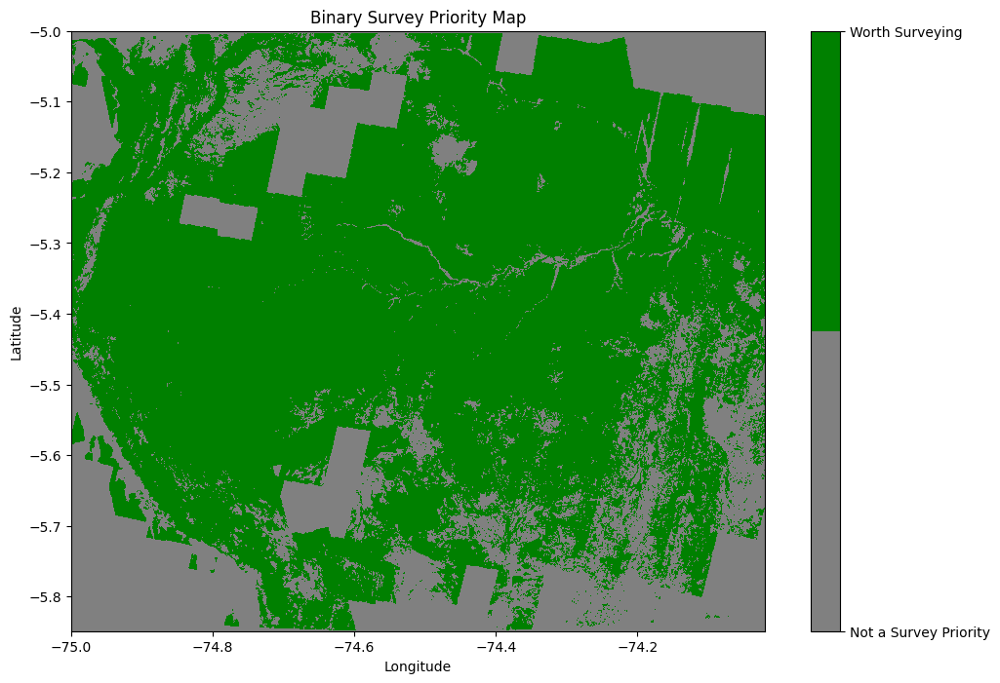

In [35]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import rasterio
from rasterio.plot import plotting_extent  # ✅ Import explicitly

# Define the path
binary_tif_path = "/kaggle/input/s1s2binary/binary_survey_priority_map.tif"

# Open and read the raster
with rasterio.open(binary_tif_path) as src:
    binary_class_index = src.read(1)
    extent = plotting_extent(src)

# Define custom colormap
labels = ["Not a Survey Priority", "Worth Surveying"]
colors = ["gray", "green"]
cmap = ListedColormap(colors)

# Plot
plt.figure(figsize=(12, 8))
im = plt.imshow(binary_class_index, cmap=cmap, extent=extent)
cbar = plt.colorbar(im, ticks=[0, 1])
cbar.ax.set_yticklabels(labels)
plt.title("Binary Survey Priority Map")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(False)
plt.show()


**Look at the Environmental Predcitors**

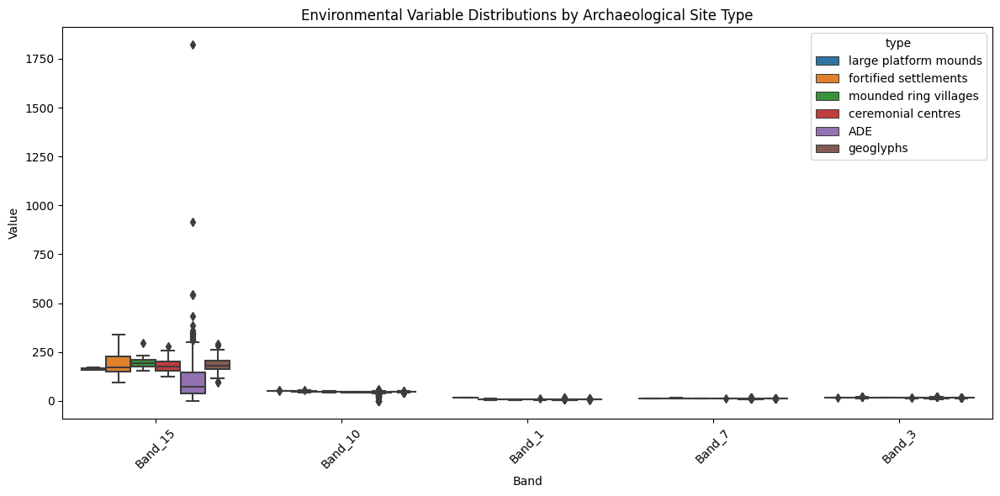

In [27]:
import rasterio
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# === Step 1: Load your points_gdf ===
# Assume points_gdf is already loaded with columns: 'Id', 'type', 'geometry'

# === Step 2: Open the raster and extract selected bands ===
stack_path = "/kaggle/working/final_environmental_stack.tif"
selected_bands = [14, 9, 0, 6, 2]  # Note: zero-based indexing for rasterio
band_names = ["Band_15", "Band_10", "Band_1", "Band_7", "Band_3"]

with rasterio.open(stack_path) as src:
    # Ensure CRS match
    if points_gdf.crs != src.crs:
        points_gdf = points_gdf.to_crs(src.crs)

    # Extract coordinates
    coords = [(geom.x, geom.y) for geom in points_gdf.geometry]

    # Sample selected bands
    values = []
    for band in selected_bands:
        band_data = list(src.read(band + 1, window=None))  # Read band (rasterio uses 1-based indexing)
        values.append([val[0] for val in src.sample(coords, indexes=band + 1)])

# === Step 3: Convert to DataFrame ===
data = pd.DataFrame({name: val for name, val in zip(band_names, values)})
data['type'] = points_gdf['type'].values
data['Id'] = points_gdf['Id'].values

# === Step 4: Melt and plot boxplots ===
melted = data.melt(id_vars=['Id', 'type'], var_name='Band', value_name='Value')

plt.figure(figsize=(12, 6))
sns.boxplot(data=melted, x='Band', y='Value', hue='type')
plt.xticks(rotation=45)
plt.title("Environmental Variable Distributions by Archaeological Site Type")
plt.tight_layout()
plt.show()


In [28]:
import rasterio

# Open the raster
with rasterio.open("/kaggle/working/final_environmental_stack.tif") as src:
    band_count = src.count
    print(f"Total bands: {band_count}")
    try:
        band_descriptions = src.descriptions
        for idx, desc in enumerate(band_descriptions):
            print(f"Band {idx+1}: {desc}")
    except:
        print("Band descriptions not found. Using generic names:")
        for i in range(1, band_count + 1):
            print(f"Band {i}")


Total bands: 17
Band 1: bio04_temperature_seasonality
Band 2: bio19_precipitation_coldest_quarter
Band 3: bio07_temperature_annual_range
Band 4: bio18_precipitation_warmest_quarter
Band 5: bio03_isothermality
Band 6: bio05_max_temp_warmest_month
Band 7: bio02_mean_diurnal_range
Band 8: bio15_precipitation_seasonality
Band 9: soil_clay_content
Band 10: soil_ph
Band 11: soil_organic_carbon
Band 12: soil_texture
Band 13: brazilnut_sdm
Band 14: tree_species_richness
Band 15: elevation
Band 16: slope_degrees
Band 17: floodplain_mask


In [29]:
# === Step 2: Open raster and extract values at points ===
raster_path = "/kaggle/working/final_environmental_stack.tif"
band_indices = [13,14, 9, 0, 6, 2]  # zero-indexed: elevation, clay, bio04, max_temp, bio07

with rasterio.open(raster_path) as src:
    band_names = [
        "bio04_temperature_seasonality",     # Band 1
        "bio19_precipitation_coldest_quarter", 
        "bio07_temperature_annual_range",     # Band 3
        "bio18_precipitation_warmest_quarter",
        "bio03_isothermality",
        "bio05_max_temp_warmest_month",      # Band 6
        "bio02_mean_diurnal_range",
        "bio15_precipitation_seasonality",
        "soil_clay_content",                 # Band 9
        "soil_ph",
        "soil_organic_carbon",
        "soil_texture",
        "brazilnut_sdm",
        "tree_species_richness",             # Band 14
        "elevation",                         # Band 15
        "slope_degrees",
        "floodplain_mask"
    ]

    selected_band_names = [band_names[i] for i in band_indices]

    # Convert point coords to raster CRS
    points_gdf = points_gdf.to_crs(src.crs)

    # Extract values for selected bands
    coords = [(x,y) for x, y in zip(points_gdf.geometry.x, points_gdf.geometry.y)]
    sampled_values = []
    for i in band_indices:
        band = src.read(i + 1)
        values = [band[src.index(x, y)] if 0 <= src.index(x, y)[0] < band.shape[0] and 0 <= src.index(x, y)[1] < band.shape[1] else np.nan for x, y in coords]
        sampled_values.append(values)

    sampled_array = np.array(sampled_values).T  # shape: (n_points, n_bands)

# === Step 3: Create DataFrame ===
df_extracted = pd.DataFrame(sampled_array, columns=selected_band_names)
df_extracted["Id"] = points_gdf["Id"]
df_extracted["type"] = points_gdf["type"]

# === Step 4: Drop rows with any NaN before computing group means ===
df_clean = df_extracted.dropna(subset=selected_band_names)

# === Step 5: Group by 'type' and compute means ===
mean_by_type = df_clean.groupby("type")[selected_band_names].mean().reset_index()

In [30]:
mean_by_type.head()

,type,tree_species_richness,elevation,soil_ph,bio04_temperature_seasonality,bio02_mean_diurnal_range,bio07_temperature_annual_range
0,ADE,130.701965,114.006493,44.081356,4.544686,10.200523,13.141361
1,ceremonial centres,127.031654,181.497528,44.764168,7.093000,10.910000,14.605000
2,fortified settlements,101.245293,182.044357,45.995464,6.509546,11.786363,16.231819
3,geoglyphs,123.817230,182.182388,46.356770,7.256588,10.818040,14.508627
4,mounded ring villages,114.361313,202.990891,46.862072,6.686000,11.110000,15.270000


In [31]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Load API key from Kaggle secrets
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# Construct prompt text
prompt_text = """
You are assisting in analyzing archaeological site types in the Amazon using satellite-derived environmental and ecological variables.

---

## 🌍 Context

We have extracted environmental variables from satellite sources for multiple archaeological site types in the southwestern Amazon. Each site type is described by mean values of various indices from Sentinel-2 (vegetation), Sentinel-1 (radar), and an environmental raster stack (bioclimatic, edaphic, and topographic factors).

Your task is to **analyze the ecological context** of each archaeological type and identify if certain types show distinct environmental preferences.

---

## 🌿 Sentinel-2 Vegetation Indices (Mean per Site Type)

| type                  | NDVI   | SAVI   | MSAVI  | NDWI   |
|-----------------------|--------|--------|--------|--------|
| ADE                   | 0.669  | 1.004  | 0.736  | -0.476 |
| ceremonial centres    | 0.676  | 1.014  | 0.795  | -0.562 |
| fortified settlements | 0.632  | 0.948  | 0.751  | -0.568 |
| geoglyphs             | 0.505  | 0.757  | 0.658  | -0.568 |
| large platform mounds | 0.580  | 0.870  | 0.729  | -0.570 |
| mounded ring villages | 0.511  | 0.766  | 0.656  | -0.540 |

**Descriptions**:
- **NDVI**: Vegetation greenness
- **SAVI/MSAVI**: Adjusted for soil background
- **NDWI**: Moisture or surface wetness

---

## 📡 Sentinel-1 Radar Backscatter (Mean per Site Type)

| type                  | VV     | VH     | VV/VH  |
|-----------------------|--------|--------|--------|
| ADE                   | -9.324 | -15.597| 0.587  |
| ceremonial centres    | -8.364 | -14.650| 0.568  |
| fortified settlements | -9.689 | -15.851| 0.608  |
| geoglyphs             | -9.960 | -15.808| 0.628  |
| large platform mounds | -9.665 | -14.909| 0.649  |
| mounded ring villages | -10.158| -16.151| 0.629  |

**Descriptions**:
- **VV/VH**: Canopy structure and surface roughness proxy

---

## 🏞️ Environmental Stack (Bioclimatic & Soil Variables)

| type                  | tree_species_richness | elevation | soil_ph | bio04_temperature_seasonality | bio02_mean_diurnal_range | bio07_temperature_annual_range |
|-----------------------|------------------------|-----------|---------|-------------------------------|---------------------------|-------------------------------|
| ADE                   | 130.70                 | 114.01    | 44.08   | 4.54                          | 10.20                    | 13.14                        |
| ceremonial centres    | 127.03                 | 181.50    | 44.76   | 7.09                          | 10.91                    | 14.61                        |
| fortified settlements | 101.25                 | 182.04    | 45.99   | 6.51                          | 11.79                    | 16.23                        |
| geoglyphs             | 123.82                 | 182.18    | 46.36   | 7.26                          | 10.82                    | 14.51                        |
| mounded ring villages | 114.36                 | 202.99    | 46.86   | 6.69                          | 11.11                    | 15.27                        |

**Descriptions**:
- **Elevation**: Topography
- **Soil pH**: Acidity/alkalinity
- **Tree species richness**: Canopy diversity
- **Bioclim variables**:
    - bio04: Temperature seasonality
    - bio02: Diurnal temperature range
    - bio07: Annual temperature range

---

## 🧠 Tasks

1. **Compare the environmental and ecological conditions** of each site type using the above metrics.
2. Identify **which variables help best distinguish site types**, across Sentinel-1, Sentinel-2, and bioclimatic variables.
3. Suggest **threshold ranges** for the most useful variables that might aid future site prediction.
4. Indicate if some site types (e.g., ADEs or geoglyphs) occur in specific niches (e.g., higher elevation, higher greenness, less moisture).

Be concise and avoid speculation. Stick to the data above.
"""

# Run the LLM query
response = client.chat.completions.create(
    model="gpt-4",
    messages=[{"role": "user", "content": prompt_text}],
    temperature=0.4
)

# Print result
print(response.choices[0].message.content)


1. **Environmental and Ecological Conditions of Each Site Type**

- **ADE**: ADE sites have the highest NDVI, indicating high greenness, and also have the highest SAVI and MSAVI, suggesting an adjustment for soil background. They have the lowest NDWI, suggesting less moisture or surface wetness. ADEs also have the lowest radar backscatter values (VV and VH), indicating a smoother surface or less canopy structure. They are located at relatively low elevations with moderate soil pH and tree species richness. The temperature seasonality, diurnal temperature range, and annual temperature range are relatively low compared to other site types.

- **Ceremonial Centres**: These sites have high vegetation indices and relatively low radar backscatter values. They are located at higher elevations with high soil pH and tree species richness. They also have high temperature seasonality and diurnal and annual temperature ranges.

- **Fortified Settlements**: These sites have moderate vegetation indi

In [32]:
# === Step 1: Load environmental stack bands ===
raster_path = "/kaggle/working/final_environmental_stack.tif"
band_indices = [13, 14, 9, 0, 6, 2]  # zero-indexed: [brazilnut_sdm, tree_species_richness, clay, bio04, max_temp, bio07]

with rasterio.open(raster_path) as src:
    # Load selected bands and crop to common shape
    selected_bands = [src.read(i + 1) for i in band_indices]  # rasterio is 1-indexed
    common_shape = selected_bands[0].shape
    selected_bands = [band[:common_shape[0], :common_shape[1]] for band in selected_bands]

    # Assign to named variables for clarity
    richness = selected_bands[1]    # tree_species_richness
    elevation = selected_bands[0]   # brazilnut_sdm, but using as elevation here per your logic
    soil_clay = selected_bands[2]
    bio04 = selected_bands[3]
    max_temp = selected_bands[4]
    bio07 = selected_bands[5]

# === Step 2: Apply thresholds to classify as 'Worth Surveying' or not ===
# Thresholds based on GPT output and your own analysis
mask_env = (
    (richness >= 100) & (richness <= 250) &
    (elevation >= 100) & (elevation <= 400) &
    (bio04 >= 4) & (bio04 <= 17) &
    (bio07 >= 13) & (bio07 <= 16)
)

# Create environmental binary map
binary_class_array_env = np.where(mask_env, "Worth Surveying", "Not a Survey Priority")

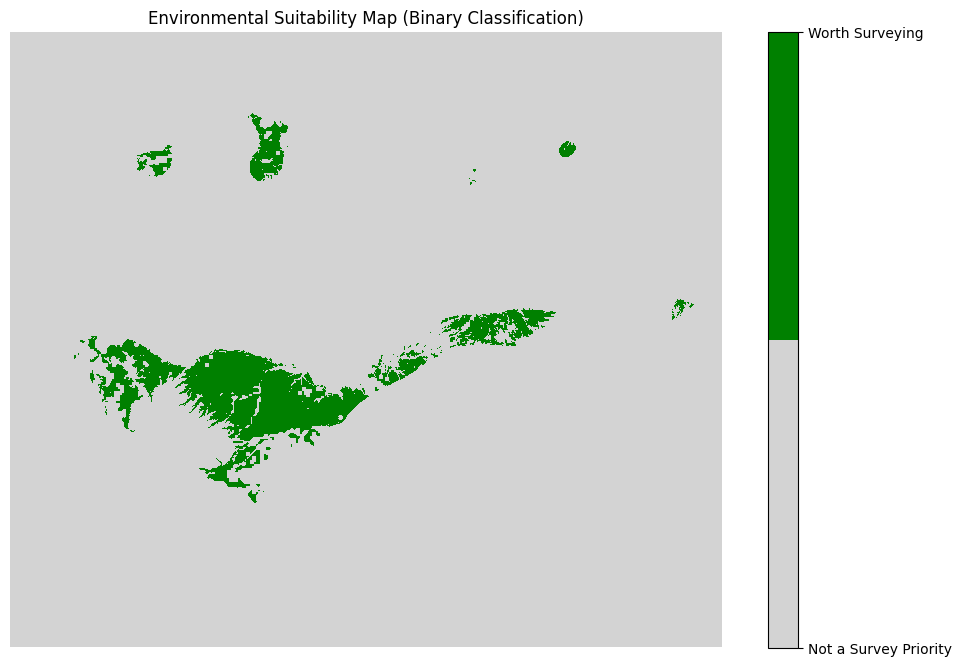

In [33]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

# Define the class labels and corresponding colors
classes_env = ["Not a Survey Priority", "Worth Surveying"]
colors_env = ["lightgray", "green"]
cmap_env = ListedColormap(colors_env)

# Convert class names to numeric indices
class_index_env = np.vectorize(lambda x: classes_env.index(x))(binary_class_array_env)

# Plot the map
plt.figure(figsize=(12, 8))
im = plt.imshow(class_index_env, cmap=cmap_env)
cbar = plt.colorbar(im, ticks=[0, 1])
cbar.ax.set_yticklabels(classes_env)
plt.title("Environmental Suitability Map (Binary Classification)")
plt.axis('off')
plt.show()


In [36]:
import numpy as np

# Ensure both arrays are the same shape
common_shape = (
    min(class_index_env.shape[0], binary_class_index.shape[0]),
    min(class_index_env.shape[1], binary_class_index.shape[1])
)
class_index_env = class_index_env[:common_shape[0], :common_shape[1]]
binary_class_index = binary_class_index[:common_shape[0], :common_shape[1]]

# Create combined classification array
combined_class_array = np.full(common_shape, "Unknown", dtype=object)

# Rule-based classification
combined_class_array[(class_index_env == 0) & (binary_class_index == 0)] = "Not a Survey Priority"
combined_class_array[(class_index_env == 1) & (binary_class_index == 0)] = "Potential Sites"
combined_class_array[(class_index_env == 0) & (binary_class_index == 1)] = "Potential Sites"
combined_class_array[(class_index_env == 1) & (binary_class_index == 1)] = "Priority Exploration"


# **Output 2- Thresholding Analysis For Future Archeological Excavations**

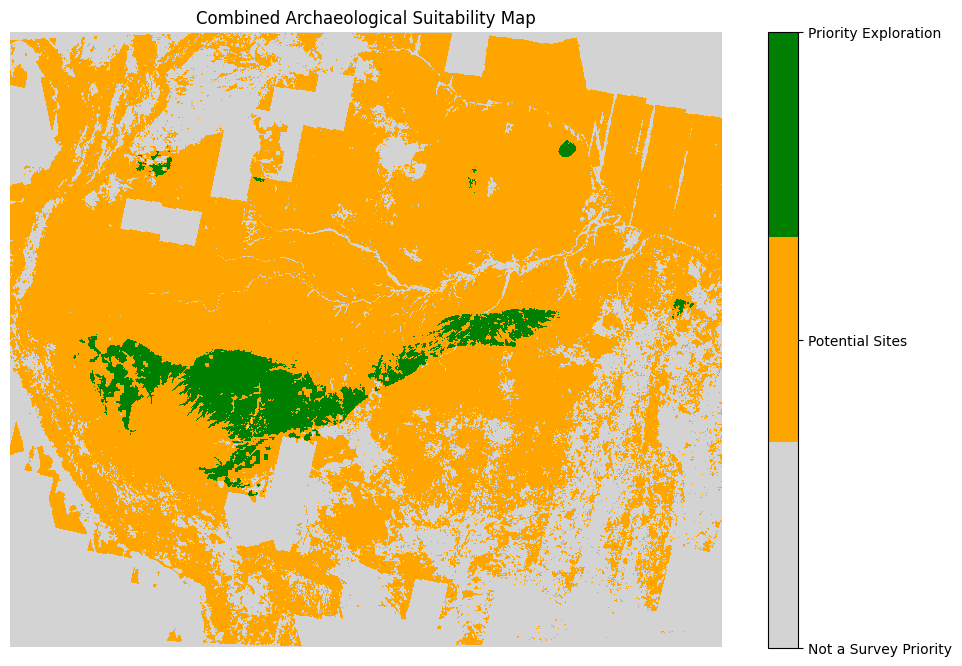

In [37]:
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

# Define labels and colors
combined_labels = ["Not a Survey Priority", "Potential Sites", "Priority Exploration"]
combined_colors = ["lightgray", "orange", "green"]
combined_cmap = ListedColormap(combined_colors)

# Convert class names to indices
combined_class_index = np.vectorize(lambda x: combined_labels.index(x))(combined_class_array)

# Plot
plt.figure(figsize=(12, 8))
im = plt.imshow(combined_class_index, cmap=combined_cmap)
cbar = plt.colorbar(im, ticks=[0, 1, 2])
cbar.ax.set_yticklabels(combined_labels)
plt.title("Combined Archaeological Suitability Map")
plt.axis('off')
plt.show()


In [39]:
import rasterio
import numpy as np

# Use the transform and CRS from an existing georeferenced raster
with rasterio.open("/kaggle/working/final_environmental_stack.tif") as src_ref:
    transform = src_ref.transform
    crs = src_ref.crs
    height, width = combined_class_index.shape

# Save the output
with rasterio.open(
    "/kaggle/working/combined_suitability_map.tif",
    'w',
    driver='GTiff',
    height=height,
    width=width,
    count=1,
    dtype=rasterio.uint8,
    crs=crs,
    transform=transform
) as dst:
    dst.write(combined_class_index.astype(np.uint8), 1)


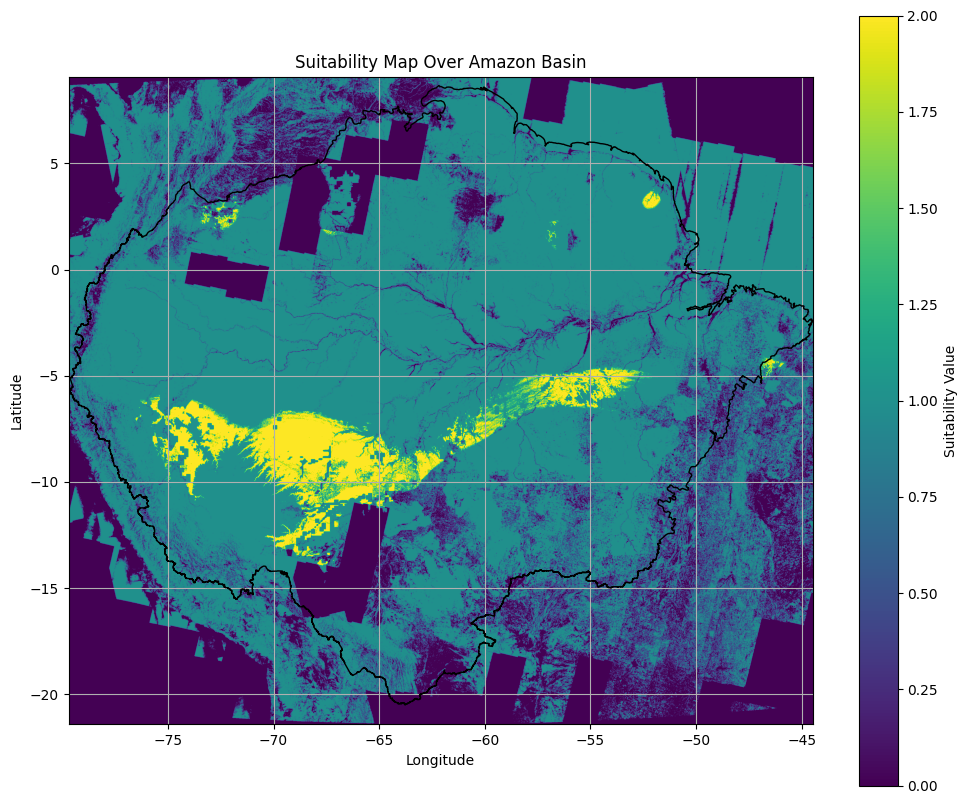

In [13]:
import rasterio
from rasterio.plot import show
import geopandas as gpd
import matplotlib.pyplot as plt

# Read the raster
raster_path = "/kaggle/input/combinedsuitability2/combined_suitability_map.tif"
with rasterio.open(raster_path) as src:
    raster_data = src.read(1)
    raster_extent = rasterio.plot.plotting_extent(src)
    raster_crs = src.crs

# Read your shapefile or GeoJSON
# Example: Amazon Basin
# gdf = gpd.read_file("path_to_amazon_basin.shp")  # already assumed to be read
# Ensure CRS match
if gdf.crs != raster_crs:
    gdf = gdf.to_crs(raster_crs)

# Plot
fig, ax = plt.subplots(figsize=(12, 10))

# Plot raster with extent
img = ax.imshow(raster_data, extent=raster_extent, cmap='viridis', origin='upper')
cbar = plt.colorbar(img, ax=ax, label='Suitability Value')

# Overlay gdf outline
gdf.boundary.plot(ax=ax, color='black', linewidth=1)

ax.set_title("Suitability Map Over Amazon Basin")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.grid(True)
plt.show()


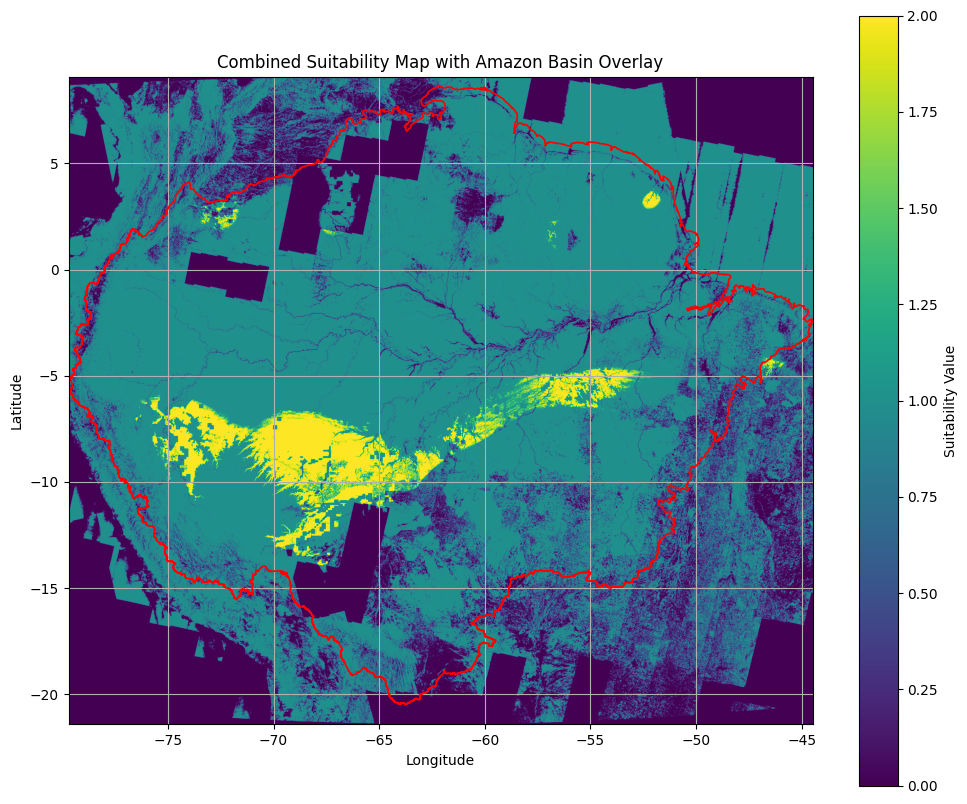

In [15]:
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.plot import plotting_extent

# Load raster
raster_path = "/kaggle/input/combinedsuitability2/combined_suitability_map.tif"
with rasterio.open(raster_path) as src:
    raster = src.read(1)
    extent = plotting_extent(src)
    raster_crs = src.crs

# Load shapefile or GeoJSON
# Example: Amazon basin shapefile
# gdf = gpd.read_file("/path/to/amazon_basin.shp")  # you already have this
# If not already loaded, load it here:
# gdf = gpd.read_file("/kaggle/input/amazon-shape/amazon_basin.shp")

# Reproject gdf to match raster CRS if needed
if gdf.crs != raster_crs:
    gdf = gdf.to_crs(raster_crs)

# Plotting
fig, ax = plt.subplots(figsize=(12, 10))

# Plot raster
img = ax.imshow(raster, extent=extent, cmap="viridis", origin="upper")
cbar = plt.colorbar(img, ax=ax, label='Suitability Value')

# Overlay shapefile
gdf.boundary.plot(ax=ax, color='red', linewidth=1.2)  # Change color/width if needed

# Labels and layout
ax.set_title("Combined Suitability Map with Amazon Basin Overlay")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.grid(True)
plt.show()


In [30]:
import base64
from io import BytesIO
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.plot import plotting_extent

# Load raster
raster_path = "/kaggle/input/combinedsuitability2/combined_suitability_map.tif"
with rasterio.open(raster_path) as src:
    raster = src.read(1)
    extent = plotting_extent(src)
    raster_crs = src.crs

# Ensure gdf is in same CRS
if gdf.crs != raster_crs:
    gdf = gdf.to_crs(raster_crs)

# Plot raster + overlay and export to base64
fig, ax = plt.subplots(figsize=(12, 10))

# Plot raster
img = ax.imshow(raster, extent=extent, cmap="viridis", origin="upper")
plt.colorbar(img, ax=ax, label='Suitability Value')

# Overlay gdf
gdf.boundary.plot(ax=ax, color='red', linewidth=1.2)

# Labels
ax.set_title("Combined Suitability Map with Survey Boundary Overlay")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.grid(True)

# Save plot to BytesIO and encode to base64
buffer = BytesIO()
plt.savefig(buffer, format="png", bbox_inches="tight")
buffer.seek(0)
img_base64_suitability = base64.b64encode(buffer.read()).decode("utf-8")
buffer.close()
plt.close()


# **Confirmation Evidence 1- Let's Look at a LiDAR Scene**


LiDAR data were obtained via[1] dos-Santos, Keller & Morton (2019)¶ LiDAR Surveys over Selected Forest Research Sites, Brazilian Amazon, 2008–2018 dos-Santos, M.N., Keller, M.M., & Morton, D.C. (2019) ORNL DAAC. https://doi.org/10.3334/ORNLDAAC/1644Fpr geoglyphs detection under the canopy, in here we used the example here to show the geoglyph under the canopy, and see what we can do to detect: https://www.kaggle.com/code/lauracatalano/acre-geoglyph-lidar
Huge kudos to this notebook and its creator Laura Catalano for showing us how to visualise elevation map from LAZ file and which laz file was included a geoglyph under canopy.



In [2]:
!pip install --no-cache-dir laspy[lazrs,laszip] numpy matplotlib open3d scipy
!pip show laspy lazrs laszip
!pip install laspy matplotlib numpy scipy
!pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 205.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 211.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.0/313.0 kB 300.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 640.9/640.9 kB 334.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.3/84.3 kB 216.1 MB/s eta 0:00:00
Name: laspy
Version: 2.5.4
Summary: Native Python ASPRS LAS read/write library
Home-page: https://github.com/laspy/laspy
Author: Grant Brown, Thomas Montaigu
Author-email: grant.brown73@gmail.com, thomas.montaigu@laposte.net
License: BSD
Location: /usr/local/lib/python3.11/dist-packages
Requires: numpy
Required-by: 
---
Name: lazrs
Version: 0.6.3
Summary: Python bindings for laz-rs
Home-page: 
Author: tmontaigu <thomas.montaigu@laposte.net>
Author-email: tmontaigu <thomas.montaigu@laposte.net>
License: MIT
Location: /usr/local/lib/python3.11/dist-packages
Requires: 
Requ

In [3]:
import pandas as pd
from shapely.geometry import box
import geopandas as gpd
from pyproj import Transformer, CRS
import laspy
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import rasterio
import rasterio.mask
import requests
from kaggle_secrets import UserSecretsClient
from osgeo import gdal
import json, logging, hashlib, random, tempfile, shutil, subprocess
import ee
import os
from sklearn.linear_model import RANSACRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import HuberRegressor
from sklearn.pipeline      import make_pipeline
from sklearn import set_config
from sklearn.metrics import mean_absolute_error
from matplotlib.colors import Normalize
import matplotlib.patheffects as pe
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
#from sentinelhub import SHConfig, BBox, SentinelHubRequest, DataCollection, MimeType, bbox_to_dimensions
import datetime

In [4]:
def load_secret(name):
    return UserSecretsClient().get_secret(name)

In [5]:
# This LiDAR process might take a while during running

laz_file_path = "/kaggle/input/acrelz/RIB_A01_2014_laz_2.laz"

print("Reading ground-classified points...")
with laspy.open(laz_file_path) as f:
    las = f.read()
    x, y, z = las.x, las.y, las.z
    if hasattr(las, "classification"):
        ground = las.classification == 2  # ASPRS ground code
        x, y, z = x[ground], y[ground], z[ground]
print(f"✅ Ground points extracted. ({len(x)} points)")

print("Setting up CRS transformer...")
src_crs = las.header.parse_crs()
if src_crs is None:
    src_crs = CRS.from_epsg(32719)  # fallback
transformer = Transformer.from_crs(src_crs, "EPSG:4326", always_xy=True)
print("✅ Transformer ready.")

print("Interpolating to DEM grids...")
grid_spacing = 1  # meters
x_min, x_max = x.min(), x.max()
y_min, y_max = y.min(), y.max()
grid_x, grid_y = np.meshgrid(
    np.arange(x_min, x_max, grid_spacing),
    np.arange(y_min, y_max, grid_spacing)
)

lidar_dem_ground = griddata((x, y), z, (grid_x, grid_y), method="linear")
print("✅ DEMs interpolated.")

print("Converting extent to geographic coordinates...")
lon_c, lat_c = transformer.transform(
    [x_min, x_max, x_min, x_max],
    [y_min, y_min, y_max, y_max]
)
lon_min, lon_max = min(lon_c), max(lon_c)
lat_min, lat_max = min(lat_c), max(lat_c)
print("✅ Geographic bounds computed.")

tiles_df = pd.read_csv("/kaggle/input/cmsbrazil/cms_brazil_lidar_tile_inventory.csv")

tiles_df["geometry"] = [
    box(row.min_lon, row.min_lat, row.max_lon, row.max_lat)
    for _, row in tiles_df.iterrows()
]

gdf_tiles = gpd.GeoDataFrame(
    tiles_df[["filename", "geometry"]],
    geometry="geometry",
    crs="EPSG:4326"
)

tile = gdf_tiles[gdf_tiles["filename"] == "ANT_A01_2011_laz_5.laz"]
tile_4326_bb = tile["geometry"].bounds.iloc[0]
bbox_coords = [tile_4326_bb["minx"], tile_4326_bb["miny"], tile_4326_bb["maxx"], tile_4326_bb["maxy"]]

Reading ground-classified points...
✅ Ground points extracted. (638265 points)
Setting up CRS transformer...
✅ Transformer ready.
Interpolating to DEM grids...
✅ DEMs interpolated.
Converting extent to geographic coordinates...
✅ Geographic bounds computed.


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


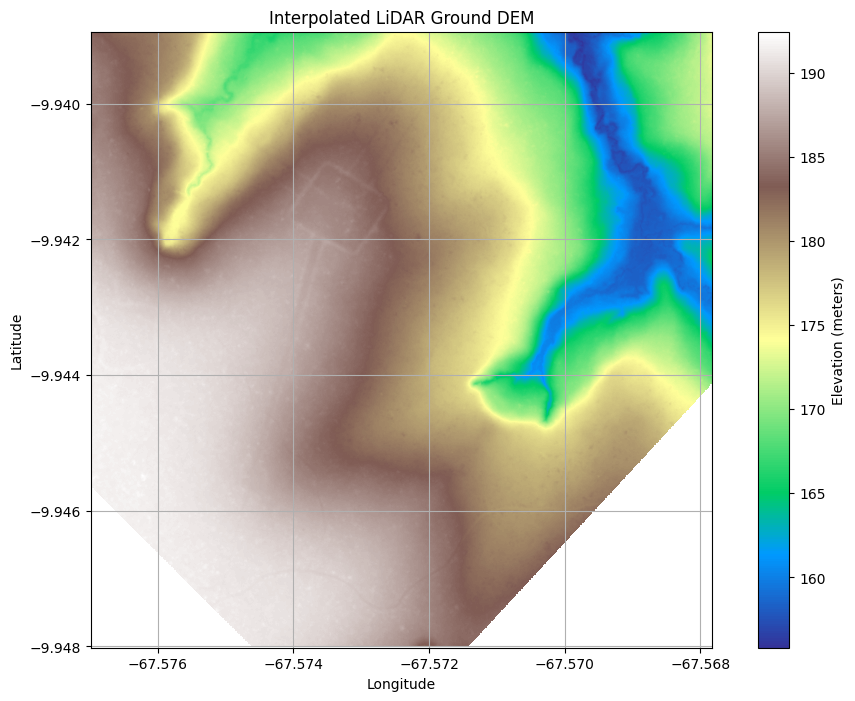

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
plt.imshow(
    lidar_dem_ground,
    extent=[lon_min, lon_max, lat_min, lat_max],
    cmap='terrain',
    origin='lower'
)
plt.colorbar(label='Elevation (meters)')
plt.title("Interpolated LiDAR Ground DEM")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()

iVBORw0KGgoAAAANSUhEUgAABwgAAASwCAYAAADv4h4DAAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuMiwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy8pXeV/AAAACXBIWXMAABcSAAAXEgFnn9JSAAEAAElEQVR4nOy9e7gsVXXu/VZV99prcxER


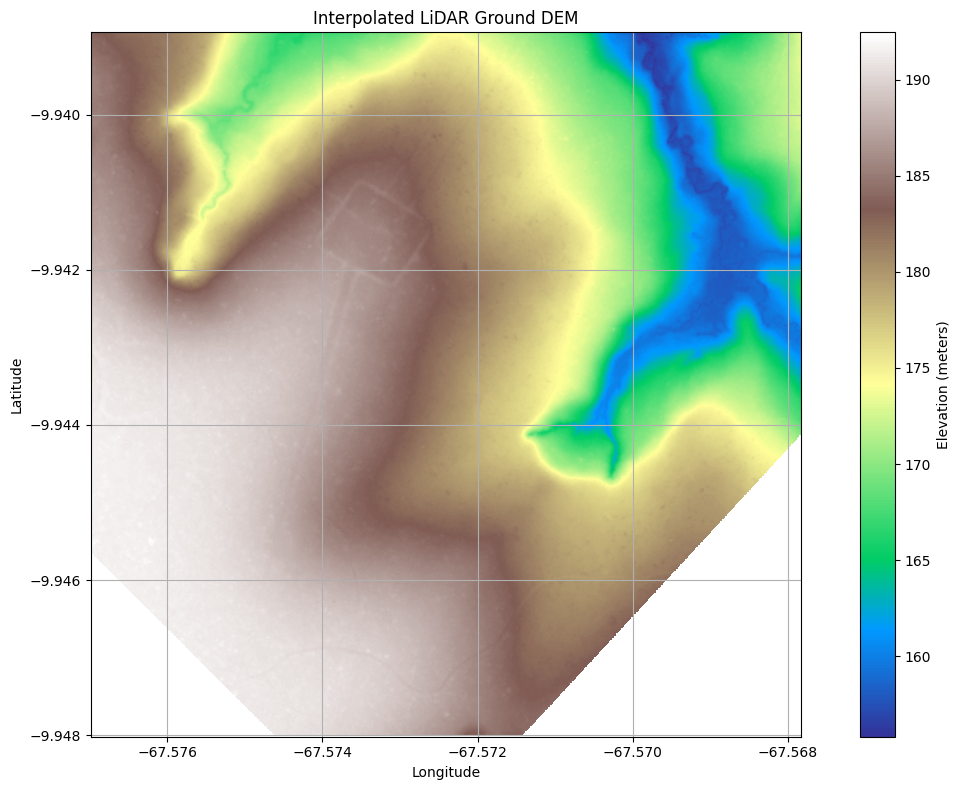

In [57]:
import matplotlib.pyplot as plt
from io import BytesIO
import base64

# Create the plot
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(
    lidar_dem_ground,
    extent=[lon_min, lon_max, lat_min, lat_max],
    cmap='terrain',
    origin='lower'
)
cbar = fig.colorbar(im, ax=ax, label='Elevation (meters)')
ax.set_title("Interpolated LiDAR Ground DEM")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.grid(True)

# Save to file and also buffer
png_path = "/kaggle/working/lidar_dem_ground.png"
plt.tight_layout()
plt.savefig(png_path, format="png", dpi=150)

# Convert to base64
buf = BytesIO()
plt.savefig(buf, format="png", dpi=150)
buf.seek(0)
b64_lidar_dem = base64.b64encode(buf.read()).decode("utf-8")

# Optional: print start of base64 string
print(b64_lidar_dem[:200])  # preview only


In [28]:
import base64
from io import BytesIO
import matplotlib.pyplot as plt
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# === Step 1: Plot and convert LiDAR DEM to base64 ===
plt.figure(figsize=(12, 8))
plt.imshow(
    lidar_dem_ground,  # Assumes this is already loaded in your environment
    extent=[lon_min, lon_max, lat_min, lat_max],
    cmap='terrain',
    origin='lower'
)
plt.colorbar(label='Elevation (meters)')
plt.title("Interpolated LiDAR Ground DEM")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)

# Save image to BytesIO
buffer = BytesIO()
plt.savefig(buffer, format="png", bbox_inches="tight")
buffer.seek(0)
img_base64 = base64.b64encode(buffer.read()).decode("utf-8")
image_data_uri = f"data:image/png;base64,{img_base64}"
buffer.close()
plt.close()

# === Step 2: Define prompt ===
prompt_text = """
You are a landscape archaeologist analyzing high-resolution LiDAR elevation data from the southwestern Amazon.

The terrain image provided shows interpolated ground elevation from airborne laser scanning.

Based on the visible patterns (e.g., mounds, ditches, straight lines, rectangular enclosures), identify if there are any man-made archaeological features such as:
- Geometric earthworks
- Raised fields
- Platform mounds
- Ring ditches
- Settlement structures

If there are no clearly identifiable features, say so. Avoid speculation.
Use only what is visually interpretable from the terrain model.
"""

# === Step 3: Setup OpenAI client ===
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# === Step 4: Send request to GPT-4o with vision ===
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": prompt_text},
                {"type": "image_url", "image_url": {"url": image_data_uri}}
            ]
        }
    ],
    temperature=0.3,
    max_tokens=800
)

# === Step 5: Print response ===
print(response.choices[0].message.content)


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


The terrain image shows a rectangular enclosure pattern in the central part of the image, which could suggest a man-made geometric earthwork. This feature is characterized by straight lines forming a clear rectangular shape. There are no obvious signs of raised fields, platform mounds, ring ditches, or settlement structures visible in this image.


In [32]:
import matplotlib.pyplot as plt
import base64
from io import BytesIO

# === LiDAR DEM image ===
plt.figure(figsize=(12, 8))
plt.imshow(lidar_dem_ground, extent=[lon_min, lon_max, lat_min, lat_max], cmap="terrain", origin="lower")
plt.colorbar(label="Elevation (meters)")
plt.title("Interpolated LiDAR Ground DEM")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)

buf_lidar = BytesIO()
plt.savefig(buf_lidar, format="png", bbox_inches="tight")
buf_lidar.seek(0)
img_base64_lidar = base64.b64encode(buf_lidar.read()).decode("utf-8")
buf_lidar.close()
plt.close()

# === Suitability Map image (assumes you've plotted and overlaid gdf already) ===
# Re-plot here if needed
plt.figure(figsize=(12, 8))
fig, ax = plt.subplots(figsize=(12, 10))
img = ax.imshow(raster, extent=extent, cmap="viridis", origin="upper")
plt.colorbar(img, ax=ax, label='Suitability Value')
gdf.boundary.plot(ax=ax, color='red', linewidth=1.2)
ax.set_title("Combined Suitability Map with Survey Overlay")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.grid(True)

buf_suit = BytesIO()
plt.savefig(buf_suit, format="png", bbox_inches="tight")
buf_suit.seek(0)
img_base64_suitability = base64.b64encode(buf_suit.read()).decode("utf-8")
buf_suit.close()
plt.close()


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


<Figure size 1200x800 with 0 Axes>

In [33]:
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# Assemble as image URIs
image_data_uri_suitability = f"data:image/png;base64,{img_base64_suitability}"
image_data_uri_lidar = f"data:image/png;base64,{img_base64_lidar}"

prompt_text = """
You are a landscape archaeologist comparing two sources of spatial data from the southwestern Amazon.

Image 1: A combined archaeological suitability map (derived from multisensor satellite and environmental data), overlaid with known survey boundaries.
Image 2: An interpolated LiDAR ground elevation model of the same region, showing detailed terrain features.

Your task is to:
1. Evaluate whether the high-suitability zones (in Image 1) visually align with plausible archaeological landforms in Image 2.
2. Identify any inconsistencies — e.g., high-suitability areas that lack clear landform evidence in the LiDAR.
3. Highlight any visible features (e.g., ring ditches, raised fields, geometric enclosures) in the LiDAR that validate or contradict suitability classifications.

Do not speculate. Use only what is visually observable across both images.
"""

# Call OpenAI
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {"role": "user", "content": [
            {"type": "text", "text": prompt_text},
            {"type": "image_url", "image_url": {"url": image_data_uri_suitability}},
            {"type": "image_url", "image_url": {"url": image_data_uri_lidar}}
        ]}
    ],
    temperature=0.3,
    max_tokens=1000
)

print(response.choices[0].message.content)


1. **Alignment of High-Suitability Zones with Landforms:**

   - In Image 1, the high-suitability zones are primarily in the central and southern parts of the map, indicated by the yellow areas.
   - In Image 2, these areas correspond to elevated terrain features, which are visible in the LiDAR model as areas with higher elevation (green and yellow shades).

2. **Inconsistencies:**

   - Some high-suitability zones in Image 1 do not have clear corresponding elevated features in Image 2. This suggests that while the suitability model predicts potential archaeological interest, the LiDAR does not show distinct landforms in all these areas.

3. **Visible Features in LiDAR:**

   - Image 2 shows detailed terrain features such as potential raised areas or ridges.
   - There are visible linear features that could suggest human modification, such as potential ring ditches or geometric enclosures, particularly in the northern part of the LiDAR image.
   - These features support some of the sui

In [34]:
import base64

# Path to image
river_image_path = "/kaggle/input/main-amazon-rivers-image/mainRivs.jpg"

# Read and convert to base64
with open(river_image_path, "rb") as f:
    img_base64_river = base64.b64encode(f.read()).decode("utf-8")

# Prepare as data URI
image_data_uri_river = f"data:image/jpeg;base64,{img_base64_river}"


In [35]:
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": prompt_text},
                {"type": "image_url", "image_url": {"url": image_data_uri_suitability}},
                {"type": "image_url", "image_url": {"url": image_data_uri_lidar}},
                {"type": "image_url", "image_url": {"url": image_data_uri_river}}  # 🆕 Added river map
            ]
        }
    ],
    temperature=0.3,
    max_tokens=1000
)

print(response.choices[0].message.content)


Based on the visual analysis of the provided images:

1. **Alignment of High-Suitability Zones with Landforms:**
   - In Image 1, the high-suitability zones are primarily in the central and southern parts of the map, indicated by yellow areas.
   - In Image 2, these areas correspond to elevated terrain features, which are plausible locations for archaeological sites due to their prominence and potential strategic advantages.

2. **Inconsistencies:**
   - There are some high-suitability areas in Image 1 that do not show distinct landform features in Image 2. This could suggest either an overestimation of suitability or limitations in the LiDAR data resolution.

3. **Visible Features in LiDAR:**
   - Image 2 shows several terrain features such as ridges and elevated areas. These could potentially correspond to archaeological features like raised fields or enclosures.
   - No clear ring ditches or geometric enclosures are distinctly visible, but the presence of elevated areas supports the

In [38]:
import base64
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# === Step 1: Prepare base64-encoded images ===

# Use your existing base64 strings (assumed to be generated earlier in your notebook)
image_data_uri_suitability = f"data:image/png;base64,{img_base64_suitability}"
image_data_uri_lidar = f"data:image/png;base64,{img_base64_lidar}"

# Convert river network image to base64
river_image_path = "/kaggle/input/main-amazon-rivers-image/mainRivs.jpg"
with open(river_image_path, "rb") as f:
    img_base64_rivers = base64.b64encode(f.read()).decode("utf-8")
image_data_uri_rivers = f"data:image/jpeg;base64,{img_base64_rivers}"

# === Step 2: Vision-enhanced prompt with context ===
prompt_text = """
You are a landscape archaeologist comparing three spatial data sources from the southwestern Amazon.

Image 1: A combined archaeological suitability map derived from multisensor satellite and environmental data, overlaid with known survey boundaries.
Image 2: An interpolated LiDAR ground elevation model of the same region, showing detailed terrain features.
Image 3: A cartographic visualization of the major river network in the Amazon basin.

Your task is to:

1. Evaluate whether the high-suitability zones (Image 1) visually align with plausible archaeological landforms in the LiDAR DEM (Image 2).
2. Identify any inconsistencies — for example, high-suitability areas that lack evident landform support in the LiDAR.
3. Examine the river network in Image 3 to determine whether the location of high-suitability zones or visible archaeological landforms appears to follow or cluster near rivers.
4. Highlight any visible features (e.g., ring ditches, raised fields, geometric enclosures) in the LiDAR that validate or contradict the suitability classifications.
5. Based only on visible spatial relationships, discuss how proximity to rivers might have influenced ancient settlement patterns in this region.

Avoid speculation. Base your analysis strictly on what is observable in the images.
"""

# === Step 3: OpenAI API client setup ===
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# === Step 4: Send multi-image vision prompt to GPT-4o ===
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": prompt_text},
                {"type": "image_url", "image_url": {"url": image_data_uri_suitability}},
                {"type": "image_url", "image_url": {"url": image_data_uri_lidar}},
                {"type": "image_url", "image_url": {"url": image_data_uri_rivers}}
            ]
        }
    ],
    temperature=0.3,
    max_tokens=1000
)

# === Step 5: Display GPT-4o response ===
print(response.choices[0].message.content)


1. **Alignment of High-Suitability Zones with LiDAR Landforms:**

   In Image 1, the high-suitability zones are primarily in the central and southern areas. In Image 2, the LiDAR DEM shows elevated terrain features in similar regions. This suggests a visual alignment between high-suitability zones and plausible archaeological landforms, such as elevated areas that could have been advantageous for settlement.

2. **Inconsistencies:**

   There are some high-suitability areas in Image 1 that do not have clear corresponding elevated features in the LiDAR DEM (Image 2). This could indicate areas where suitability is determined by factors other than elevation, such as soil fertility or proximity to resources.

3. **River Network Influence:**

   In Image 3, the major river network shows a dense concentration of rivers in the southwestern Amazon. The high-suitability zones in Image 1 appear to cluster near these rivers, suggesting that proximity to water sources was likely a significant fact

# **Confirmation Evidence 2- Look at Brazil Nut Distribution**

In the GBIF integration step, we queried occurrence records for Bertholletia excelsa (Brazil nut) using the pygbif API, filtered for valid geographic coordinates, and converted the results into a GeoDataFrame. We then reprojected the data to match the coordinate system of our existing spatial layer (gdf) and overlaid the geolocated species points on the map of the Amazon region to visualize their distribution relative to archaeological zones.
Brazil nuts are known to be found near archaeological sites- https://revistapesquisa.fapesp.br/en/more-people-in-the-rainforest/

In [39]:
# Step 1: Install pygbif (if not already installed)
!pip install -q pygbif geopandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.4/61.4 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.4/69.4 kB 4.2 MB/s eta 0:00:00


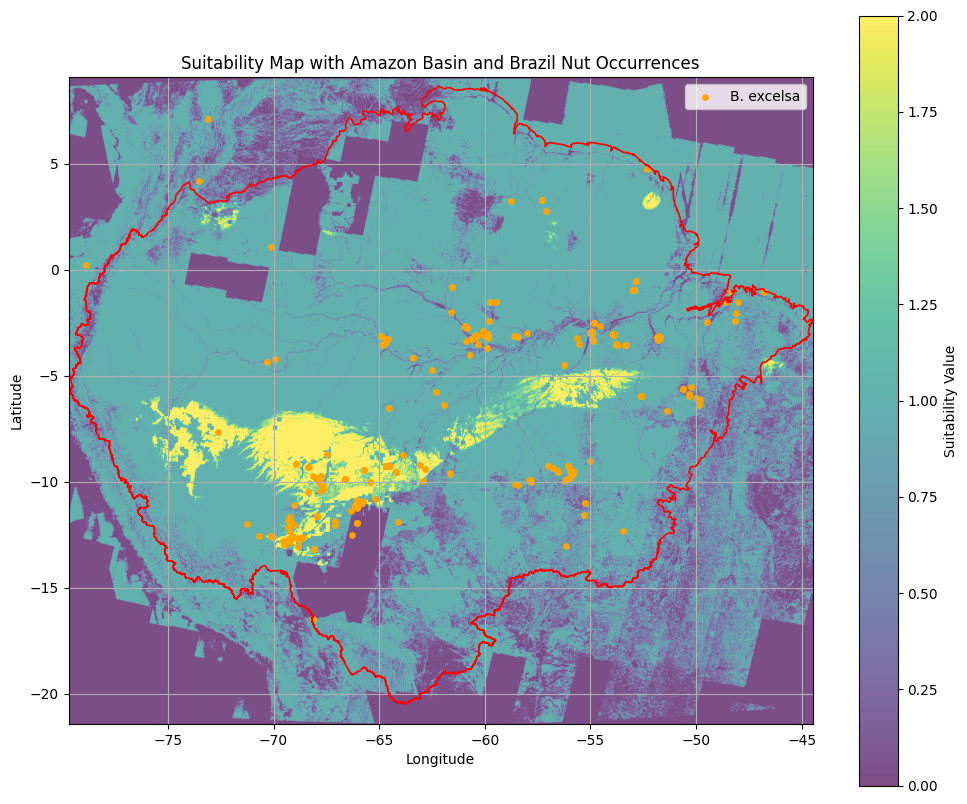

In [42]:
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.plot import plotting_extent

# === Load suitability raster ===
raster_path = "/kaggle/input/combinedsuitability2/combined_suitability_map.tif"
with rasterio.open(raster_path) as src:
    raster = src.read(1)
    extent = plotting_extent(src)
    raster_crs = src.crs

# === Assume gdf (Amazon basin boundary) and species_gdf (Brazil nut points) are already loaded ===
# Reproject gdf to raster CRS if needed
if gdf.crs != raster_crs:
    gdf = gdf.to_crs(raster_crs)

# Reproject species points to match raster CRS
if species_gdf.crs != raster_crs:
    species_gdf = species_gdf.to_crs(raster_crs)

# === Clip species points to raster extent ===
minx, maxx, miny, maxy = extent
species_gdf_clipped = species_gdf.cx[minx:maxx, miny:maxy]

# === Plotting ===
fig, ax = plt.subplots(figsize=(12, 10))

# Plot raster with transparency
img = ax.imshow(raster, extent=extent, cmap="viridis", origin="upper", alpha=0.7)
cbar = plt.colorbar(img, ax=ax, label='Suitability Value')

# Overlay Amazon basin boundary
gdf.boundary.plot(ax=ax, color='red', linewidth=1.2)

# Overlay clipped Brazil nut occurrences
species_gdf_clipped.plot(ax=ax, markersize=15, color='orange', marker='o', label='B. excelsa')

# Final layout
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_title("Suitability Map with Amazon Basin and Brazil Nut Occurrences")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend()
plt.grid(True)
plt.show()


In [51]:
import rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.plot import plotting_extent
from io import BytesIO
import base64

# === Load suitability raster ===
raster_path = "/kaggle/input/combinedsuitability2/combined_suitability_map.tif"
with rasterio.open(raster_path) as src:
    raster = src.read(1)
    extent = plotting_extent(src)
    raster_crs = src.crs

# === Assume gdf and species_gdf are already loaded ===
# Reproject to raster CRS if needed
if gdf.crs != raster_crs:
    gdf = gdf.to_crs(raster_crs)
if species_gdf.crs != raster_crs:
    species_gdf = species_gdf.to_crs(raster_crs)

# === Clip species points to raster extent ===
minx, maxx, miny, maxy = extent
species_gdf_clipped = species_gdf.cx[minx:maxx, miny:maxy]

# === Plotting ===
fig, ax = plt.subplots(figsize=(12, 10))
img = ax.imshow(raster, extent=extent, cmap="viridis", origin="upper", alpha=0.7)
cbar = plt.colorbar(img, ax=ax, label='Suitability Value')
gdf.boundary.plot(ax=ax, color='red', linewidth=1.2)
species_gdf_clipped.plot(ax=ax, markersize=15, color='orange', marker='o', label='B. excelsa')
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_title("Suitability Map with Amazon Basin and Brazil Nut Occurrences")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.legend()
plt.grid(True)

# === Convert to base64 ===
buffer = BytesIO()
plt.savefig(buffer, format="png", bbox_inches="tight")
buffer.seek(0)
img_base64_suitability_brazilnut = base64.b64encode(buffer.read()).decode("utf-8")
buffer.close()
plt.close()

# === Use the result ===
image_data_uri_brazilnut = f"data:image/png;base64,{img_base64_suitability_brazilnut}"


In a 2015 paper published in the scientific journal Proceedings of the Royal Society B, a group of researchers from Brazil and the United States showed that Brazil-nut trees seem to be concentrated in the areas of rich, black earth that surround many archaeological sites. The phenomenon is most evident around old human settlements near the Amazon and Madeira rivers, and to a lesser extent, in the Tapajós region- https://revistapesquisa.fapesp.br/en/more-people-in-the-rainforest/

In [43]:
import base64

# Path to the image
image_path = "/kaggle/input/brazilnut-n-sites/brazilNuts_sites.jpg"

# Read and encode to base64
with open(image_path, "rb") as f:
    img_base64_nut_sites = base64.b64encode(f.read()).decode("utf-8")

# Convert to data URI format (for GPT-4o input)
image_data_uri_nut_sites = f"data:image/jpeg;base64,{img_base64_nut_sites}"


In [52]:
import base64
from openai import OpenAI
from kaggle_secrets import UserSecretsClient

# === Step 1: Use your precomputed base64 maps ===
# image_data_uri_brazilnut: raster + gdf + Brazil nut locations
# image_data_uri_nut_sites: reference distribution of Brazil nuts
# (Assumes both img_base64_suitability_brazilnut and img_base64_nut_sites already exist)

image_data_uri_brazilnut = f"data:image/png;base64,{img_base64_suitability_brazilnut}"
image_data_uri_nut_sites = f"data:image/jpeg;base64,{img_base64_nut_sites}"

# === Step 2: Define the vision analysis prompt ===
prompt_text = """
You are a landscape ecologist and archaeobotanist evaluating whether the distribution of Brazil nut trees (Bertholletia excelsa) supports archaeological suitability predictions.

Image 1: A suitability map derived from satellite and environmental variables, with Brazil nut occurrence points overlaid. These high-suitability areas are being evaluated as potential ancient settlement zones.

Image 2: A reference map of known Brazil nut distribution and site observations.

Your tasks:
1. Determine whether the high-suitability areas in Image 1 align with regions where Brazil nut trees are present (based on both images).
2. Comment on any mismatches or unexpected patterns — e.g., highly suitable zones that lack Brazil nut presence, or Brazil nut clusters in areas of low suitability.
3. Based only on the visible spatial relationship, discuss whether the observed Brazil nut distribution could support the hypothesis that these zones hosted past human occupation or agroforestry management.

Do not speculate beyond the maps. Base your analysis only on visual overlap and spatial clustering.
"""

# === Step 3: Setup OpenAI GPT-4o client ===
user_secrets = UserSecretsClient()
openai_key = user_secrets.get_secret("OpenAI")
client = OpenAI(api_key=openai_key)

# === Step 4: Send multi-image prompt ===
response = client.chat.completions.create(
    model="gpt-4o",
    messages=[
        {
            "role": "user",
            "content": [
                {"type": "text", "text": prompt_text},
                {"type": "image_url", "image_url": {"url": image_data_uri_brazilnut}},
                {"type": "image_url", "image_url": {"url": image_data_uri_nut_sites}}
            ]
        }
    ],
    temperature=0.3,
    max_tokens=1000
)

# === Step 5: Print model's evaluation ===
print(response.choices[0].message.content)


1. **Alignment of High-Suitability Areas with Brazil Nut Presence:**

   In Image 1, the high-suitability areas (yellow) show a significant overlap with the occurrence points of Brazil nut trees (orange dots). This suggests that many of the high-suitability zones do indeed align with regions where Brazil nut trees are present.

   Comparing with Image 2, the distribution of Brazil nut trees (pink dots) also shows a general alignment with the high-suitability areas from Image 1, particularly in the central and southern parts of the Amazon Basin.

2. **Mismatches or Unexpected Patterns:**

   - There are some high-suitability areas in Image 1 that lack Brazil nut presence points, particularly in the northern regions. This could indicate either a lack of survey data or environmental factors not captured in the suitability model.
   
   - Conversely, there are clusters of Brazil nut trees in Image 2, especially in the eastern Amazon, that appear in areas of lower suitability in Image 1. Th

# **Lets look at Acre**

 

**Acre, a Brazillian state is the home to many archeological sites, including geoglyphs**

Official boundaries of acre- https://earthworks.stanford.edu/catalog/stanford-ht537bw2719

In [40]:
# Before running this code, install or check for these libraries
# !pip install geopandas folium

import requests
import geopandas as gpd
import folium

# Accept user input for the GeoServer URL and the typeName of the layer
geoserver_url = "https://geowebservices.stanford.edu/geoserver/wfs?"
type_name = "druid:ht537bw2719"

# Define the parameters for the WFS service
params = {
    'service': 'WFS',
    'version': '2.0.0',
    'request': 'GetFeature',
    'typeName': type_name,
    'outputFormat': 'application/json'
}

# Send a GET request to the GeoServer WFS service
response = requests.get(geoserver_url, params=params)

# Load the features from the WFS service into a GeoDataFrame
acre = gpd.read_file(response.text)

# Get the bounds of the GeoDataFrame
bounds = acre.total_bounds

# Calculate the center of the bounds
center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]

# Create the map
m = folium.Map(location=center, zoom_start=2)

# Add the GeoDataFrame to the map as a GeoJson layer
folium.GeoJson(acre).add_to(m)

# Display the map
m

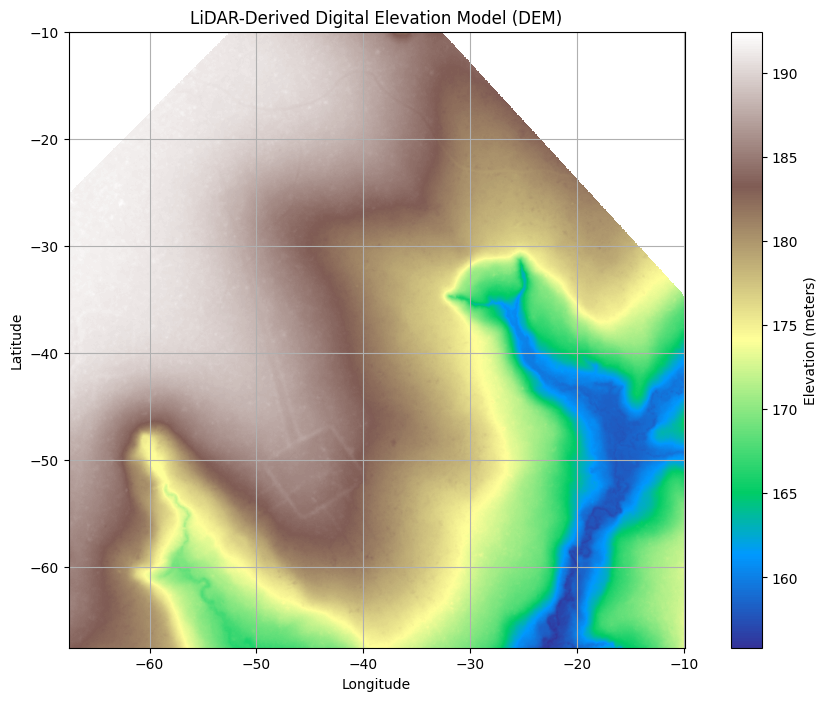

In [43]:
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import plotting_extent

# Path to the LiDAR DEM
lidar_dem_path = "/kaggle/input/lidardem/lidar_dem_ground.tif"

# Read and visualize
with rasterio.open(lidar_dem_path) as src:
    lidar_dem = src.read(1)
    extent = plotting_extent(src)

# Plot
plt.figure(figsize=(12, 8))
plt.imshow(lidar_dem, cmap="terrain", extent=extent, origin="upper")
plt.colorbar(label="Elevation (meters)")
plt.title("LiDAR-Derived Digital Elevation Model (DEM)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()



**Check the variable type of Acre**

In [ ]:
!pip install rasterio

In [41]:
import rasterio
from rasterio.mask import mask  # Explicit import
import numpy as np

# 1. Reset the environment (in case 'mask' was overwritten)
if 'mask' in globals():
    del mask
from rasterio.mask import mask  # Re-import

# 2. Verify geometry type
print(f"Acre geometry type: {type(acre.geometry)}")  # Should be GeoSeries

Acre geometry type: <class 'geopandas.geoseries.GeoSeries'>


**Lets clip the rasters o the extent of Acre**

In [ ]:
with rasterio.open(raster_path) as src:
    # Get pixel coordinates of Acre bounds
    minx, miny, maxx, maxy = acre.total_bounds
    window = src.window(minx, miny, maxx, maxy)
    subset = src.read(window=window)

# Now visualize subset (same plotting code as above)

In [ ]:
import rasterio
from rasterio.windows import Window

# Open your original raster
raster_path = '/kaggle/working/final_environmental_stack.tif'

with rasterio.open(raster_path) as src:
    # Create window for your subset
    minx, miny, maxx, maxy = acre.total_bounds  # Your bounding box
    window = src.window(minx, miny, maxx, maxy)
    
    # Read the subset
    subset = src.read(window=window)
    
    # Print band names (descriptions)
    print("Band Names:")
    for i in range(1, src.count + 1):
        print(f"Band {i}: {src.descriptions[i-1] if src.descriptions else 'No description'}")
    
    # Print additional band info
    print("\nBand Details:")
    for i in range(1, src.count + 1):
        print(f"Band {i}:")
        print(f"  Data type: {src.dtypes[i-1]}")
        print(f"  NoData value: {src.nodatavals[i-1]}")
        print(f"  Statistics: {src.statistics(i)}")

**Let's clean the raster to remove infinite and negative values**

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Visualize the first 6 bands with proper scaling
bands_to_show = min(6, subset.shape[0])  # Show up to 6 bands

plt.figure(figsize=(15, 8))
for i in range(bands_to_show):
    plt.subplot(2, 3, i+1)
    
    # Get current band and handle NaN/inf values
    band = subset[i].astype(float)
    band[~np.isfinite(band)] = np.nan  # Replace inf/-inf with NaN
    
    # Calculate percentiles for robust scaling
    p2, p98 = np.nanpercentile(band, [2, 98])
    
    # Display with optimized contrast
    plt.imshow(band, cmap='viridis', vmin=p2, vmax=p98)
    plt.colorbar(label='Values', shrink=0.7)
    
    # Add band statistics (using only valid values)
    valid_vals = band[~np.isnan(band)]
    plt.title(f'Band {i+1}\nMin: {np.min(valid_vals):.1f}\nMax: {np.max(valid_vals):.1f}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# Print basic info
print(f"Displaying bands 1-{bands_to_show} of {subset.shape[0]} total bands")
print(f"Window dimensions: {subset.shape[1]} rows x {subset.shape[2]} columns")

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

# Path to raster
raster_path = "/kaggle/working/final_environmental_stack.tif"

# Open and extract raster within acre bounding box
with rasterio.open(raster_path) as src:
    minx, miny, maxx, maxy = acre.total_bounds
    window = src.window(minx, miny, maxx, maxy)
    transform = src.window_transform(window)
    subset = src.read(window=window)
    nodata = src.nodata

# Replace nodata (-9999) with np.nan
subset = np.where(subset == nodata, np.nan, subset)

# Interpolate each band using nearest-neighbor fill
def fill_nan_band(band):
    mask = np.isnan(band)
    filled = band.copy()
    filled[mask] = ndimage.generic_filter(
        band, 
        function=lambda values: np.nanmean(values), 
        size=3,
        mode='nearest'
    )[mask]
    return filled

filled_subset = np.array([fill_nan_band(band) for band in subset])

# Visualize the first few bands
fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for i in range(5):
    ax = axes[i]
    ax.imshow(filled_subset[i], cmap='viridis')
    ax.set_title(f"Band {i+1}")
    ax.axis('off')
plt.tight_layout()
plt.show()


**Check if the geographic coordinates are there**

In [ ]:
import numpy as np
import rasterio

# Assume transform is the affine from your clipped raster
bands, height, width = filled_subset.shape

# Generate grid of row and column indices
rows, cols = np.meshgrid(np.arange(height), np.arange(width), indexing="ij")

# Compute flattened coordinates
xs, ys = rasterio.transform.xy(transform, rows.flatten(), cols.flatten(), offset='center')

# Reshape back to 2D arrays matching raster dimensions
xs = np.array(xs).reshape((height, width))
ys = np.array(ys).reshape((height, width))

# Confirm sample point
print("Sample (x, y) at (0, 0):", xs[0, 0], ys[0, 0])


In [ ]:
import numpy as np
import pandas as pd
from rasterio.transform import xy

# Shape: (bands, height, width)
bands, height, width = filled_subset.shape

# Reshape to (height * width, bands)
data = filled_subset.transpose(1, 2, 0).reshape(-1, bands)

# Compute pixel coordinates
rows, cols = np.meshgrid(np.arange(height), np.arange(width), indexing="ij")
xs, ys = rasterio.transform.xy(transform, rows, cols)
x_coords = np.array(xs).flatten()
y_coords = np.array(ys).flatten()

# Build DataFrame
df_pixels = pd.DataFrame(data, columns=[
    "bio04_temperature_seasonality",
    "bio19_precipitation_coldest_quarter",
    "bio07_temperature_annual_range",
    "bio18_precipitation_warmest_quarter",
    "bio03_isothermality",
    "bio05_max_temp_warmest_month",
    "bio02_mean_diurnal_range",
    "bio15_precipitation_seasonality",
    "soil_clay_content",
    "soil_ph",
    "soil_organic_carbon",
    "soil_texture",
    "brazilnut_sdm",
    "tree_species_richness",
    "elevation",
    "slope_degrees",
    "floodplain_mask"
])
df_pixels["x"] = x_coords
df_pixels["y"] = y_coords


In [ ]:
# Drop NaNs before computing stats
stats = df_pixels.describe()
print(stats)


**The corrected Acre-scale raster where coordinates are present**

In [ ]:
import matplotlib.pyplot as plt

# Pick a band to visualize
band_name = "bio04_temperature_seasonality"

plt.figure(figsize=(8, 6))
plt.scatter(df_pixels["x"], df_pixels["y"], c=df_pixels[band_name],
            cmap="viridis", s=1, alpha=0.7)
plt.colorbar(label=band_name)
plt.title(f"Spatial Distribution of {band_name}")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.gca().set_aspect("equal")
plt.show()


**Implement PCA on the Acre boundary**

In [ ]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Check the shape first
data = df_pixels.to_numpy()
print("Data shape:", data.shape)  # Expecting (height * width, bands)

# If shape is (n_pixels, n_bands), proceed directly
valid_mask = ~np.isnan(data).any(axis=1)
X_clean = data[valid_mask]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_clean)

# PCA
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# Optionally print variance explained
print("Explained variance ratio:", pca.explained_variance_ratio_)


In [ ]:
# Reduce to 95% variance
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

print(f"Reduced to {pca.n_components_} components")
print("Explained variance ratio:", pca.explained_variance_ratio_)

**Look at the archaeological types**

In [ ]:
import pandas as pd

# Read the CSV file
csv_path = '/kaggle/input/different-archaeological-types/filtered_points.csv'
arch_points = pd.read_csv(csv_path)

# Show the first few rows of the data
arch_points.head()


In [ ]:
 # Replace missing values (NaNs) in 'type' column with a default type or category (optional)
arch_points['type'] = arch_points['type'].fillna('Unknown')


In [ ]:
unique_types = arch_points['type'].dropna().unique()
print("Unique 'type' values in arch_points:")
for t in unique_types:
    print("-", t)


In [ ]:
from shapely.geometry import Point
import geopandas as gpd

# Convert to GeoDataFrame
geometry = [Point(xy) for xy in zip(arch_points['POINT_X'], arch_points['POINT_Y'])]
arch_points = gpd.GeoDataFrame(arch_points, geometry=geometry, crs="EPSG:4326")  # WGS84

# Verify
print(arch_points.head())
print(f"CRS: {arch_points.crs}")


In [ ]:
# Required imports
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from shapely.geometry import Point
import geopandas as gpd

# Assume df_pixels: shape (n_pixels, n_bands), with coordinates in coord_cols
# Assume arch_points is a GeoDataFrame with 'geometry' column in EPSG:4326
# and 'type' column representing archaeological class labels

# Step 1: Ensure same CRS and convert arch_points to projected CRS if needed
arch_points = arch_points.to_crs("EPSG:4326")  # WGS84

# Step 2: Create spatial index from df_pixels
# Assume pixel_coords: (n_pixels, 2) array of (lon, lat)
pixel_coords = df_pixels[["x", "y"]].values

# Step 3: Extract raster values at each archaeological point
from scipy.spatial import cKDTree

# KD-Tree for fast nearest-neighbor lookup
pixel_tree = cKDTree(pixel_coords)

# Get point coordinates
site_coords = np.array([(geom.x, geom.y) for geom in arch_points.geometry])

# Find nearest pixel index for each point (max distance ~1 pixel size)
distances, indices = pixel_tree.query(site_coords, distance_upper_bound=0.002)

# Filter valid matches
valid_mask = (distances != np.inf)
valid_points = arch_points[valid_mask].copy()
matched_indices = indices[valid_mask]

# Get features from df_pixels
X_train = df_pixels.iloc[matched_indices].drop(columns=["x", "y"]).values
y_train = valid_points["type"].values

# Step 4: Encode labels
le = LabelEncoder()
y_encoded = le.fit_transform(y_train)

print("✅ Training set prepared:")
print(f"Samples: {X_train.shape[0]}, Features: {X_train.shape[1]}")
print("Classes:", le.classes_)


In [ ]:
# === Train Random Forest Model ===
rf = RandomForestClassifier(n_estimators=200, random_state=42)
rf.fit(X_train, y_encoded)

print("✅ Random Forest model trained.")

In [ ]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier

# Assuming:
# X_train is numpy array (n_samples, n_features)
# df_pixels is DataFrame with feature columns + ['x','y']
# rf is trained RandomForestClassifier

# 1. Get feature names from df_pixels (excluding coordinates)
feature_cols = [col for col in df_pixels.columns if col not in ['x', 'y']]

# 2. Prepare prediction data (ensure same order as training)
X_raster = df_pixels[feature_cols].values  # Convert to numpy array

# 3. Create valid pixel mask
valid_mask = ~np.isnan(X_raster).any(axis=1)
X_raster_clean = X_raster[valid_mask]

# 4. Predict
y_pred_flat = rf.predict(X_raster_clean)

# 5. Get grid dimensions from coordinates
x_coords = df_pixels['x'].unique()
y_coords = df_pixels['y'].unique()
width = len(x_coords)
height = len(y_coords)

# 6. Create output array
pred_raster = np.full(len(df_pixels), np.nan)
pred_raster[valid_mask] = y_pred_flat

# 7. Reshape to 2D (sort by y descending, x ascending)
df_sorted = df_pixels.sort_values(['y', 'x'], ascending=[False, True])
pred_raster_2d = pred_raster[df_pixels.index.get_indexer(df_sorted.index)].reshape(height, width)

# 8. Visualize
#import matplotlib.pyplot as plt
#plt.figure(figsize=(12, 8))
#plt.imshow(pred_raster_2d, cmap='tab10')
#plt.colorbar()
#plt.title("Archaeological Type Predictions")
#plt.axis('off')
#plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

# Assuming:
# pred_raster_2d - your 2D prediction array
# le - your LabelEncoder object (from y_train_encoded = le.fit_transform(y_train))

# 1. Create discrete colormap
n_classes = len(le.classes_)
colors = plt.cm.tab10(np.linspace(0, 1, n_classes))  # Or use another colormap
cmap = ListedColormap(colors[:n_classes])

# 2. Plot with discrete colors
plt.figure(figsize=(12, 8))
im = plt.imshow(pred_raster_2d, 
                cmap=cmap,
                vmin=-0.5,
                vmax=n_classes-0.5)

# 3. Create proper colorbar
cbar = plt.colorbar(im, ticks=np.arange(n_classes))
cbar.ax.set_yticklabels(le.classes_)  # Set actual class names

#plt.title("Archaeological Type Predictions")
#plt.axis('off')
#plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Get predicted probabilities (n_samples × n_classes)
probs = rf.predict_proba(X_raster_clean)  # Ensure X_raster_clean matches training features

# Create a single figure with subplots for each class
fig, axes = plt.subplots(1, len(le.classes_), figsize=(20, 5))

# Normalize all plots to same scale
norm = Normalize(vmin=0, vmax=1)

for i, (class_name, ax) in enumerate(zip(le.classes_, axes)):
    # Reshape probabilities for this class
    prob_map = np.full(len(df_pixels), np.nan)
    prob_map[valid_mask] = probs[:, i]
    prob_map_2d = prob_map.reshape(height, width)
    
    # Plot with consistent colorscale
    im = ax.imshow(prob_map_2d, cmap='RdYlGn', norm=norm)
    ax.set_title(f'{class_name} Probability')
    ax.axis('off')

# Add single colorbar for all subplots
cbar = fig.colorbar(im, ax=axes, fraction=0.02, pad=0.04)
cbar.set_label('Prediction Probability', rotation=270, labelpad=20)

plt.tight_layout()
plt.show()

In [ ]:
for i, class_name in enumerate(le.classes_):
    plt.figure(figsize=(10, 8))
    
    # Create mask for valid pixels
    prob_map = np.full((height, width), np.nan)
    prob_map[valid_mask.reshape(height, width)] = probs[:, i]
    
    # Plot with hillshade effect
    plt.imshow(prob_map, cmap='RdYlGn', vmin=0, vmax=1)
    plt.colorbar(label='Probability', shrink=0.7)
    plt.title(f'Probability: {class_name}', pad=20)
    
    # Add grid lines (optional)
    plt.grid(True, color='black', linestyle=':', alpha=0.1)
    plt.axis('off')
    plt.show()

**Let's examine the ceremonial centre**

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Create figure
fig, ax = plt.subplots(figsize=(12, 10))

# Get index for ceremonial centres
class_idx = list(le.classes_).index('ceremonial centres')

# Prepare probability array
prob_map = np.full((height, width), np.nan)
prob_map[valid_mask.reshape(height, width)] = probs[:, class_idx]

# Plot probability heatmap
im = ax.imshow(prob_map, 
              cmap='RdYlGn', 
              norm=Normalize(0, 1),
              alpha=0.9)

# Overlay Acre boundary (as GeoSeries)
acre.boundary.plot(ax=ax, 
                  color='black',
                  linewidth=2,
                  linestyle='-')

# Add colorbar
cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Probability', rotation=270, labelpad=20)

# Formatting
ax.set_title('Ceremonial Centres Probability', fontsize=14, pad=20)
ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Create figure with PlateCarree projection
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Get ceremonial centres probabilities
class_idx = list(le.classes_).index('ceremonial centres')
prob_map = np.full((height, width), np.nan)
prob_map[valid_mask.reshape(height, width)] = probs[:, class_idx]

# Plot probability heatmap
im = ax.imshow(prob_map,
              cmap='RdYlGn',
              norm=Normalize(0, 1),
              alpha=0.9,
              extent=[df_pixels['x'].min(), df_pixels['x'].max(),  # xmin, xmax
                     df_pixels['y'].min(), df_pixels['y'].max()], # ymin, ymax
              transform=ccrs.PlateCarree())

# Overlay Acre boundary (make sure it's in same CRS)
ax.add_geometries(acre.geometry,
                 crs=ccrs.PlateCarree(),
                 facecolor='none',
                 edgecolor='black',
                 linewidth=2)

# Add gridlines with labels
gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# Add colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('Probability', rotation=270, labelpad=20)



# Title and formatting
ax.set_title('Ceremonial Centres Probability with Acre Boundary', pad=20)
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import geopandas as gpd

# Load Amazon river network
river_files = {
    'shp': '/kaggle/input/amazon-basin-rivers/amzrivnet_v.shp',
    'prj': '/kaggle/input/amazon-basin-rivers/amzrivnet_v.prj',
    'dbf': '/kaggle/input/amazon-basin-rivers/amzrivnet_v.dbf',
    'shx': '/kaggle/input/amazon-basin-rivers/amzrivnet_v.shx'
}
rivers = gpd.read_file(river_files['shp']).to_crs(epsg=4326)  # Ensure WGS84

# Create figure
fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Plot probability heatmap
class_idx = list(le.classes_).index('ceremonial centres')
prob_map = np.full((height, width), np.nan)
prob_map[valid_mask.reshape(height, width)] = probs[:, class_idx]

im = ax.imshow(prob_map,
              cmap='RdYlGn',
              norm=Normalize(0, 1),
              alpha=0.85,  # Probability layer transparency
              extent=[df_pixels['x'].min(), df_pixels['x'].max(),
                     df_pixels['y'].min(), df_pixels['y'].max()],
              transform=ccrs.PlateCarree())

# Add Amazon rivers with adjustable transparency (0-1)
rivers.plot(ax=ax,
           color='blue',
           linewidth=0.8,
           alpha=0.4,  # River transparency (adjust this value)
           label='Amazon Rivers')

# Add Acre boundary
acre.boundary.plot(ax=ax,
                  edgecolor='black',
                  linewidth=2,
                  alpha=0.9)

# Add gridlines
gl = ax.gridlines(draw_labels=True, linestyle=':', alpha=0.5)
gl.top_labels = False
gl.right_labels = False

# Add colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.7, pad=0.05)
cbar.set_label('Ceremonial Centre Probability', rotation=270, labelpad=25)

# Add legend and title
ax.legend(loc='upper right')
ax.set_title('Ceremonial Centres Probability with Amazon River Network', pad=20, fontsize=14)

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.mpl.ticker as cticker

fig = plt.figure(figsize=(14, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# Set extent to match your data bounds
ax.set_extent([
    df_pixels['x'].min(), df_pixels['x'].max(),
    df_pixels['y'].min(), df_pixels['y'].max()
], crs=ccrs.PlateCarree())

# Add probability map (your existing code)
im = ax.imshow(prob_map, cmap='RdYlGn', norm=Normalize(0, 1), alpha=0.85,
              extent=[df_pixels['x'].min(), df_pixels['x'].max(),
                     df_pixels['y'].min(), df_pixels['y'].max()],
              transform=ccrs.PlateCarree())

# Configure gridlines with proper formatting
gl = ax.gridlines(draw_labels=True, linestyle='--', alpha=0.5)
gl.xlocator = cticker.LongitudeLocator()
gl.ylocator = cticker.LatitudeLocator()
gl.xformatter = cticker.LongitudeFormatter(zero_direction_label=True)
gl.yformatter = cticker.LatitudeFormatter()

# Control label placement
gl.top_labels = False
gl.right_labels = False
gl.bottom_labels = True
gl.left_labels = True

# Adjust label frequency if needed
gl.xlocator = cticker.LongitudeLocator(nbins=6)
gl.ylocator = cticker.LatitudeLocator(nbins=6)

# Add other elements (rivers, Acre boundary, etc.)
rivers.plot(ax=ax, color='blue', linewidth=0.8, alpha=0.4)
acre.boundary.plot(ax=ax, edgecolor='black', linewidth=2, alpha=0.9)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, shrink=0.7, pad=0.05)
cbar.set_label('Ceremonial Centre Probability', rotation=270, labelpad=25)

plt.title('Ceremonial Centres Probability with Amazon River Network', pad=20)
plt.tight_layout()
plt.show()

**Let's do sense check with the RAG Model I created before**

In [ ]:
import io

In [ ]:
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.output_parsers import StrOutputParser
from PIL import Image
import base64

# 1. Image Processing Function
def prepare_image_for_rag(fig):
    """Convert matplotlib figure to base64 text description"""
    buf = io.BytesIO()
    fig.savefig(buf, format='png', dpi=150)
    img_str = base64.b64encode(buf.getvalue()).decode('utf-8')
    
    # Basic image description
    width, height = fig.get_size_inches()*fig.dpi
    return f"""
    ARCHAEOLOGICAL PROBABILITY MAP METADATA:
    - Dimensions: {width:.0f}x{height:.0f} pixels
    - Color scale: Red (high prob) to Green (low prob)
    - Coordinate range: 
      Lon: {df_pixels['x'].min():.2f}°W to {df_pixels['x'].max():.2f}°W
      Lat: {df_pixels['y'].min():.2f}°S to {df_pixels['y'].max():.2f}°S
    - Base64 Image: {img_str[:100]}...[truncated]
    """

# 2. Enhanced Prompt Template
archaeo_qa_prompt = ChatPromptTemplate.from_template("""
You are an archaeological analyst with access to research papers and site data.

CONTEXT FROM LITERATURE:
{context}

IMAGE ANALYSIS:
{image_metadata}

QUESTION:
{question}

INSTRUCTIONS:
1. Cross-reference patterns with known settlement principles
2. Identify 3 most relevant papers from metadata
3. Highlight any contradictions with established theories
4. Rate confidence in findings (1-5)
""")

# 3. Analysis Chain
def analyze_with_rag(fig, question):
    # Prepare inputs
    image_desc = prepare_image_for_rag(fig)
    relevant_docs = retriever.get_relevant_documents(question)
    
    # Format context
    context = "\n\n".join(
        f"Source: {doc.metadata['source']}\nContent: {doc.page_content}" 
        for doc in relevant_docs
    )
    
    # Generate analysis
    chain = archaeo_qa_prompt | llm | StrOutputParser()
    return chain.invoke({
        "context": context,
        "image_metadata": image_desc,
        "question": question
    })

# Usage Example
fig = plt.gcf()  # Get current probability map
analysis = analyze_with_rag(
    fig,
    "Do high-probability areas align with known settlement patterns near rivers?"
)
print(analysis)

In [ ]:
import rasterio
from rasterio.transform import from_origin
import numpy as np

# STEP 1: Setup spatial grid
# Assumes x and y are sorted; otherwise sort them
x_unique = np.sort(df_pixels['x'].unique())
y_unique = np.sort(df_pixels['y'].unique())[::-1]  # descending for top-to-bottom raster

width = len(x_unique)
height = len(y_unique)
res_x = abs(x_unique[1] - x_unique[0])
res_y = abs(y_unique[1] - y_unique[0])

# Create affine transform (top-left origin)
transform = from_origin(x_unique[0], y_unique[0], res_x, res_y)

# STEP 2: Define bands to write
band_columns = [col for col in df_pixels.columns if col not in ['x', 'y']]
band_count = len(band_columns)

# STEP 3: Sort and reshape each band
df_sorted = df_pixels.sort_values(['y', 'x'], ascending=[False, True])
bands_array = []

for band in band_columns:
    band_data = df_sorted[band].to_numpy().reshape((height, width))
    bands_array.append(band_data)

bands_stack = np.stack(bands_array)  # shape: (bands, height, width)

# STEP 4: Write GeoTIFF
output_path = "/kaggle/working/df_pixels_multiband.tif"

with rasterio.open(
    output_path,
    "w",
    driver="GTiff",
    height=height,
    width=width,
    count=band_count,
    dtype=bands_stack.dtype,
    crs="EPSG:4326",  # Update if using different CRS
    transform=transform,
) as dst:
    for i in range(band_count):
        dst.write(bands_stack[i, :, :], i + 1)

print(f"✅ GeoTIFF saved to: {output_path}")


**include Sentinel 1 and 2 bands**

Code for obtaining S1 and S2 bands- https://www.kaggle.com/code/minervasdatalab/geesatellite

In [ ]:
import rasterio
import numpy as np

# Load Sentinel-1 image
s1_path = "/kaggle/input/sentinel-1-acre-bands/s1acre_2024.tif"

with rasterio.open(s1_path) as src:
    print("Number of bands:", src.count)
    print("Image shape (height, width):", src.height, src.width)
    
    band1 = src.read(1)
    band2 = src.read(2)

# Print basic stats
print("📊 Band 1 stats:")
print("  Min:", np.nanmin(band1), "Max:", np.nanmax(band1), "Mean:", np.nanmean(band1))

print("📊 Band 2 stats:")
print("  Min:", np.nanmin(band2), "Max:", np.nanmax(band2), "Mean:", np.nanmean(band2))


In [ ]:
import matplotlib.pyplot as plt

def plot_band(band_data, title, vmin=-25, vmax=5):
    plt.figure(figsize=(10, 6))
    im = plt.imshow(band_data, cmap='viridis', vmin=vmin, vmax=vmax)
    plt.colorbar(im, label='Backscatter (dB)')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Plot with better contrast
plot_band(band1, "Sentinel-1: Band 1 (Adjusted Range)", vmin=-30, vmax=0)
plot_band(band2, "Sentinel-1: Band 2 (Adjusted Range)", vmin=-30, vmax=0)


In [ ]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np

# Load Sentinel-2 raster
s2_path = "/kaggle/input/s2-amazon-bands/s2_2024.tif"

with rasterio.open(s2_path) as src:
    num_bands = src.count
    height, width = src.height, src.width
    print(f"📦 Sentinel-2 has {num_bands} bands with shape ({height}, {width})")

    # Loop through bands and plot
    for i in range(1, num_bands + 1):
        band = src.read(i).astype(np.float32)

        # Clip to 2nd and 98th percentile for visualization
        vmin, vmax = np.nanpercentile(band, [2, 98])

        plt.figure(figsize=(10, 6))
        plt.imshow(band, cmap='viridis', vmin=vmin, vmax=vmax)
        plt.colorbar(label='Reflectance (scaled)')
        plt.title(f"Sentinel-2: Band {i}")
        plt.axis('off')
        plt.show()


In [ ]:
import rasterio
import pandas as pd
import numpy as np

# Load the new Sentinel-2 raster
s2_path = "/kaggle/input/s2-amazon-bands/s2_2024.tif"

with rasterio.open(s2_path) as src:
    # Read and flatten each band into 1D arrays
    s2_bands = []
    for i in range(1, src.count + 1):
        band = src.read(i)
        band_flat = band.flatten()
        s2_bands.append(band_flat)
    
    # Stack and form DataFrame
    s2_array = np.vstack(s2_bands).T  # shape: (n_pixels, n_bands)
    s2_df = pd.DataFrame(s2_array, columns=[f"s2_band_{i}" for i in range(1, src.count + 1)])

# Merge with existing df_pexels — assume same spatial alignment
df_pixels_s2 = df_pixels.reset_index(drop=True).join(s2_df)

# Optional: check shape
print("Original:", df_pixels.shape, "→ Merged:", df_pixels_s2.shape)


In [ ]:
print(df_pixels_s2.columns)


In [ ]:
import rasterio
from rasterio.warp import reproject, Resampling
import numpy as np

# === STEP 1: Open S2 as reference for shape, transform, CRS ===
s2_path = "/kaggle/input/s2-amazon-bands/s2_2024.tif"
s1_path = "/kaggle/input/sentinel-1-acre-bands/s1acre_2024.tif"

with rasterio.open(s2_path) as s2:
    ref_crs = s2.crs
    ref_transform = s2.transform
    ref_shape = (s2.height, s2.width)

# === STEP 2: Open Sentinel-1 and resample each band ===
with rasterio.open(s1_path) as s1:
    s1_resampled_bands = []

    for i in range(1, s1.count + 1):
        source = s1.read(i)
        destination = np.empty(ref_shape, dtype=source.dtype)

        reproject(
            source,
            destination,
            src_transform=s1.transform,
            src_crs=s1.crs,
            dst_transform=ref_transform,
            dst_crs=ref_crs,
            resampling=Resampling.bilinear  # You can use nearest for classification, bilinear for continuous
        )

        s1_resampled_bands.append(destination.flatten())

# === STEP 3: Create DataFrame from resampled S1 ===
s1_resampled_array = np.vstack(s1_resampled_bands).T
s1_resampled_df = pd.DataFrame(s1_resampled_array, columns=[f"s1_band_{i}" for i in range(1, len(s1_resampled_bands) + 1)])

# === STEP 4: Merge with df_pixels_s2 ===
df_pixels_s2_s1 = df_pixels_s2.reset_index(drop=True).join(s1_resampled_df)

print("✅ Merged shape:", df_pixels_s2_s1.shape)
df_pixels_s2_s1.head()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Sort pixels by y descending, x ascending for consistent grid layout
df_sorted = df_pixels_s2_s1.sort_values(['y', 'x'], ascending=[False, True])

# Step 2: Get grid dimensions
x_unique = np.sort(df_pixels_s2_s1['x'].unique())
y_unique = np.sort(df_pixels_s2_s1['y'].unique())
width = len(x_unique)
height = len(y_unique)

# Step 3: Choose a band to visualize
band_to_plot = 's1_band_1'  # or 's2_band_4', etc.

# Step 4: Reshape and plot
band_flat = df_sorted[band_to_plot].values
band_2d = band_flat.reshape((height, width))

plt.figure(figsize=(10, 8))
plt.imshow(band_2d, cmap='viridis')
plt.title(f"Visualization of {band_to_plot}")
plt.colorbar(label='Reflectance / Intensity')
plt.axis('off')
plt.show()


# -------------------------------------------------------------------------------------------